# Data Analysis Using Python: A Beginner’s Guide Featuring NYC Open Data  
## Part 4: Working with geospatial data and mapping

Mark Bauer

Table of Contents
=================

   * [1. Importing Libraries](#1-Importing-Libraries)
       
       
   * [2. Reading and Writing Files](#2-Reading-and-Writing-Files)
       * [2.1 Reading Spatial Data](#21-Reading-Spatial-Data)
       * [2.2 Writing Spatial Data](#22-Writing-Spatial-Data)
       
       
   * [3. Data Structures](#3-Data-Structures)
       * [3.1 GeoSeries](#31-GeoSeries)
       * [3.2 GeoDataFrame](#32-GeoDataFrame) 
   
   
   * [4. Attributes and Methods](#4-Attributes-and-Methods)
       * [4.1 Basic Attributes](#41-Basic-Attributes)
       * [4.2 Basic Methods](#42-Basic-Methods)
       * [4.3 Create Centroids from Polygons](#43-Create-Centroids-from-Polygons)
       * [4.4 Creating a GeoDataFrame from a DataFrame with Coordinates](#44-Creating-a-GeoDataFrame-from-a-DataFrame-with-Coordinates)
       * [4.5 Relationship Tests](#45-Relationship-Tests)
       

   * [5. Making Maps](#5-Making-Maps)
       * [5.1 Points](#51-Points)
       * [5.2 Lines](#52-Lines)
       * [5.3 Polygons](#53-Polygon)
       * [5.4 Maps with Layers](#54-Maps-with-Layers)
       * [5.5 Adding Background Map](#55-Adding-Background-Map)
       * [5.6 Clip Data](#56-Clip-Data)
       
       
   * [6. Types of Maps](#6-Types-of-Maps)
       * [6.1 Choropleth Maps](#6-Choropleth-Maps)
       * [6.2 Heat Maps](#62-Heat-Maps)
       * [6.3 Hexbin Map](#63-Hexbin-Map)
       * [6.4 Proportional Symbol Map](#64-Proportional-Symbol-Map)
       * [6.5 Graduated Symbol Map](#65-Graduated-Symbol-Map)
       * [6.6 One-to-One Dot Density Map](#66-One-to-One-Dot-Density-Map)
       * [6.7 One-to-One Dot Density Map with Joint Grids](#67-One-to-One-Dot-Density-Map-with-Joint-Grids)
       * [6.8 Cartogram Map](#68-Cartogram-Map)
       * [6.9 Voroni Map](#69-Voroni-Map)
       * [6.10 Quadtree Map](#610-Quadtree-Map)
       * [6.11 Aesthetics for Maps](#611-Aesthetics-for-Maps)
       
       
   * [7. Joining Data](#7-Joining-Data)
       * [7.1 Attribute Join](#71-Attribute-Join)
       * [7.2 Spatial Join](#72-Spatial-Join)

       
   * [8. Indexing and Selecting Data](#8-Indexing-and-Selecting-Data)

       
   * [9. Coordinate Reference Systems](#9-Coordinate-Reference-Systems)

       
   * [10. Set Operations with Overlay](#10-Set-Operations-with-Overlay)
       * [10.1 Union](#101-Union)
       * [10.2 Intersection](#102-Intersection)
       * [10.3 Symmetric Difference](#103-Symmetric-Difference)
       * [10.4 Difference](#104-Difference)
       * [10.5 Identity](#105-Identity)
       
       
   * [11. Aggregation with Dissolve](#11-Aggregation-with-Dissolve)


   * [12. Additional Attributes and Methods](#12-Additional-Attributes-and-Methods)
       * [12.1 Unary Predicates](#121-Unary-Predicates)
       * [12.2 Binary Predicates](#122-Binary-Predicates)
           * [12.2.1 Centroids vs. Representative Points](#1221-Centroids-vs-Representative-Points)
           * [12.2.2 Intersects](#1222-Intersects)
           * [12.2.3 Contains](#1223-Contains)  
           * [12.2.4 Within](#1224-Within)
           * [12.2.5 Crosses](#1225-Crosses)
           * [12.2.6 Overlaps](##1226-Overlaps)
           * [12.2.7 Touches](##1227-Touches)
           * [12.2.8 Covers](#1228-Covers)
       * [12.3 Set-Theoretic Methods](#123-Set-Theoretic-Methods)
       * [12.4 Constructive Methods](#124-Constructive-Methods)
           * [12.4.1 Buffer](#1241-Buffer)
           * [12.4.2 Convex Hull](#1242-Convex-Hull)
           * [12.4.3 Envelope](#1243-Envelope)  
           * [12.4.4 Simplify](#1244-Simplify)
           
       * [12.5 Affine Transformations](#125-Affine-Transformations)
           * [12.5.1 Rotate](#1251-Rotate)
           * [12.5.2 Scale](#1252-Scale)
           * [12.5.3 Skew](#1253-Skew)  
           * [12.5.4 Translate/Offset](#1254-Translate-Offset)
           
       
   * [13. Conclusion](#13-Conclusion)

**Goal:** In this notebook, we will review various workflows of working with geospatial data and mapping.

**Main Libraries:** 

[GeoPandas](https://geopandas.org/index.html) is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. Geometric operations are performed by shapely. Geopandas further depends on fiona for file access and descartes and matplotlib for plotting.

[geoplot](https://residentmario.github.io/geoplot/index.html#) is a high-level Python geospatial plotting library. It’s an extension to cartopy and matplotlib which makes mapping easy: like seaborn for geospatial.

[Matplotlib](https://matplotlib.org/3.1.1/index.html#) is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

[Seaborn](https://seaborn.pydata.org/index.html) is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

[pandas](https://pandas.pydata.org/) is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool, built on top of the Python programming language.

# Datasets

## Schools  
https://data.cityofnewyork.us/Education/School-Point-Locations/jfju-ynrr

![schools](images/schools.png)

## Streets  
https://data.cityofnewyork.us/City-Government/NYC-Street-Centerline-CSCL-/exjm-f27b

![schools](images/streets.png)

## Neighborhood Tabulation Areas (NTA)  
https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas-NTA-/cpf4-rkhq

![schools](images/neighborhood-tabulation-areas.png)

# 1. Importing Libraries

In [1]:
# importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import mapclassify as mc
import fiona
from fiona.crs import from_epsg
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.patheffects as pe
from mpl_toolkits.axes_grid1 import make_axes_locatable
import urllib
import json
from io import BytesIO
import requests
from sodapy import Socrata
import os
import zipfile
from zipfile import ZipFile
from os.path import basename
import contextily as ctx

Printing verions of Python modules and packages with **watermark** - the IPython magic extension.

In [2]:
%load_ext watermark

In [3]:
%watermark -v -p numpy,pandas,geopandas,geoplot,matplotlib.pyplot

CPython 3.7.1
IPython 7.20.0

numpy 1.19.2
pandas 1.2.1
geopandas 0.8.1
geoplot 0.4.0
matplotlib.pyplot 3.3.2


Documention for installing watermark: https://github.com/rasbt/watermark

# 2. Reading and Writing Files

## 2.1 Reading Spatial Data

In [5]:
# saving neighborhood tabulation areas (nta) file link as 'url'
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'

# Reading in GeoJSON
nta_shape = gpd.read_file(url)

# returning first five rows 
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ..."


In [6]:
# saving school points shapefile link as 'zipfile'
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'

# reading in data as 'school_points
school_points = gpd.read_file(zipfile) 

# returning first five rows 
school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.0,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.0,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.0,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.0,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.0,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


In [7]:
# listing files in our data folder
%ls data/

nta_shape.cpg      nta_shape.geojson  nta_shape.shp
nta_shape.dbf      nta_shape.prj      nta_shape.shx


## 2.2 Writing Spatial Data

In [8]:
# Writing nta file to Shapefile foramt
nta_shape.to_file("data/nta_shape.shp")

# Writing nta file to GeoJSON format
nta_shape.to_file("data/nta_shape.geojson", driver='GeoJSON')

In [10]:
# listing fiels in our data folder
%ls data/

nta_shape.cpg      nta_shape.geojson  nta_shape.shp
nta_shape.dbf      nta_shape.prj      nta_shape.shx


# 3. Data Structures

In [11]:
# returning first five rows of dataframe
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ..."


## 3.1 GeoSeries

In [12]:
# returning the type of a column in our dataframe
type(nta_shape['geometry'])

geopandas.geoseries.GeoSeries

## 3.2 GeoDataFrame

In [13]:
# returning the type of our data in our dataframe
type(nta_shape)

geopandas.geodataframe.GeoDataFrame

# 4. Attributes and Methods

## 4.1 Basic Attributes

In [14]:
# reading in our nta dataframe
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ..."


In [15]:
# returns the object's Coordinate Reference System (CRS)
nta_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
# changing the CRS to 2263
nta_shape = nta_shape.to_crs(epsg=2263)

nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [17]:
# returning the geometry column name of our dataframe
nta_shape.geometry.name

'geometry'

In [18]:
# returns the area of each geometry in our dataframe
nta_shape.area

0      5.248828e+07
1      1.972695e+07
2      2.777485e+07
3      7.741276e+07
4      2.052822e+07
           ...     
190    4.969285e+07
191    4.189893e+07
192    2.449490e+07
193    1.822168e+07
194    1.727176e+07
Length: 195, dtype: float64

In [19]:
# returns the length of each geometry in our dataframe
nta_shape.length

0      33266.904856
1      19816.684698
2      22106.431272
3      45401.225312
4      23971.451768
           ...     
190    43702.118075
191    35604.972609
192    30603.715594
193    27199.740601
194    19589.195577
Length: 195, dtype: float64

In [20]:
# returns the bounds of each geometry in our dataframe
nta_shape.bounds

,minx,miny,maxx,maxy
0,1.032285e+06,215407.440185,1.042341e+06,223347.718994
1,1.018490e+06,214963.454590,1.024560e+06,220477.852600
2,1.040642e+06,203769.615601,1.047964e+06,210169.753601
3,1.044355e+06,184842.553589,1.055351e+06,197901.244995
4,9.925333e+05,186731.602600,9.972079e+05,193697.880798
...,...,...,...,...
190,1.011077e+06,231074.721191,1.020761e+06,240835.049011
191,1.002832e+06,229165.348206,1.012914e+06,237508.845215
192,9.985612e+05,227668.710998,1.004597e+06,237911.036011
193,1.004368e+06,237310.062988,1.010430e+06,246511.234192


In [21]:
# returns the values for the bounds of the series as a whole
nta_shape.total_bounds

array([ 913175.10900879,  120128.36999505, 1067382.50860596,
        272844.29400628])

In [22]:
# returns the geometry type of each object
nta_shape.geom_type

0      MultiPolygon
1      MultiPolygon
2      MultiPolygon
3      MultiPolygon
4      MultiPolygon
           ...     
190    MultiPolygon
191    MultiPolygon
192    MultiPolygon
193    MultiPolygon
194    MultiPolygon
Length: 195, dtype: object

In [23]:
# returning the count of unique values of our geometry types
nta_shape.geom_type.value_counts()

MultiPolygon    195
dtype: int64

In [24]:
# returns 'True' if geometries are valid
nta_shape.is_valid

0      True
1      True
2      True
3      True
4      True
       ... 
190    True
191    True
192    True
193    True
194    True
Length: 195, dtype: bool

In [25]:
# returning the count of unique values of valid geometry
nta_shape.is_valid.value_counts()

True    195
dtype: int64

In [27]:
# saving school point data link as 'zipfile'
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'

# reading in school points in a geodataframe
school_points = gpd.read_file(zipfile) 

# returning first five rows of dataframe
school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.0,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.0,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.0,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.0,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.0,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


In [28]:
# returns the x-coordinate of each geometry
school_points['geometry'].x

0       9.809851e+05
1       9.977851e+05
2       9.912250e+05
3       9.884397e+05
4       9.882051e+05
            ...     
1704    1.000975e+06
1705    1.027677e+06
1706    1.008200e+06
1707    1.008240e+06
1708    1.006497e+06
Length: 1709, dtype: float64

In [29]:
# returns the y-coordinate of each geometry
school_points['geometry'].y

0       175780.758994
1       178431.910832
2       156323.361213
3       160709.992624
4       158329.591337
            ...      
1704    216289.828741
1705    251468.397826
1706    259137.236530
1707    259105.896860
1708    235553.859500
Length: 1709, dtype: float64

## 4.2 Basic Methods

In [30]:
# returns the centroid of each geometry
nta_shape.centroid

0      POINT (1037005.224 219265.318)
1      POINT (1020706.745 217413.871)
2      POINT (1044189.813 207092.445)
3      POINT (1049933.650 191188.479)
4       POINT (994687.859 189923.445)
                    ...              
190    POINT (1015932.430 235163.606)
191    POINT (1007276.809 233426.296)
192    POINT (1001596.437 231170.334)
193    POINT (1007554.316 241865.963)
194    POINT (1008372.142 237403.191)
Length: 195, dtype: geometry

In [31]:
# returning the distance of the shape to its centroid
nta_shape.distance(nta_shape.centroid)

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
190    0.0
191    0.0
192    0.0
193    0.0
194    0.0
Length: 195, dtype: float64

In [32]:
# saving the distance of the shape to its centroid as 'distance'
distance = nta_shape.distance(nta_shape.centroid)

# returning the count of unique values
distance.value_counts()

0.000000       186
310.704701       1
226.777962       1
6188.910519      1
2163.625231      1
1440.478794      1
5655.450859      1
4639.008032      1
368.139173       1
211.709530       1
dtype: int64

In [33]:
# returns a centroid that is guaranteed to be within the geometry
nta_shape.representative_point()

0      POINT (1037188.868 219481.436)
1      POINT (1020704.334 217630.915)
2      POINT (1044295.444 207050.149)
3      POINT (1050079.729 191559.678)
4       POINT (993974.879 190123.280)
                    ...              
190    POINT (1016001.604 235980.730)
191    POINT (1007211.052 233459.918)
192    POINT (1001328.229 232772.310)
193    POINT (1007671.463 241901.354)
194    POINT (1008169.271 237402.933)
Length: 195, dtype: geometry

In [34]:
# saving the distance of the shape to its centroid as 'distance'
distance = nta_shape.distance(nta_shape.representative_point())

# returning the count of unique values
distance.value_counts()

0.0    195
dtype: int64

In [36]:
print("Old CRS: " + str(nta_shape.crs)) # printing the current CRS of the nta
print("New CRS: " + str(nta_shape.to_crs(epsg=4326).crs)) # changing and printing the CRS to '4326'

Old CRS: epsg:2263
New CRS: epsg:4326


<AxesSubplot:>

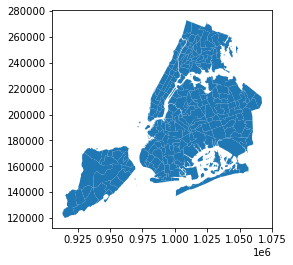

In [37]:
# plotting the geodataframe
nta_shape.plot()

<AxesSubplot:>

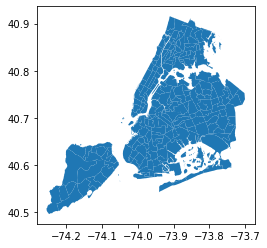

In [38]:
# changing the CRS and then plotting the geodataframe
nta_shape.to_crs(epsg=4326).plot()

## 4.3 Create Centroids from Polygons

In [39]:
# returning first five rows
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((1045896.171 205383.934, 104564..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((1052996.114 196307.361, 105308..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((997183.310 187255.551, 997207...."


<AxesSubplot:>

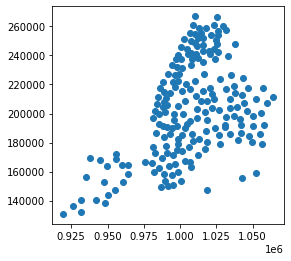

In [40]:
# returning the centroid of our shape and saving as a new column called 'centroid_column'
nta_shape['centroid_column'] = nta_shape.centroid

# setting our geometry as the new centroid column and then plotting 
nta_shape.set_geometry('centroid_column').plot()

## 4.4 Creating a GeoDataFrame from a DataFrame with Coordinates

In [41]:
# reading in our nta data as a geodataframe
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url) 

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ..."


In [45]:
# creating colums for the x and y coordinates of our geometries and deleting previous geometries
nta_shape['centroid_column'] = nta_shape.centroid
nta_shape = nta_shape.set_geometry('centroid_column')

nta_shape['x'], nta_shape['y'] = nta_shape.centroid_column.x, nta_shape.centroid_column.y
nta_shape_no_geometry = nta_shape[['ntaname', 'x', 'y']]

nta_shape_no_geometry.head()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


,ntaname,x,y
0,Murray Hill,-73.809546,40.768352
1,East Elmhurst,-73.868396,40.763352
2,Fresh Meadows-Utopia,-73.783716,40.734894
3,St. Albans,-73.763146,40.691202
4,Clinton Hill,-73.962363,40.687967


In [46]:
# prining the type of our dataframe
print(type(nta_shape_no_geometry))

<class 'pandas.core.frame.DataFrame'>


In [47]:
# Generate GeometryArray of point geometries from x, y coordinates
nta_shape_with_geometry = gpd.GeoDataFrame(nta_shape_no_geometry, 
                              geometry=gpd.points_from_xy(nta_shape_no_geometry.x, 
                              nta_shape_no_geometry.y))

# previewing our new point geometry column
nta_shape_with_geometry.head()

,ntaname,x,y,geometry
0,Murray Hill,-73.809546,40.768352,POINT (-73.80955 40.76835)
1,East Elmhurst,-73.868396,40.763352,POINT (-73.86840 40.76335)
2,Fresh Meadows-Utopia,-73.783716,40.734894,POINT (-73.78372 40.73489)
3,St. Albans,-73.763146,40.691202,POINT (-73.76315 40.69120)
4,Clinton Hill,-73.962363,40.687967,POINT (-73.96236 40.68797)


In [48]:
# returning the type of our new geodataframe
type(nta_shape_with_geometry)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot:>

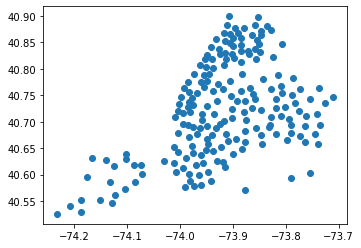

In [49]:
# plotting our data
nta_shape_with_geometry.plot()

## 4.5 Relationship Tests

In [50]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)
nta_shape['centroid_column'] = nta_shape.centroid

nta_shape.head()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,centroid_column
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...",POINT (-73.80955 40.76835)
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...",POINT (-73.86840 40.76335)
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ...",POINT (-73.78372 40.73489)
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ...",POINT (-73.76315 40.69120)
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ...",POINT (-73.96236 40.68797)


In [54]:
# checking if our shape contains its centroid
nta_shape['geometry'].contains(nta_shape['centroid_column']).value_counts()

True     186
False      9
dtype: int64

In [55]:
# checking to see if our centroid is within its shape
nta_shape['centroid_column'].within(nta_shape['geometry']).value_counts()

True     186
False      9
dtype: int64

In [56]:
# checking if our representative point is within its shape
nta_shape.representative_point().within(nta_shape['geometry']).value_counts()

True    195
dtype: int64

In [57]:
# checking to see if our centroid intersects with its shape
nta_shape['centroid_column'].intersects(nta_shape['geometry']).value_counts()

True     186
False      9
dtype: int64

In [58]:
# making a new column called 'within' that identifies if our centroid is within its shape
nta_shape['within'] = nta_shape.centroid_column.within(nta_shape['geometry'])

# printing the shape and head of centroids not within their shapes
print(nta_shape[nta_shape['within'] == False].shape)
nta_shape[nta_shape['within'] == False].head()

(9, 10)


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,centroid_column,within
58,SI37,46426790.7335,085,Stapleton-Rosebank,55229.6374031,Staten Island,5,"MULTIPOLYGON (((-74.07258 40.63794, -74.07257 ...",POINT (-74.07371 40.61873),False
96,SI22,56028570.7705,085,West New Brighton-New Brighton-St. George,66052.5937578,Staten Island,5,"MULTIPOLYGON (((-74.07258 40.63794, -74.07330 ...",POINT (-74.10231 40.63897),False
114,MN99,91499473.5163,061,park-cemetery-etc-Manhattan,155290.452804,Manhattan,1,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",POINT (-73.95480 40.78794),False
131,QN10,99604665.5407,081,Breezy Point-Belle Harbor-Rockaway Park-Broad ...,114641.36345,Queens,4,"MULTIPOLYGON (((-73.88347 40.56848, -73.88337 ...",POINT (-73.87647 40.57148),False
136,BX10,40226289.5119,005,Pelham Bay-Country Club-City Island,138682.031059,Bronx,2,"MULTIPOLYGON (((-73.78833 40.83467, -73.78931 ...",POINT (-73.80649 40.84660),False


In [59]:
# returning the count of unique values of centroids not within their shapes
nta_shape[nta_shape['within'] == False]['ntaname'].value_counts()

park-cemetery-etc-Queens                                 1
Breezy Point-Belle Harbor-Rockaway Park-Broad Channel    1
Eastchester-Edenwald-Baychester                          1
Stapleton-Rosebank                                       1
park-cemetery-etc-Brooklyn                               1
Pelham Bay-Country Club-City Island                      1
West New Brighton-New Brighton-St. George                1
park-cemetery-etc-Bronx                                  1
park-cemetery-etc-Manhattan                              1
Name: ntaname, dtype: int64

In [60]:
# saving centroids that are not within their shapes as a new dataframe called 'multi_shapes'
multi_shapes = nta_shape[nta_shape['within'] == False]

multi_shapes[['ntaname', 'geometry']]

,ntaname,geometry
58,Stapleton-Rosebank,"MULTIPOLYGON (((-74.07258 40.63794, -74.07257 ..."
96,West New Brighton-New Brighton-St. George,"MULTIPOLYGON (((-74.07258 40.63794, -74.07330 ..."
114,park-cemetery-etc-Manhattan,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
131,Breezy Point-Belle Harbor-Rockaway Park-Broad ...,"MULTIPOLYGON (((-73.88347 40.56848, -73.88337 ..."
136,Pelham Bay-Country Club-City Island,"MULTIPOLYGON (((-73.78833 40.83467, -73.78931 ..."
166,Eastchester-Edenwald-Baychester,"MULTIPOLYGON (((-73.79323 40.88282, -73.79417 ..."
177,park-cemetery-etc-Brooklyn,"MULTIPOLYGON (((-73.91513 40.58627, -73.91510 ..."
182,park-cemetery-etc-Queens,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
186,park-cemetery-etc-Bronx,"MULTIPOLYGON (((-73.86956 40.81616, -73.86954 ..."


In [61]:
multi_shapes = multi_shapes.to_crs(2263)

# Returns the union of the shape and their centroids to plot together.
multi_shapes.centroid.union(multi_shapes['geometry'])

58     GEOMETRYCOLLECTION (POINT (963788.240 164704.4...
96     GEOMETRYCOLLECTION (POINT (955854.848 172087.7...
114    GEOMETRYCOLLECTION (POINT (996755.597 226337.7...
131    GEOMETRYCOLLECTION (POINT (1018561.650 147509....
136    GEOMETRYCOLLECTION (POINT (1037787.363 247775....
166    GEOMETRYCOLLECTION (POINT (1029423.170 260269....
177    GEOMETRYCOLLECTION (POINT (1006579.170 166293....
182    GEOMETRYCOLLECTION (POINT (1030625.041 190803....
186    GEOMETRYCOLLECTION (POINT (1026289.378 257175....
dtype: geometry

# Identifying centroids not located within their shape

In [62]:
# saving the shape, centroid union as a new name called 'multi_shapes'
multi_shapes = multi_shapes.centroid.union(multi_shapes['geometry'])

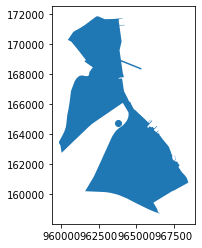

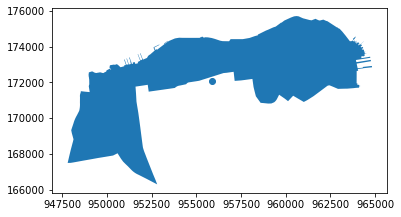

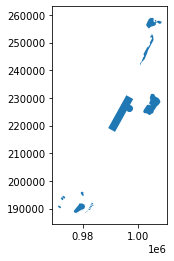

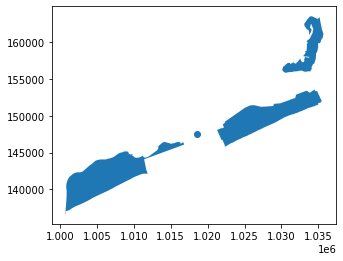

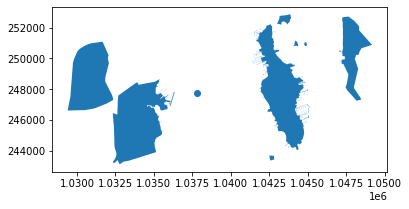

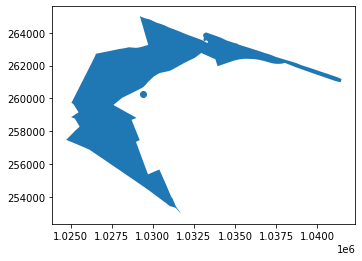

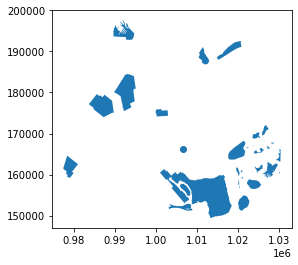

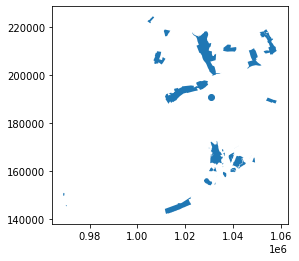

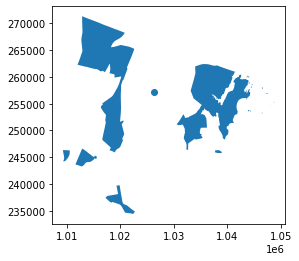

In [63]:
# plotting the shapes and their centroids that do not fall within their shape

for i in range(len(multi_shapes)):
    multi_shapes.iloc[[i]].plot()

# 5. Making Maps

GeoPandas has three basic classes of geometric objects (which are actually shapely objects):

- Points / Multi-Points

- Lines / Multi-Lines

- Polygons / Multi-Polygons

## 5.1 Points

In [64]:
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'
school_points = gpd.read_file(zipfile)

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.0,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.0,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.0,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.0,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.0,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


<AxesSubplot:>

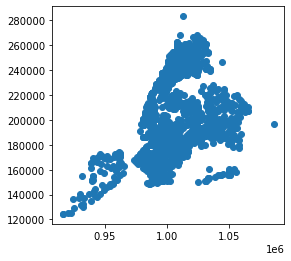

In [65]:
school_points.plot()

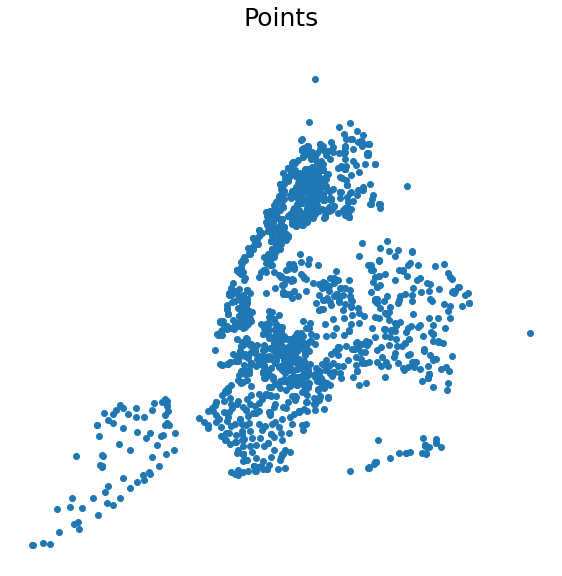

In [66]:
fig, ax = plt.subplots(figsize=(8,8)) # creating a figure

# converting to more accurate coordinate referance system
school_points = school_points.to_crs(epsg=2263)

# plotting school points 
school_points.plot(ax=ax, 
                   color='#1f77b4')

plt.axis('off') # turning off the plot axis
ax.set_title('Points', pad=30, fontsize=25) # setting title as 'Points'
ax.set_aspect('equal', 'box') # setting the plot aspect to 'equal' and 'box'

fig.tight_layout() # returing a tight layout of the plot
plt.savefig('figures/5-1-a.png', facecolor='w') # saving the figure as '5-1-a.png'

## 5.2 Lines

In [67]:
url = 'https://data.cityofnewyork.us/api/geospatial/exjm-f27b?method=export&format=GeoJSON'
streets = gpd.read_file(url)

streets.head()

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,snow_pri,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry
0,1,50,None,42.0,10280,51,None,PL,1222601917,None,...,C,1,TW,None,BATTERY PL,3,BATTERY,2007-11-29T00:00:00,64,"MULTILINESTRING ((-74.01793 40.70617, -74.0178..."
1,1,66,None,42.0,10280,65,None,PL,1222604562,None,...,C,1,TW,None,BATTERY PL,5,BATTERY,2007-11-29T00:00:00,82,"MULTILINESTRING ((-74.01757 40.70684, -74.0171..."
2,1,84,None,42.0,10280,83,None,PL,1222600933,None,...,C,1,TW,None,BATTERY PL,6,BATTERY,2007-11-29T00:00:00,98,"MULTILINESTRING ((-74.01712 40.70746, -74.0166..."
3,1,None,None,42.0,10280,None,None,PL,1222600931,None,...,C,1,TW,None,BATTERY PL,8,BATTERY,2007-11-29T00:00:00,None,"MULTILINESTRING ((-74.01694 40.70481, -74.0170..."
4,1,None,None,24.0,10004,None,None,PL,212262395,None,...,C,1,TF,None,BATTERY PL,14,BATTERY,2011-04-22T00:00:00,None,"MULTILINESTRING ((-74.01429 40.70455, -74.0143..."


<AxesSubplot:>

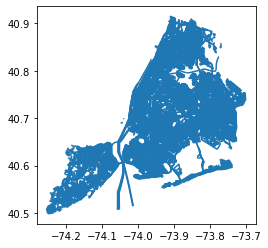

In [68]:
streets.plot()

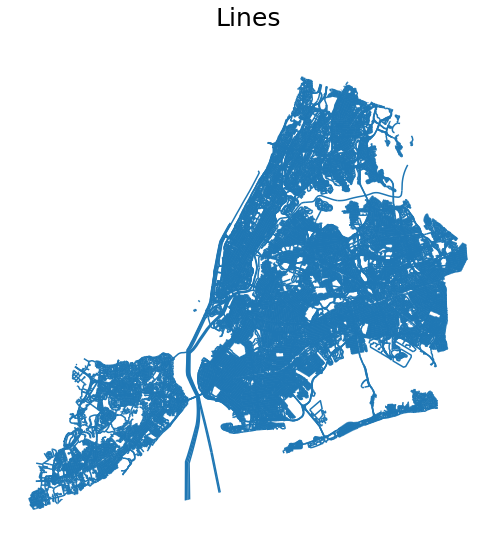

In [69]:
fig, ax = plt.subplots(figsize=(8,8))

streets = streets.to_crs(epsg=2263) 
streets.plot(ax=ax, 
             color='#1f77b4')

ax.set_title('Lines', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')

fig.tight_layout()
plt.axis('off')
plt.savefig('figures/5-2-a.png', facecolor='w')

## 5.3 Polygons

In [70]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ..."


<AxesSubplot:>

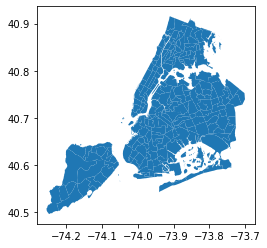

In [71]:
nta_shape.plot()

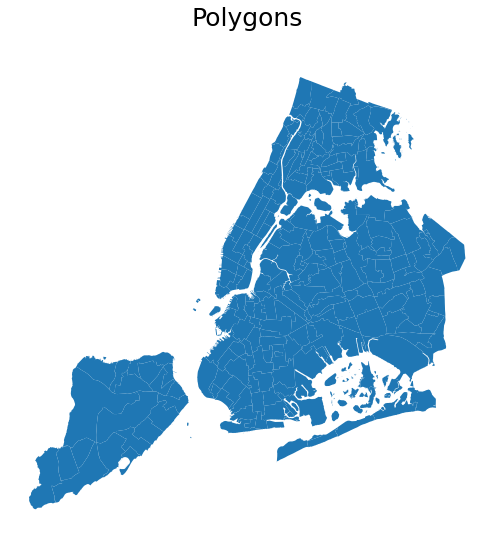

In [72]:
fig, ax = plt.subplots(figsize=(8,8))

nta_shape = nta_shape.to_crs(epsg=2263)
nta_shape.plot(ax=ax, 
               color='#1f77b4') 

ax.set_title('Polygons', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')

fig.tight_layout()
plt.axis('off')
plt.savefig('figures/5-3-a.png', facecolor='w')

## 5.4 Maps with Layers

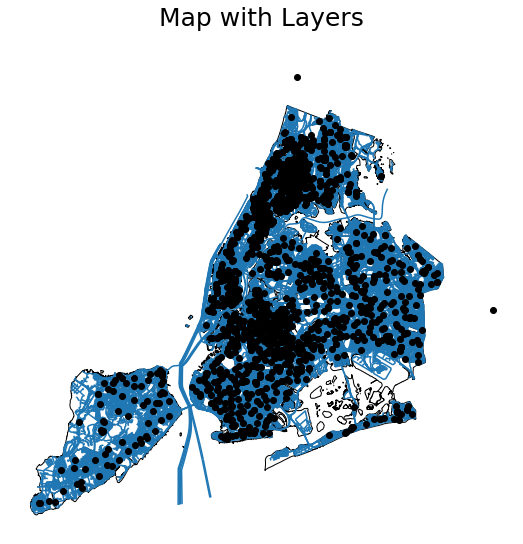

In [73]:
fig, ax = plt.subplots(figsize=(8,8))

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=1) # the order they should be plotted

streets.plot(ax=ax, 
             zorder=2)

school_points.plot(ax=ax, 
                   color='black', 
                   zorder=3)

ax.set_title('Map with Layers', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')

fig.tight_layout()
plt.axis('off')
plt.savefig('figures/5-4-a.png', facecolor='w')

## 5.5 Adding Background Map

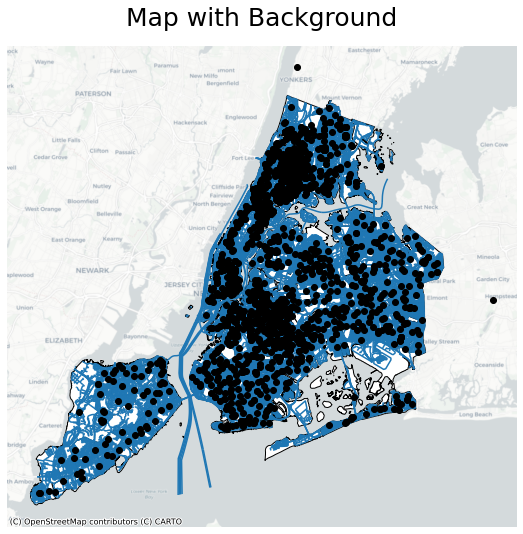

In [74]:
fig, ax = plt.subplots(figsize=(8,8))

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=1)

streets.plot(ax=ax, 
             zorder=2)

school_points.plot(ax=ax, 
                   color='black', 
                   zorder=3)
# adding basemap
ctx.add_basemap(ax, 
                crs=2263, 
                source=ctx.providers.CartoDB.Positron)


ax.set_title('Map with Background', pad=20, fontsize=25)
ax.set_aspect('equal', 'box')

fig.tight_layout()
plt.axis('off')
plt.savefig('figures/5-5-a.png', facecolor='w')

## 5.6 Clip Data

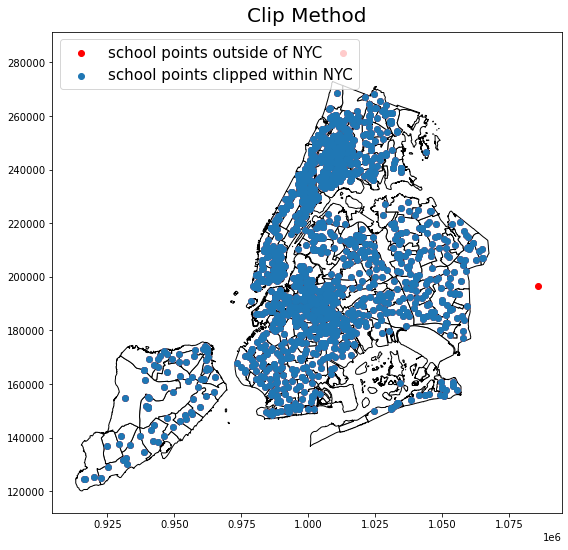

In [75]:
# clipping the school points that only fall within the nta shapes
school_points_clipped = gpd.clip(school_points, nta_shape)

fig, ax = plt.subplots(figsize=(8,8))

nta_shape.plot(ax=ax, 
               color="white", 
               edgecolor='black', 
               zorder=0)    

# plotting all points
school_points.plot(ax=ax, 
                   color='red', 
                   zorder=1,
                   label='school points outside of NYC')

# plotting only the clipped points
school_points_clipped.plot(ax=ax, 
                           color='#1f77b4', 
                           zorder=2, 
                           label='school points clipped within NYC')

ax.set_title('Clip Method', pad=10, fontsize=20)
ax.set_aspect('equal', 'box')

plt.legend(loc='upper left', fontsize=15)
fig.tight_layout()
plt.savefig('figures/5-6-a.png', facecolor='w')

# 6. Types of Maps

In [76]:
# reading in nyc nta population data as 'nyc_pop'
url = 'https://data.cityofnewyork.us/api/views/swpk-hqdp/rows.csv?accessType=DOWNLOAD'
nyc_pop = pd.read_csv(url)

nyc_pop.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,Bronx,2000,5,BX01,Claremont-Bathgate,28149
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
2,Bronx,2000,5,BX05,Bedford Park-Fordham North,55329
3,Bronx,2000,5,BX06,Belmont,25967
4,Bronx,2000,5,BX07,Bronxdale,34309


In [77]:
nyc_pop['Year'].unique()

array([2000, 2010])

In [78]:
# saving only the population numbers for the year 2010
nyc_pop = nyc_pop.loc[nyc_pop['Year'] == 2010]

nyc_pop['Year'].unique()

array([2010])

In [79]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ..."
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ..."
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ..."


In [80]:
# joining our nta population data to our nta shapes data
nta_pop = nta_shape.merge(nyc_pop, 
                          left_on='ntacode', 
                          right_on='NTA Code', 
                          how='inner')

nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...",Queens,2010,81,QN51,Murray Hill,51739
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...",Queens,2010,81,QN27,East Elmhurst,23150
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((-73.77758 40.73019, -73.77849 ...",Queens,2010,81,QN41,Fresh Meadows-Utopia,17812
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((-73.75205 40.70523, -73.75174 ...",Queens,2010,81,QN08,St. Albans,48593
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((-73.95337 40.68064, -73.95328 ...",Brooklyn,2010,47,BK69,Clinton Hill,34791


In [81]:
nta_pop.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [82]:
nta_pop = nta_pop.to_crs(epsg=2263)

nta_pop.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [83]:
# returning the area of our nta as a new column 'sq_ft'
nta_pop['sq_ft'] = nta_pop.area

nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,5.248828e+07
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,1.972695e+07
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((1045896.171 205383.934, 104564...",Queens,2010,81,QN41,Fresh Meadows-Utopia,17812,2.777485e+07
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((1052996.114 196307.361, 105308...",Queens,2010,81,QN08,St. Albans,48593,7.741276e+07
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((997183.310 187255.551, 997207....",Brooklyn,2010,47,BK69,Clinton Hill,34791,2.052822e+07


In [84]:
# converting square feet to square miles and saving as a new column
nta_pop['sq_mi'] = nta_pop['sq_ft'] / 27878400

nta_pop.head()   

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft,sq_mi
0,QN51,52488277.4492,081,Murray Hill,33266.9048559,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,5.248828e+07,1.882758
1,QN27,19726845.734,081,East Elmhurst,19816.7117581,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,1.972695e+07,0.707607
2,QN41,27774853.5522,081,Fresh Meadows-Utopia,22106.4312724,Queens,4,"MULTIPOLYGON (((1045896.171 205383.934, 104564...",Queens,2010,81,QN41,Fresh Meadows-Utopia,17812,2.777485e+07,0.996286
3,QN08,77412747.8943,081,St. Albans,45401.3167856,Queens,4,"MULTIPOLYGON (((1052996.114 196307.361, 105308...",Queens,2010,81,QN08,St. Albans,48593,7.741276e+07,2.776801
4,BK69,20528197.0269,047,Clinton Hill,23971.4662361,Brooklyn,3,"MULTIPOLYGON (((997183.310 187255.551, 997207....",Brooklyn,2010,47,BK69,Clinton Hill,34791,2.052822e+07,0.736349


In [85]:
# creating a new column of the population density (pop/area) of each nta
nta_pop['density (pop/sq_mi)'] = nta_pop['Population'] / nta_pop['sq_mi']

nta_pop.sort_values(by='density (pop/sq_mi)', ascending=False).iloc[:5,-6:]

,NTA Code,NTA Name,Population,sq_ft,sq_mi,density (pop/sq_mi)
54,MN32,Yorkville,77942,1.364822e+07,0.489563,159207.418507
51,BX40,Fordham South,28262,6.308875e+06,0.226300,124887.451016
108,MN22,East Village,44136,1.089424e+07,0.390777,112944.158097
88,MN14,Lincoln Square,61489,1.580548e+07,0.566944,108457.006896
12,MN12,Upper West Side,132378,3.437994e+07,1.233211,107344.183524


## 6.1 Choropleth Maps

<AxesSubplot:>

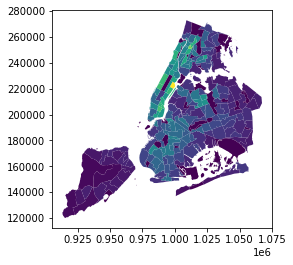

In [86]:
# plotting a choropleth map on the column 'density (pop/sq_mi)'
nta_pop.plot(column='density (pop/sq_mi)')

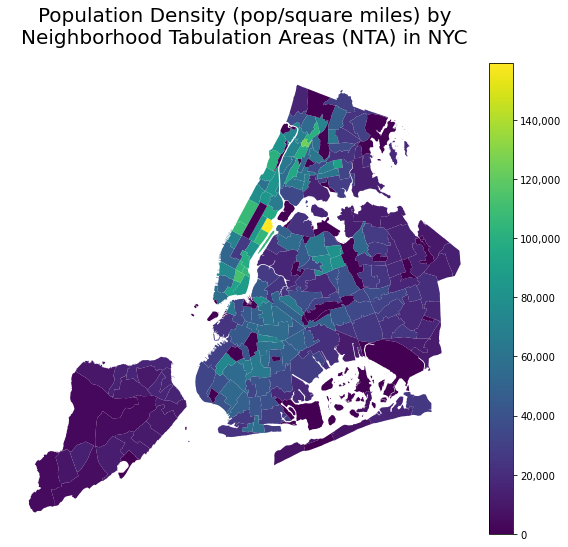

In [87]:
fig, ax = plt.subplots(figsize=(8,8)) # creating figure

# saving variable to format integers as strings with commas
comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

# resizing the color bar to scale to the plot
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# plotting 'density (pop/sq_mi)' as a choropleth map
nta_pop.plot(column='density (pop/sq_mi)', 
             ax=ax, # plotting on the generated axis
             cax=cax, # legend of the color bar
             legend=True, # turning on legend
             legend_kwds={'format':comma_fmt}) # formatting the color map legend with thousand separator

# setting title
ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)

# setting plot aspect
ax.set_aspect('equal', 'box')
# turning off axis
ax.axis('off')
# setting a tight layout
fig.tight_layout()

# saving figure as '6-1-a.png'
plt.savefig('figures/6-1-a.png', facecolor='w')

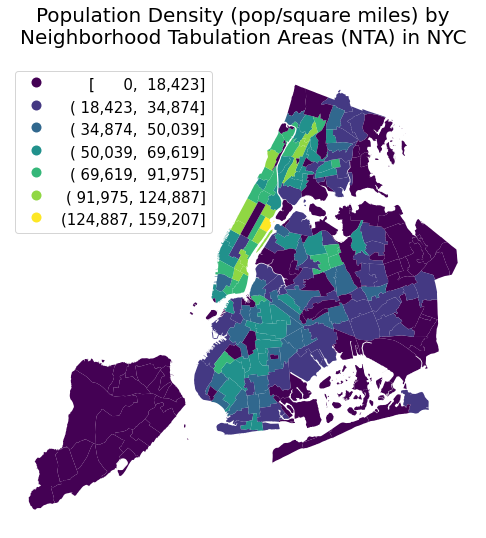

In [88]:
fig, ax = plt.subplots(figsize=(8,8))

nta_pop.plot(column='density (pop/sq_mi)', 
             ax=ax, 
             legend=True, 
             scheme='fisher_jenks',
             k=7,
             legend_kwds={'loc': "upper left", 
                          'fmt': "{:,.0f}",
                          'fontsize': "15"})

# returning the legend
leg = ax.get_legend()

# making the legend labels right horizontal aligned
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(185)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"     
        
ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.axis('off')
plt.savefig('figures/6-1-b.png', facecolor='w')

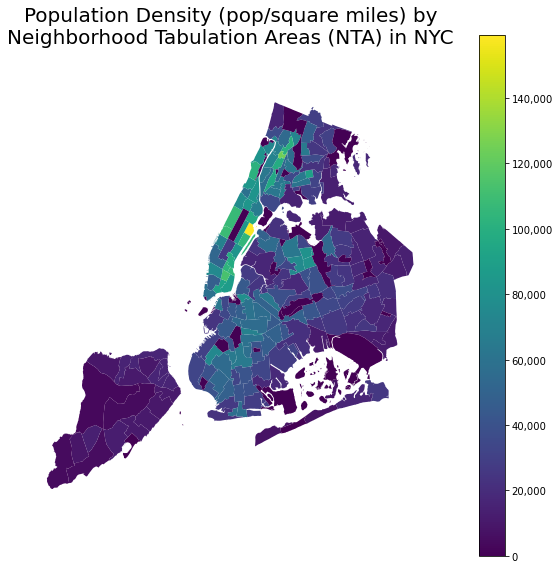

In [90]:
comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='None', 
                     linewidth=1,
                     cmap='viridis',
                     legend=True,
                     legend_kwargs={'format': comma_fmt},
                     figsize=(8,8),
                     zorder=0)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=1,
              edgecolor='None')

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-1-c.png', facecolor='w')

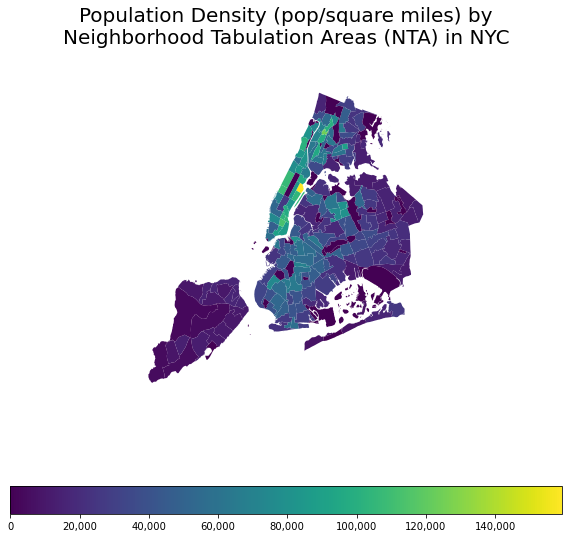

In [91]:
comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='None', 
                     linewidth=1,
                     cmap='viridis',
                     legend=True,
                     legend_kwargs={'format': comma_fmt,
                                    'orientation': 'horizontal'},
                     figsize=(8,8),
                     zorder=0)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=1,
              edgecolor='None')

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-1-d.png', facecolor='w')

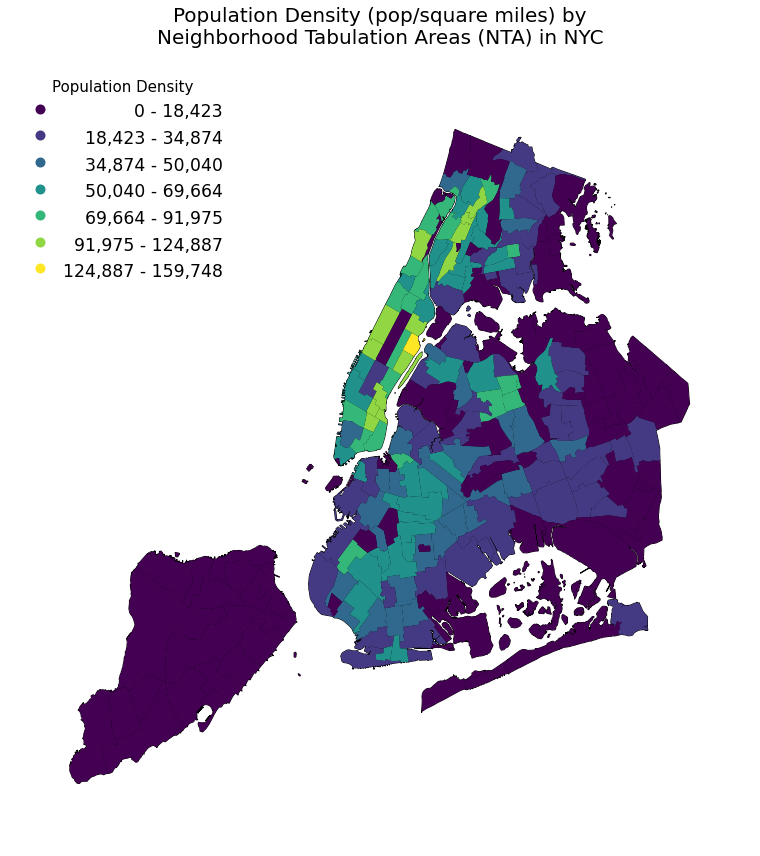

In [465]:
# setting the map classifier as Fisher Jenks with 7 classes
scheme = mc.FisherJenks(nta_pop['density (pop/sq_mi)'], k=7)

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     cmap='viridis',
                     legend=True, 
                     legend_kwargs={'frameon': False, 
                                    'loc': 'upper left', 
                                    'fontsize':'xx-large', 
                                    'title':'Population Density',
                                    'title_fontsize':'15'},
                     scheme=scheme, 
                     figsize=(12,12),
                     zorder=1)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0)

leg = ax.get_legend()

# formatting the legend label numbers with thousand separators
for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    upper = label_text.split()[2]
    new_text = f'{float(lower):,.0f} - {float(upper):,.0f}'
    lbl.set_text(new_text)
    
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"    

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-1-e.png', facecolor='w')

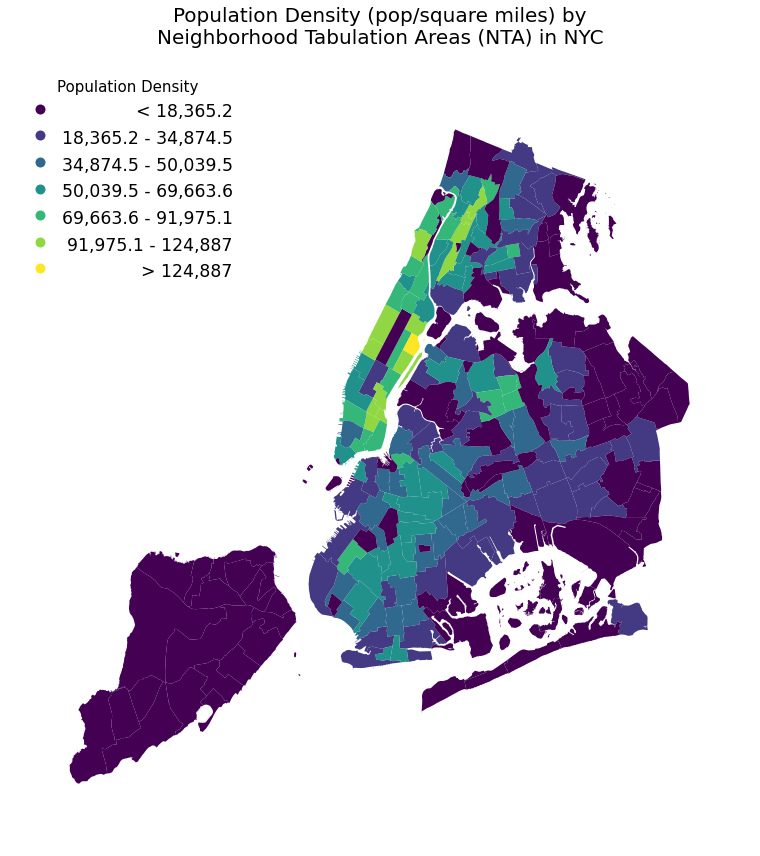

In [466]:
scheme = mc.FisherJenks(nta_pop['density (pop/sq_mi)'], k=7)

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     cmap='viridis',
                     legend=True, 
                     legend_kwargs={'frameon': False, 
                                    'loc': 'upper left', 
                                    'fontsize':'xx-large', 
                                    'title':'Population Density',
                                    'title_fontsize':'15'},
                     scheme=scheme, 
                     figsize=(12,12),
                     
                     # manually setting legend labels
                     legend_labels=[
                                    '< 18,365.2', 
                                    '18,365.2 - 34,874.5', 
                                    '34,874.5 - 50,039.5',
                                    '50,039.5 - 69,663.6', 
                                    '69,663.6 - 91,975.1',
                                    '91,975.1 - 124,887',
                                    '> 124,887',
                                    ])

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0,
              edgecolor='None')

leg = ax.get_legend()
    
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(210)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-1-f.png', facecolor='w')

## 6.2 Heat Maps

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:1678: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


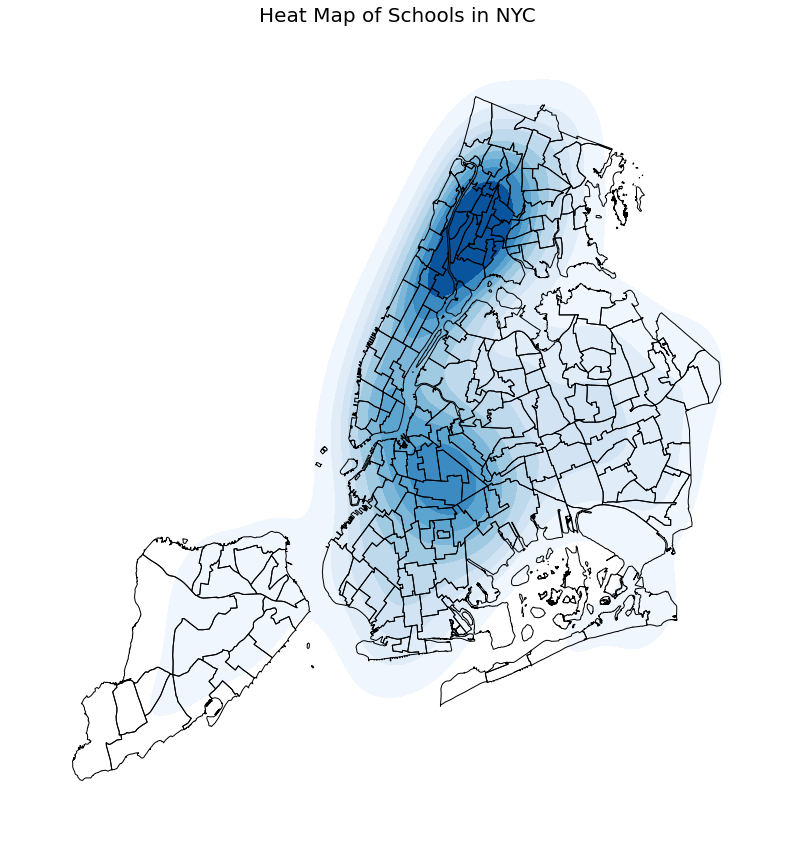

In [467]:
ax = gplt.kdeplot(school_points.to_crs(4326),
                  shade=True, 
                  cmap='Blues',
                  projection=gplt.crs.AlbersEqualArea(), 
                  figsize=(12,12))

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=1)

ax.set_title('Heat Map of Schools in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-2-a.png', facecolor='w')

## 6.3 Hexbin Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/Users/geribauer/anaconda3/li

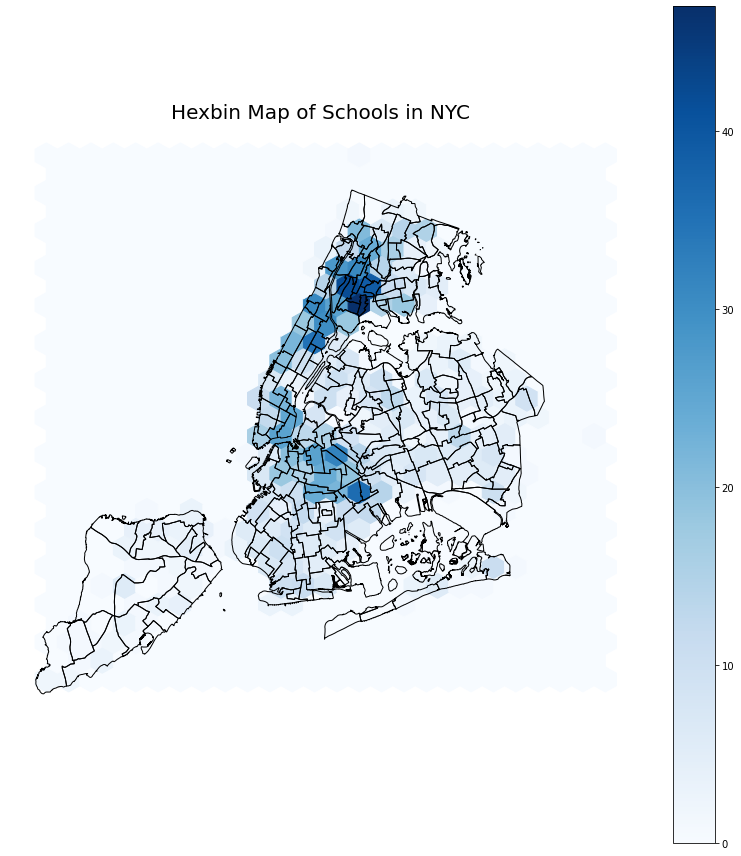

In [468]:
fig, ax = plt.subplots(figsize=(12,12))

school_points['x'] = school_points['geometry'].x
school_points['y'] = school_points['geometry'].y
df = pd.DataFrame(school_points)

df.plot.hexbin(x='x', 
               y='y', 
               gridsize=25, 
               ax=ax,
               cmap='Blues')

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black')

ax.set_title('Hexbin Map of Schools in NYC', fontsize=20, pad=10)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.axis('off')
plt.savefig('figures/6-3-a.png', facecolor='w')

## 6.4 Proportional Symbol Map

In [469]:
nta_pop['centroid'] = nta_pop.centroid
nta_pop = nta_pop.set_geometry('centroid')

nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft,sq_mi,density (pop/sq_mi),centroid
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",Brooklyn,2010,47,BK88,Borough Park,106357,54005019.048,1.937,54903.471,POINT (987397.463 169148.408)
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,52488277.591,1.883,27480.432,POINT (1037005.224 219265.318)
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,19726946.569,0.708,32715.908,POINT (1020706.745 217413.871)
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",Brooklyn,2010,47,BK95,Erasmus,29938,14522603.592,0.521,57470.655,POINT (997674.726 174677.650)
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",Queens,2010,81,QN07,Hollis,20269,22887772.809,0.821,24688.610,POINT (1050471.492 198271.804)


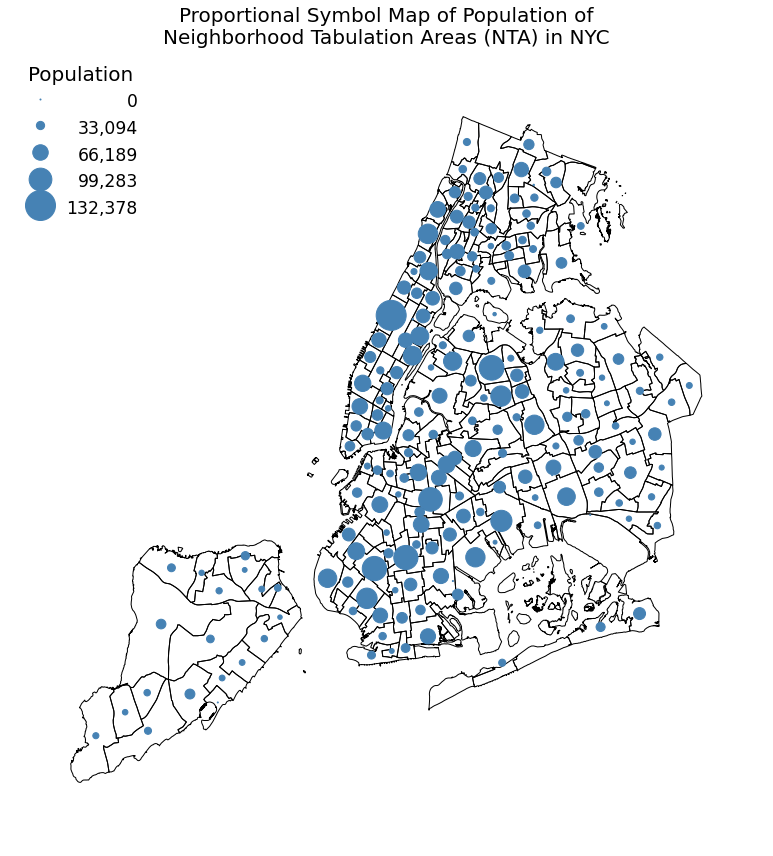

In [470]:
ax = gplt.pointplot(nta_pop.set_geometry('centroid').to_crs(4326), 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12),
                    scale='Population', 
                    limits=(1, 30), 
                    legend=True,
                    legend_kwargs={'frameon': False, 
                                   'loc': 'upper left', 
                                   'fontsize':'xx-large', 
                                   'title':'Population',
                                   'title_fontsize':'20'})

gplt.polyplot(nta_shape.to_crs(4326), 
              projection=gcrs.AlbersEqualArea(),
              ax=ax)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    new_text = f'{int(lower):,.0f}'
    lbl.set_text(new_text)

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115) 
        row.mode= "expand"
        row.align="right"

ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-4-a.png', facecolor='w')

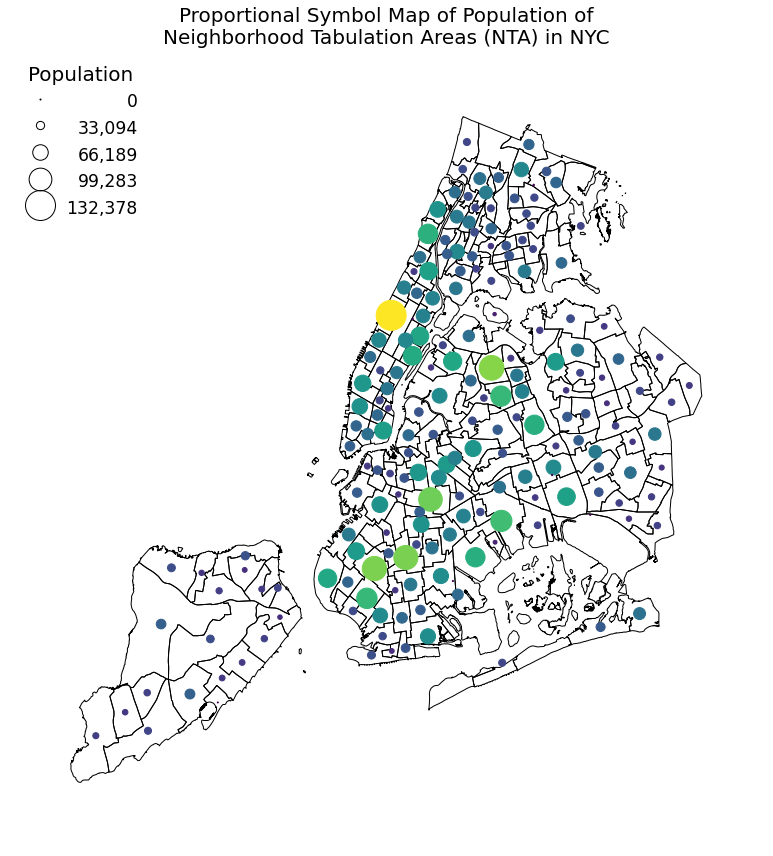

In [471]:
ax = gplt.pointplot(nta_pop.set_geometry('centroid').to_crs(4326), 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12),
                    hue='Population', 
                    scale='Population',
                    legend_var='scale',
                    limits=(1, 30),
                    legend=True,
                    legend_kwargs={'frameon': False, 
                                   'loc': 'upper left', 
                                   'fontsize':'xx-large', 
                                   'title':'Population',
                                   'title_fontsize':'20'})

gplt.polyplot(nta_shape.to_crs(4326), 
              projection=gcrs.AlbersEqualArea(),
              ax=ax)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    new_text = f'{int(lower):,.0f}'
    lbl.set_text(new_text) 

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115) 
        row.mode= "expand"
        row.align="right"
        
ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-4-b.png', facecolor='w')

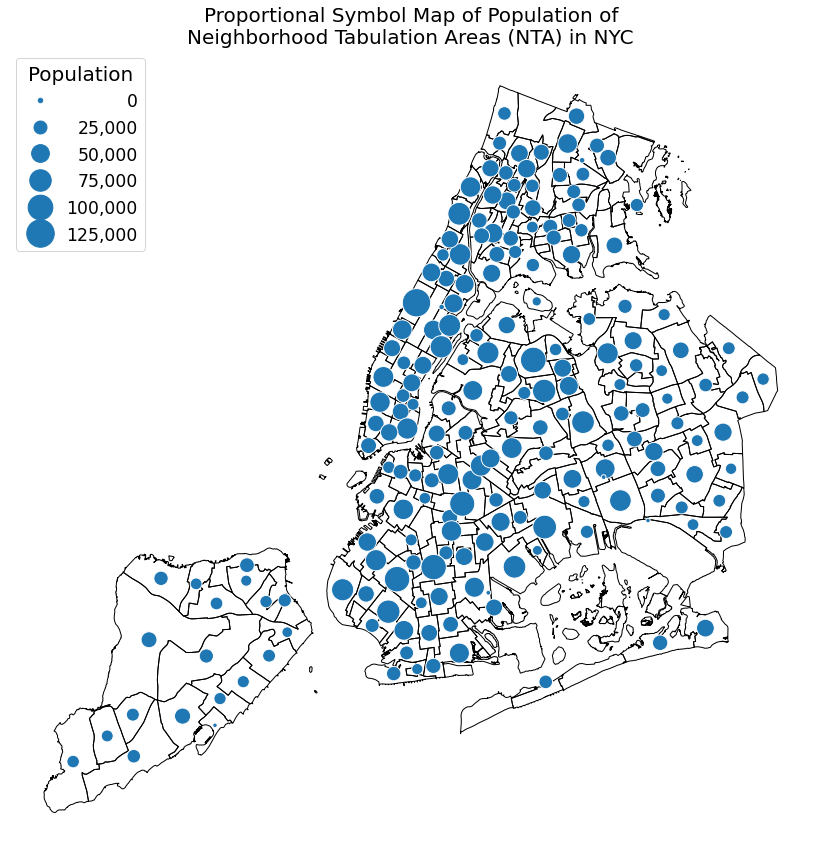

In [472]:
fig, ax = plt.subplots(figsize=(12,12))

ax = sns.scatterplot(x=nta_pop['centroid'].x,
                     y=nta_pop['centroid'].y, 
                     data=nta_pop, 
                     size="Population",
                     sizes=(20, 800))

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

current_handles, current_labels = plt.gca().get_legend_handles_labels()
       
for i in range(len(current_labels)):
    current_labels[i] = int(current_labels[i])
    current_labels[i] = "{:,}".format((current_labels[i])) 
    
    
leg = ax.legend(current_handles, current_labels, 
                loc='upper left', 
                fontsize='xx-large', 
                title='Population',
                title_fontsize=20)

for i in range(len(current_handles)):
    leg.legendHandles[i].set_color('#1f77b4')

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115)
        row.mode= "expand"
        row.align="right"
        
ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-4-c.png', facecolor='w')

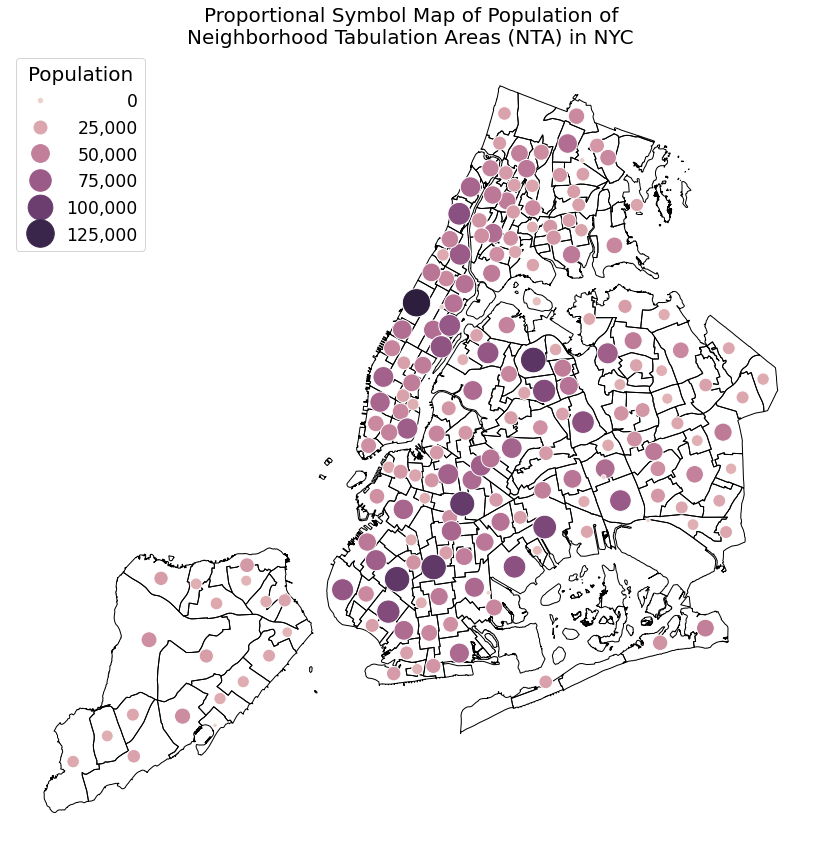

In [473]:
fig, ax = plt.subplots(figsize=(12,12))

ax = sns.scatterplot(x=nta_pop['centroid'].x,
                     y=nta_pop['centroid'].y, 
                     data=nta_pop, 
                     size="Population",
                     hue='Population',
                     sizes=(20, 800))

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

current_handles, current_labels = plt.gca().get_legend_handles_labels()
       
for i in range(len(current_labels)):
    current_labels[i] = int(current_labels[i])
    current_labels[i] = "{:,}".format((current_labels[i])) 
    
    
leg = ax.legend(current_handles, current_labels, 
                loc='upper left', 
                fontsize='xx-large', 
                title='Population',  
                title_fontsize=20)

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115)
        row.mode= "expand"
        row.align="right"

ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-4-d.png', facecolor='w')

## 6.5 Graduated Symbol Map

In [474]:
# printing scheme of map classifier - Fisher Jenks with 7 classes
scheme = mc.FisherJenks(nta_pop['Population'], k=7)

print(scheme)

FisherJenks                   

       Interval          Count
------------------------------
[     0.00,  13354.00] |     8
( 13354.00,  31078.00] |    70
( 31078.00,  44316.00] |    45
( 44316.00,  58300.00] |    34
( 58300.00,  72957.00] |    21
( 72957.00,  91958.00] |    12
( 91958.00, 132378.00] |     5


In [475]:
# manually creating a new collumn called 'size' capturing the sizes 
# of the classes from the Fisher Jenks map classifer.
nta_pop.loc[(nta_pop['Population'] <= 13354), 'size'] = 50
nta_pop.loc[(nta_pop['Population'].between(13355, 31078)), 'size'] = 100
nta_pop.loc[(nta_pop['Population'].between(31079, 44316)), 'size'] = 200
nta_pop.loc[(nta_pop['Population'].between(44317, 58300)), 'size'] = 300
nta_pop.loc[(nta_pop['Population'].between(58301, 72957)), 'size'] = 400
nta_pop.loc[(nta_pop['Population'].between(72958, 91958)), 'size'] = 500
nta_pop.loc[(nta_pop['Population'] >= 91959), 'size'] = 600

nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft,sq_mi,density (pop/sq_mi),centroid,size
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",Brooklyn,2010,47,BK88,Borough Park,106357,54005019.048,1.937,54903.471,POINT (987397.463 169148.408),600.000
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,52488277.591,1.883,27480.432,POINT (1037005.224 219265.318),300.000
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,19726946.569,0.708,32715.908,POINT (1020706.745 217413.871),100.000
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",Brooklyn,2010,47,BK95,Erasmus,29938,14522603.592,0.521,57470.655,POINT (997674.726 174677.650),100.000
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",Queens,2010,81,QN07,Hollis,20269,22887772.809,0.821,24688.610,POINT (1050471.492 198271.804),100.000


In [476]:
# descriptive statistics of our new column
nta_pop['size'].describe()

count   195.000
mean    225.641
std     140.173
min      50.000
25%     100.000
50%     200.000
75%     300.000
max     600.000
Name: size, dtype: float64

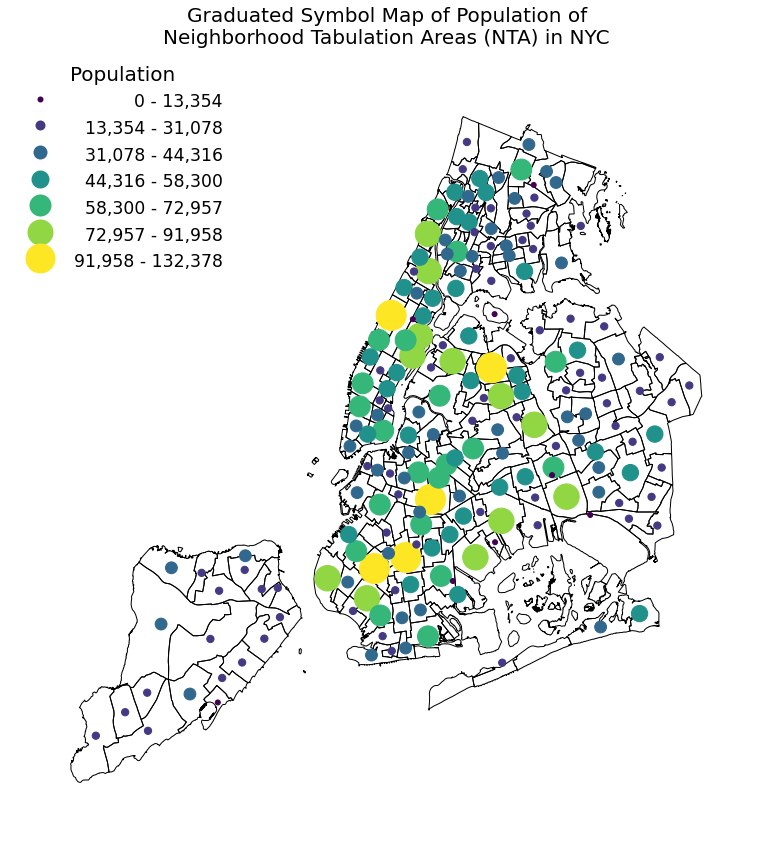

In [477]:
scheme = mc.FisherJenks(nta_pop['Population'], k=7)

ax = gplt.pointplot(nta_pop.set_geometry('centroid').to_crs(4326), 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12),
                    limits=(5, 30),
                    hue='Population',
                    scale='size',
                    scheme=scheme,    
                    legend=True,
                    legend_var='hue',
                    legend_kwargs={'frameon': False, 
                                  'loc': 'upper left', 
                                  'fontsize':'xx-large', 
                                  'title':'Population',
                                  'title_fontsize':'20'})

gplt.polyplot(nta_shape.to_crs(4326), 
              projection=gcrs.AlbersEqualArea(),
              ax=ax,
              zorder=0)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    upper = label_text.split()[2]
    new_text = f'{float(lower):,.0f} - {float(upper):,.0f}'
    lbl.set_text(new_text)
    
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200) 
        row.mode= "expand"
        row.align="right" 
            
# changing the marker size manually to roughly reflect the point size on the map
leg.legendHandles[0]._legmarker.set_markersize(6)
leg.legendHandles[1]._legmarker.set_markersize(10) 
leg.legendHandles[2]._legmarker.set_markersize(14)
leg.legendHandles[3]._legmarker.set_markersize(18) 
leg.legendHandles[4]._legmarker.set_markersize(22)
leg.legendHandles[5]._legmarker.set_markersize(26) 
leg.legendHandles[6]._legmarker.set_markersize(30)

ax.set_title('Graduated Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-5-a.png', facecolor='w')

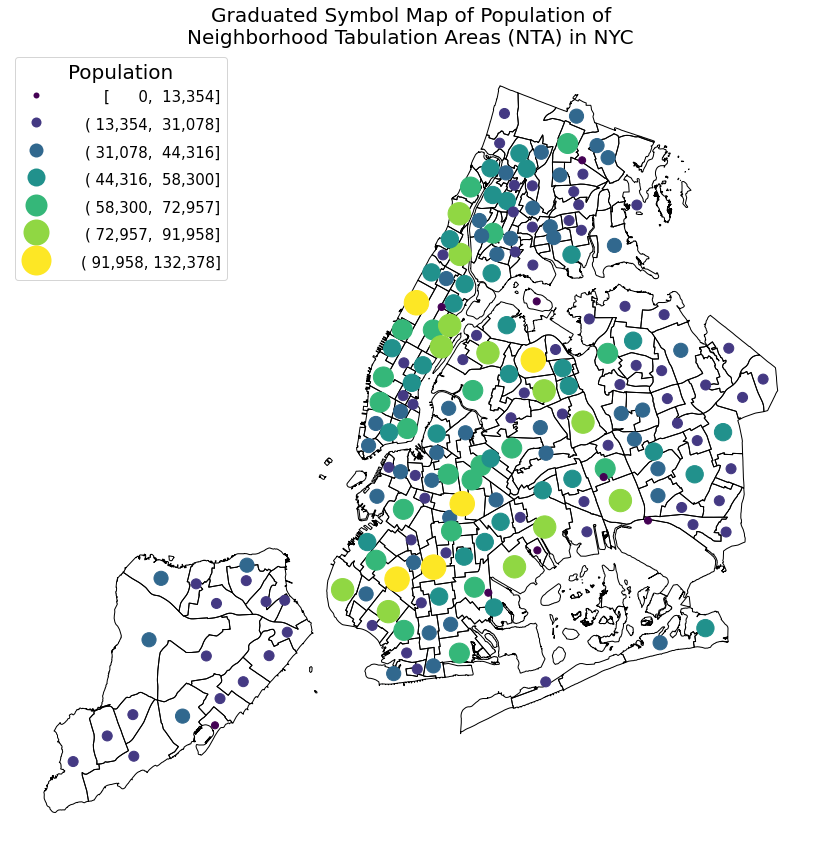

In [478]:
ax = nta_pop.set_geometry('centroid').plot(column='Population',  
                                           legend=True, 
                                           figsize=(12,12),
                                           
                                           # setting the marker size from the 'size' column
                                           markersize=nta_pop['size'],
                                           scheme='fisher_jenks',
                                           k=7,
                                           legend_kwds={'loc': "upper left", 
                                                        'fmt': "{:,.0f}",
                                                        'fontsize': "15",
                                                        'title':'Population',
                                                        'title_fontsize':'20'})

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black', 
                                 zorder=0)

leg = ax.get_legend()

# setting the legend marker size manually
leg.legendHandles[0]._legmarker.set_markersize(6)
leg.legendHandles[1]._legmarker.set_markersize(10) 
leg.legendHandles[2]._legmarker.set_markersize(14)
leg.legendHandles[3]._legmarker.set_markersize(18) 
leg.legendHandles[4]._legmarker.set_markersize(22)
leg.legendHandles[5]._legmarker.set_markersize(26) 
leg.legendHandles[6]._legmarker.set_markersize(30)

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)
        row.set_height(20)
        row.mode= "expand"
        row.align="right" 

ax.set_title('Graduated Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-5-b.png', facecolor='w')

## 6.6 One-to-One Dot Density Map

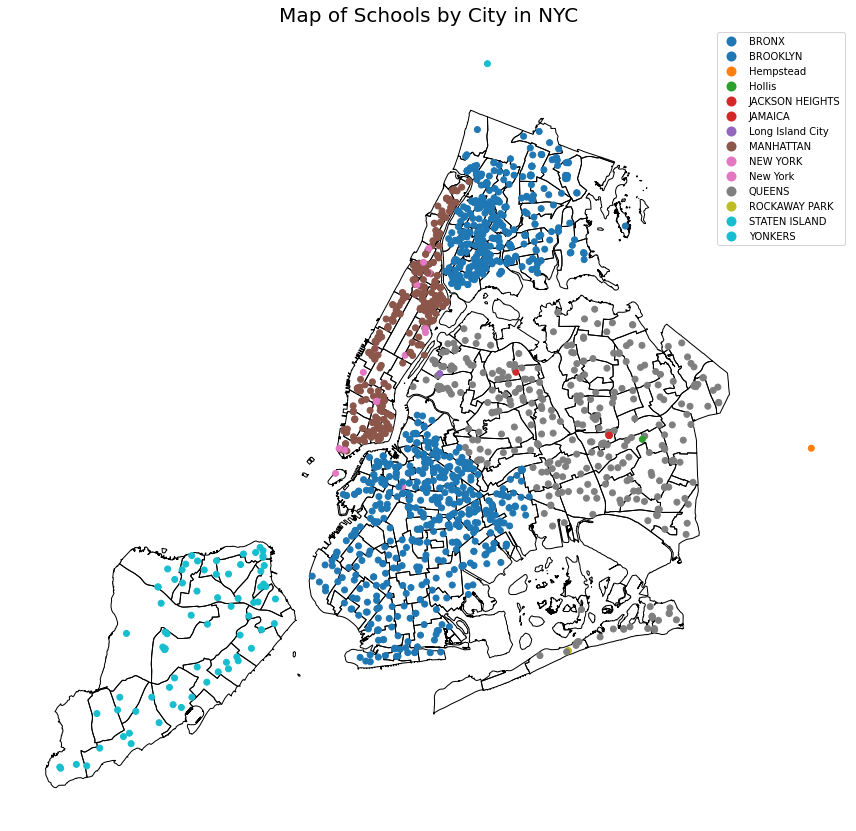

In [479]:
fig, ax = plt.subplots(figsize=(12,12))

school_points.plot(ax=ax, 
                   column='City',
                   legend=True)

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

ax.set_title('Map of Schools by City in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-6-a.png', facecolor='w')

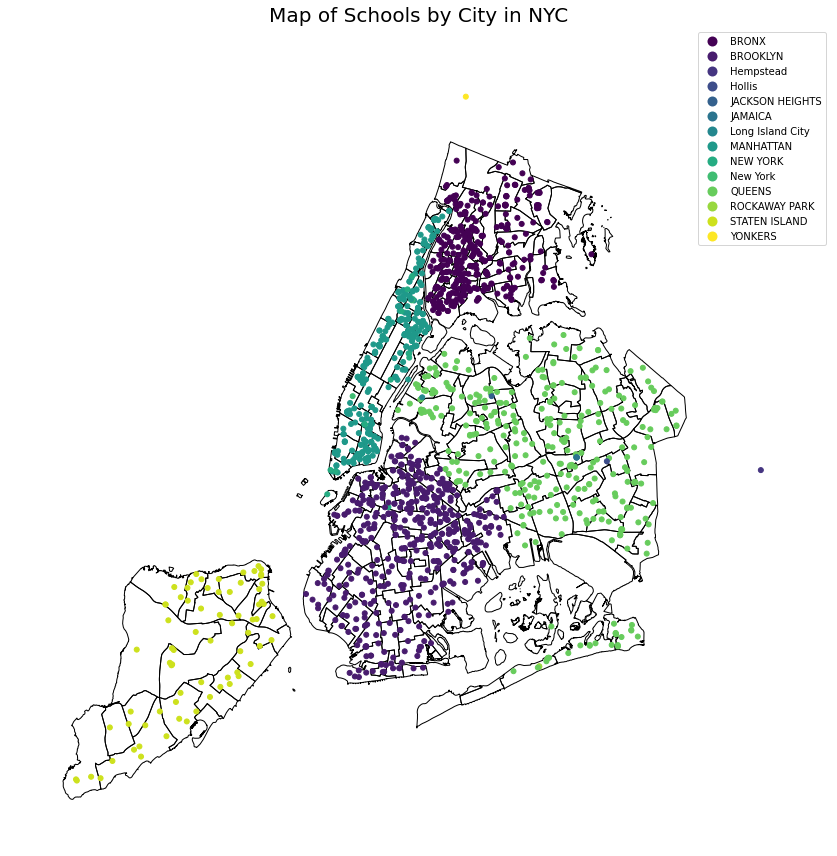

In [480]:
ax = gplt.polyplot(nta_shape.to_crs(4326), 
                   projection=gcrs.AlbersEqualArea(), 
                   figsize=(12,12))

gplt.pointplot(school_points.to_crs(4326),
               hue='City', 
               ax=ax, 
               legend=True,
               zorder=1)

ax.set_title('Map of Schools by City in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
plt.tight_layout()
plt.savefig('figures/6-6-b.png', facecolor='w')

## 6.7 One-to-One Dot Density Map with Joint Grids

In [481]:
# creating lat and lon coordinates columns from the geometries 
school_points['lon'], school_points['lat'] = school_points.to_crs(4326)['geometry'].x, school_points.to_crs(4326)['geometry'].y

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,...,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry,x,y,lon,lat
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,...,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759),980985.054,175780.759,-74.012,40.649
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,...,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911),997785.136,178431.911,-73.951,40.656
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,...,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361),991224.983,156323.361,-73.975,40.596
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,...,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993),988439.681,160709.993,-73.985,40.608
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,...,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591),988205.073,158329.591,-73.986,40.601


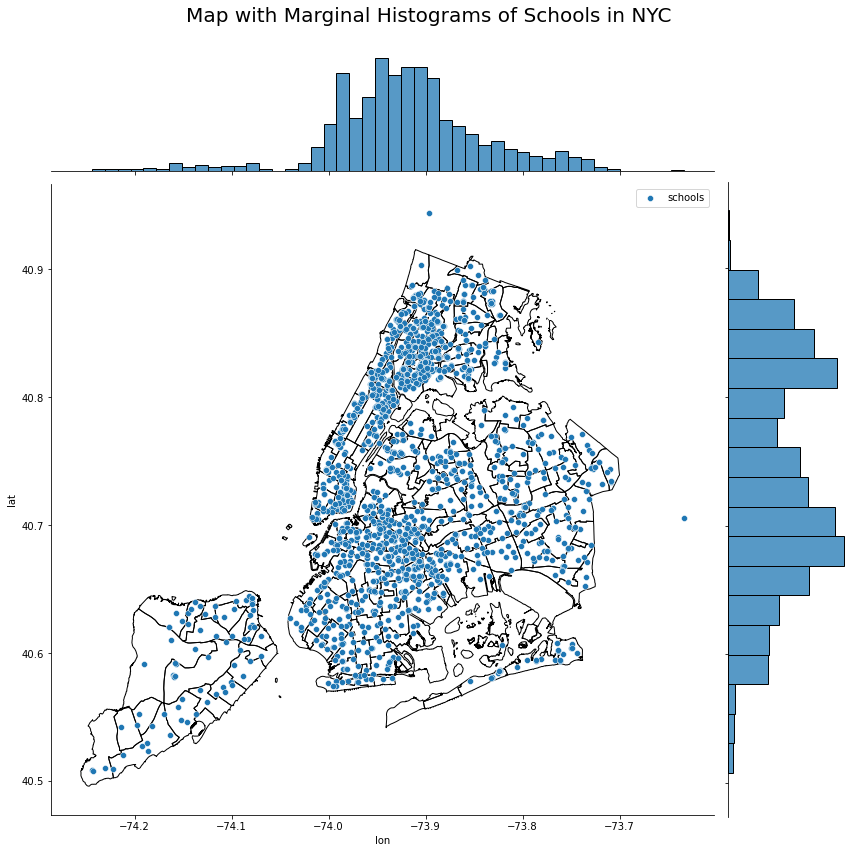

In [482]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12, 
                  label='schools', 
                  legend=True)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')


g.fig.suptitle("Map with Marginal Histograms of Schools in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-a.png', facecolor='w')

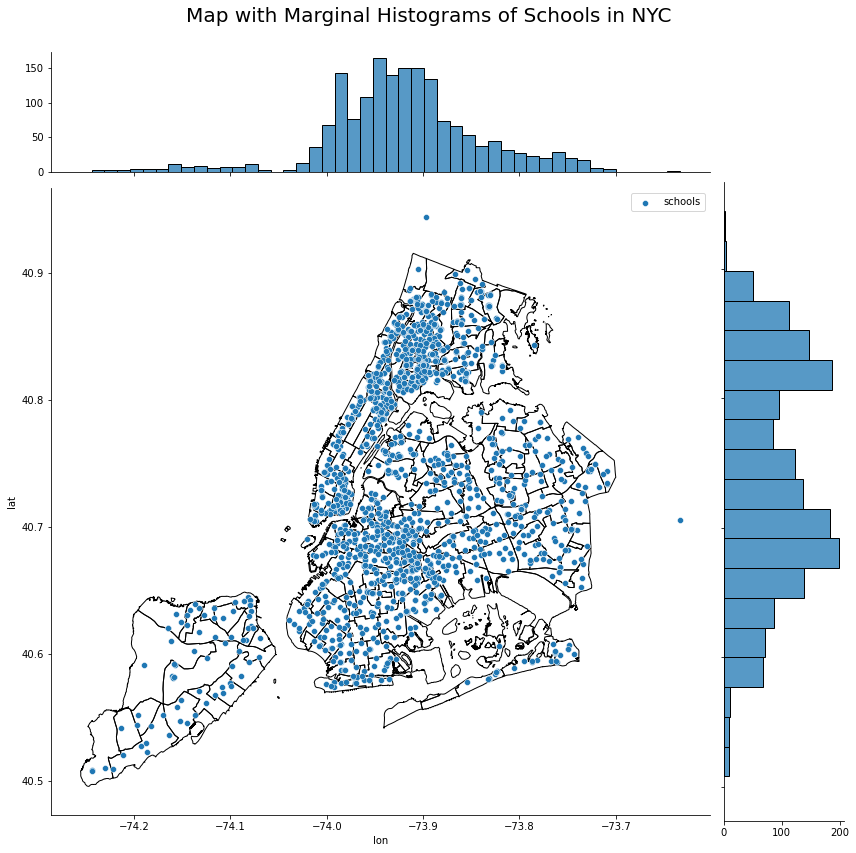

In [483]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  marginal_ticks=True,
                  label='schools', 
                  legend=True)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Histograms of Schools in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-b.png', facecolor='w')

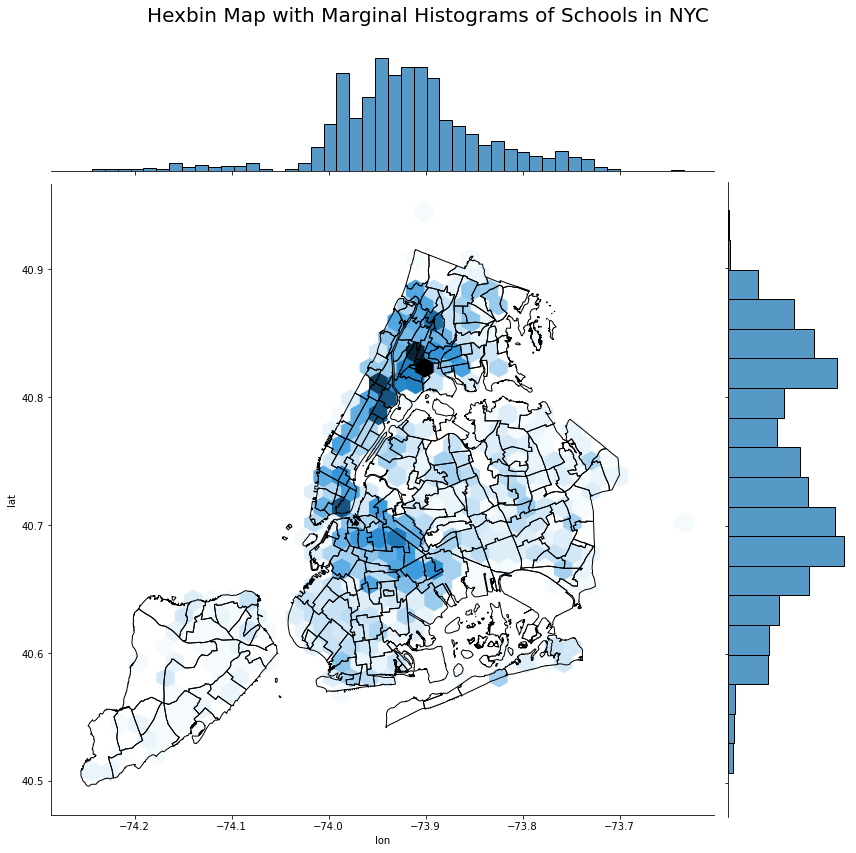

In [484]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  kind='hex')

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Hexbin Map with Marginal Histograms of Schools in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-c.png', facecolor='w')

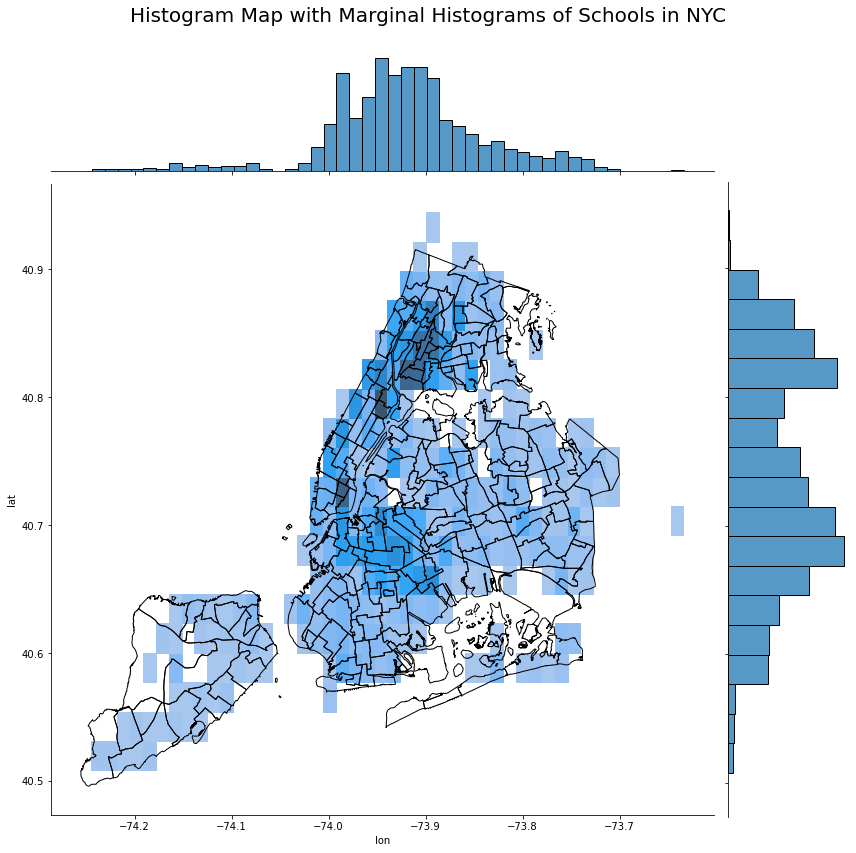

In [485]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  kind='hist')


nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Histogram Map with Marginal Histograms of Schools in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-d.png', facecolor='w')

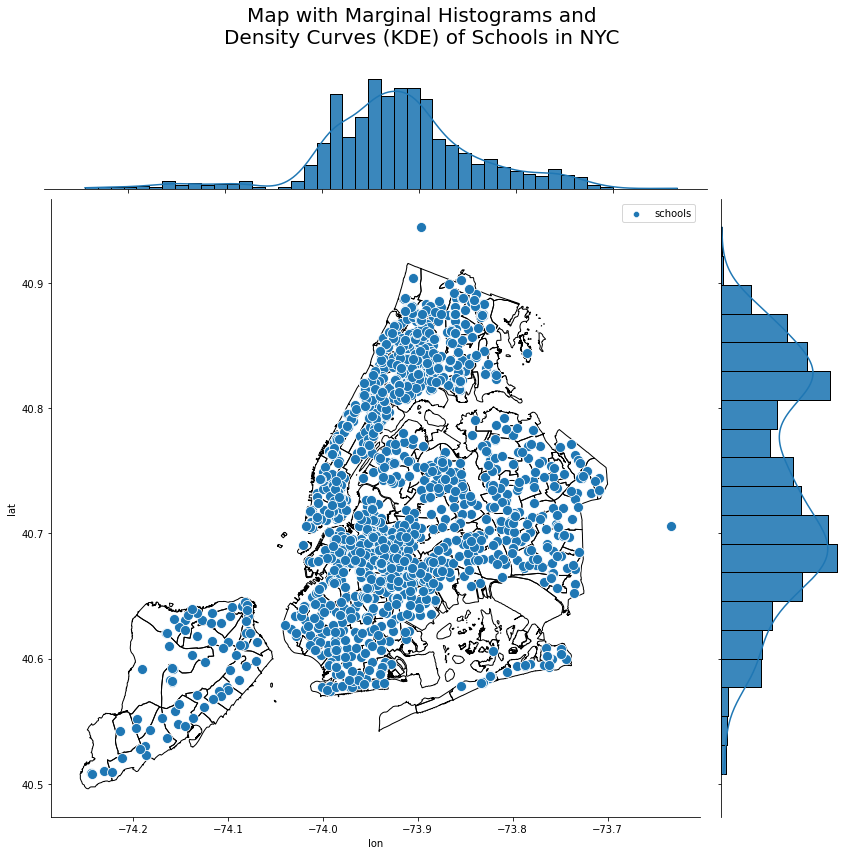

In [486]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  label='schools', 
                  legend=True)

g.plot_joint(sns.scatterplot, 
             s=100)

g.plot_marginals(sns.histplot, 
                 kde=True)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Histograms and\nDensity Curves (KDE) of Schools in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-e.png', facecolor='w')

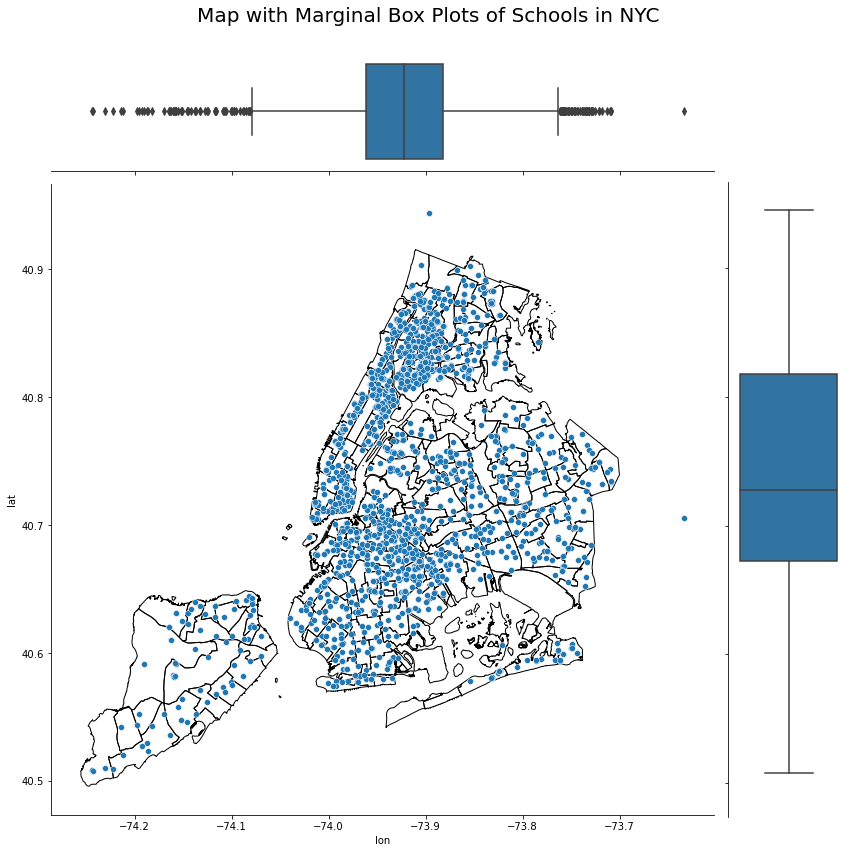

In [487]:
g = sns.JointGrid(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12)

g.plot(sns.scatterplot, 
       sns.boxplot)


nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Box Plots of Schools in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-f.png', facecolor='w')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


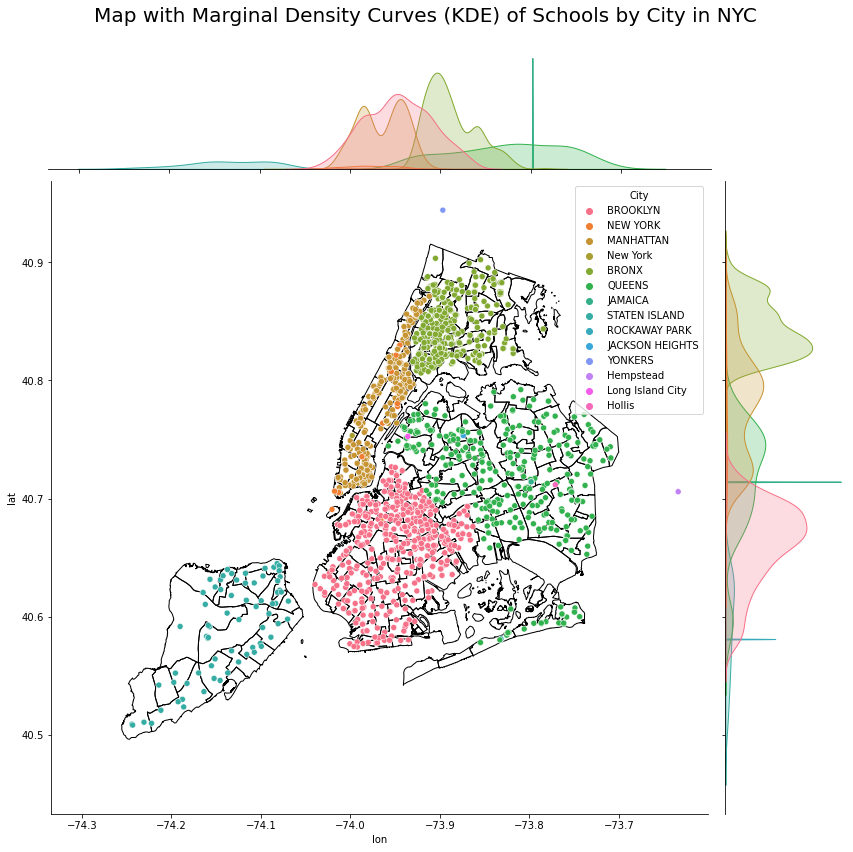

In [488]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  hue='City',
                  height=12)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Density Curves (KDE) of Schools by City in NYC\n", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-g.png', facecolor='w')

## 6.8 Cartogram Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geoplot/geoplot.py:257: UserWarning: Please specify "legend_var" explicitly when both "hue" and "scale" are specified. Defaulting to "legend_var='hue'".
  f'Please specify "legend_var" explicitly when both "hue" and "scale" are '


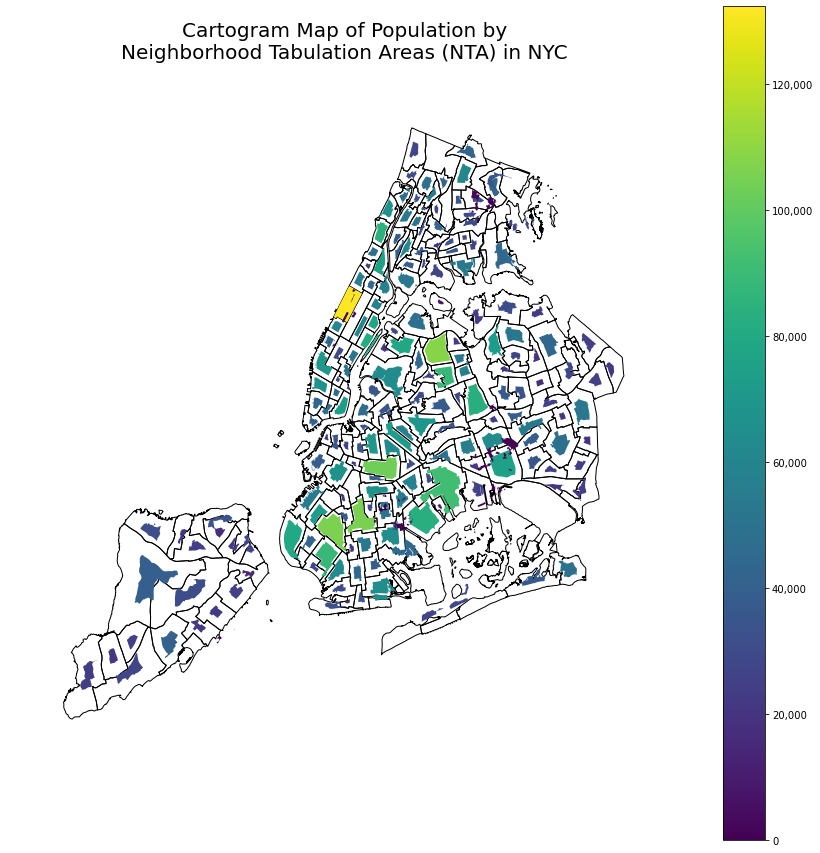

In [489]:
nta_pop.set_geometry('geometry', inplace=True)

comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

ax = gplt.cartogram(nta_pop.to_crs(4326), 
                    scale='Population', 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12), 
                    legend=True, 
                    hue='Population',
                    legend_kwargs={'format':comma_fmt})

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0)

ax.set_title('Cartogram Map of Population by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20,
             pad=10)
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-8-a.png', facecolor='w')

## 6.9 Voroni Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/geoseries.py:371: UserWarning: GeoSeries.isna() previously returned True for both missing (None) and empty geometries. Now, it only returns True for missing values. Since the calling GeoSeries contains empty geometries, the result has changed compared to previous versions of GeoPandas.
Given a GeoSeries 's', you can use 's.is_empty | s.isna()' to get back the old behaviour.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.isna', UserWarning)
  return self.isna()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:852: UserWarning: Geometry column does not contain geometry.
  warnings.warn("Geometry column does not contain geometry.")


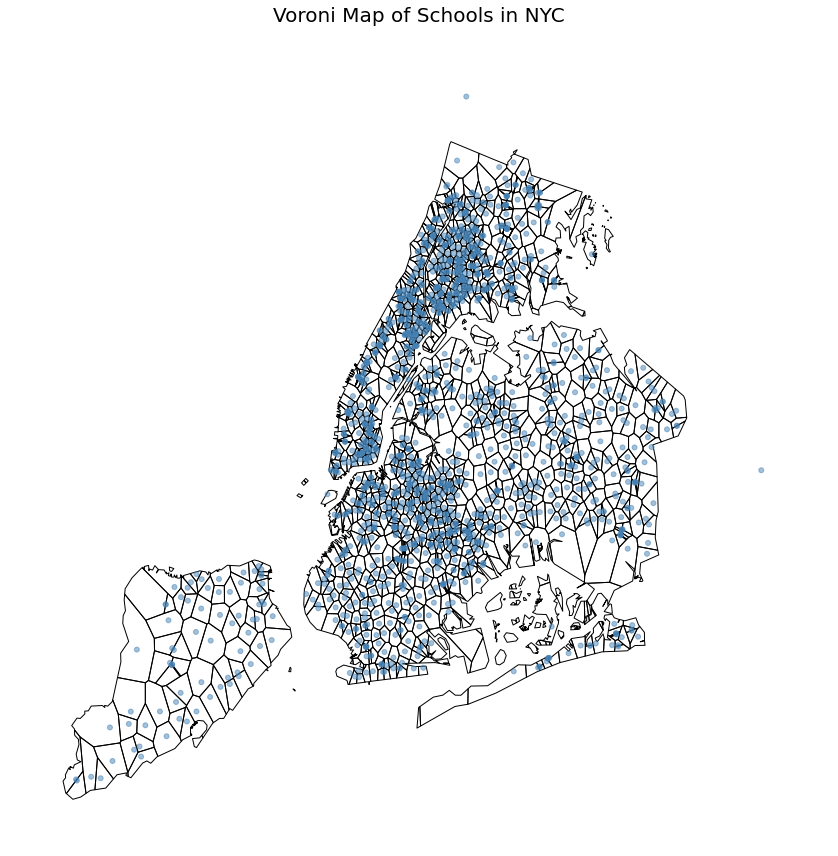

In [490]:
boros = gpd.read_file(gpd.datasets.get_path('nybb'))

ax = gplt.voronoi(school_points.to_crs(4326), 
                  projection=gcrs.AlbersEqualArea(),
                  clip=boros.to_crs(4326).simplify(0.001),
                  figsize=(12,12),
                  zorder=0)

gplt.pointplot(school_points.to_crs(4326), 
               alpha=.5,
               ax=ax)

ax.set_title('Voroni Map of Schools in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-9-a.png', facecolor='w')

## 6.10 Quadtree Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/geoseries.py:371: UserWarning: GeoSeries.isna() previously returned True for both missing (None) and empty geometries. Now, it only returns True for missing values. Since the calling GeoSeries contains empty geometries, the result has changed compared to previous versions of GeoPandas.
Given a GeoSeries 's', you can use 's.is_empty | s.isna()' to get back the old behaviour.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.isna', UserWarning)
  return self.isna()


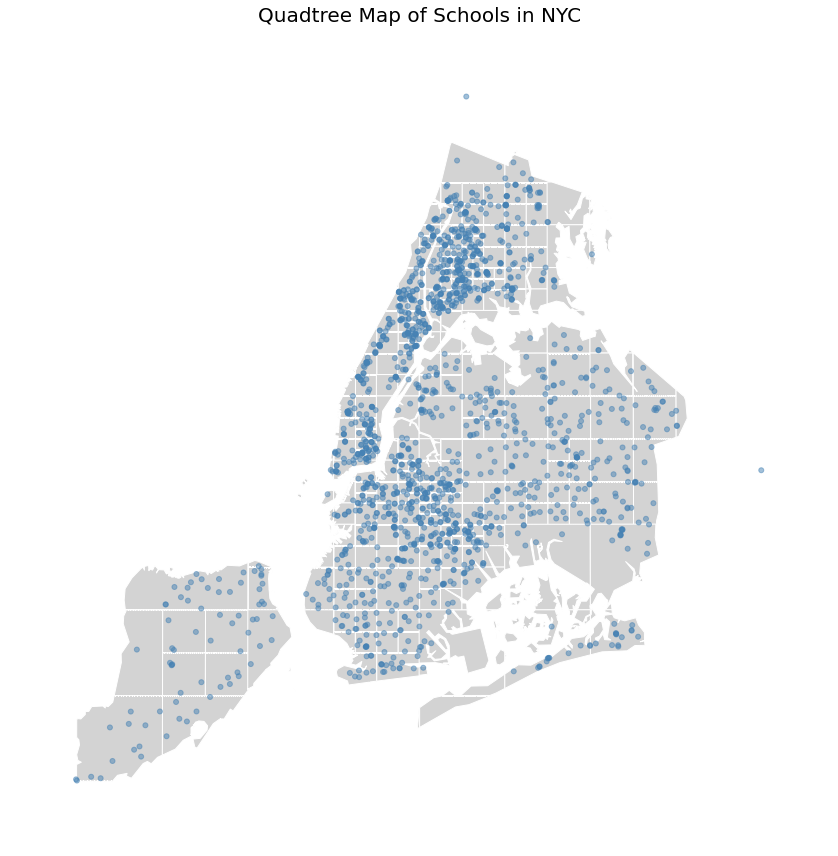

In [491]:
# reading in nyc boros geodataframe
boros = gpd.read_file(gpd.datasets.get_path('nybb'))

ax = gplt.quadtree(school_points.to_crs(4326), 
                   nmax=1,
                   projection=gcrs.AlbersEqualArea(), 
                   
                   # clipping quadtree map to boros shape
                   clip=boros.to_crs(4326).simplify(0.001),
                   facecolor='lightgray', 
                   edgecolor='white', 
                   figsize=(12,12),
                   zorder=0)

gplt.pointplot(school_points.to_crs(4326), 
               alpha=.5,
               ax=ax)

ax.set_title('Quadtree Map of Schools in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-10-a.png', facecolor='w')

## 6.11 Aesthetics for Maps

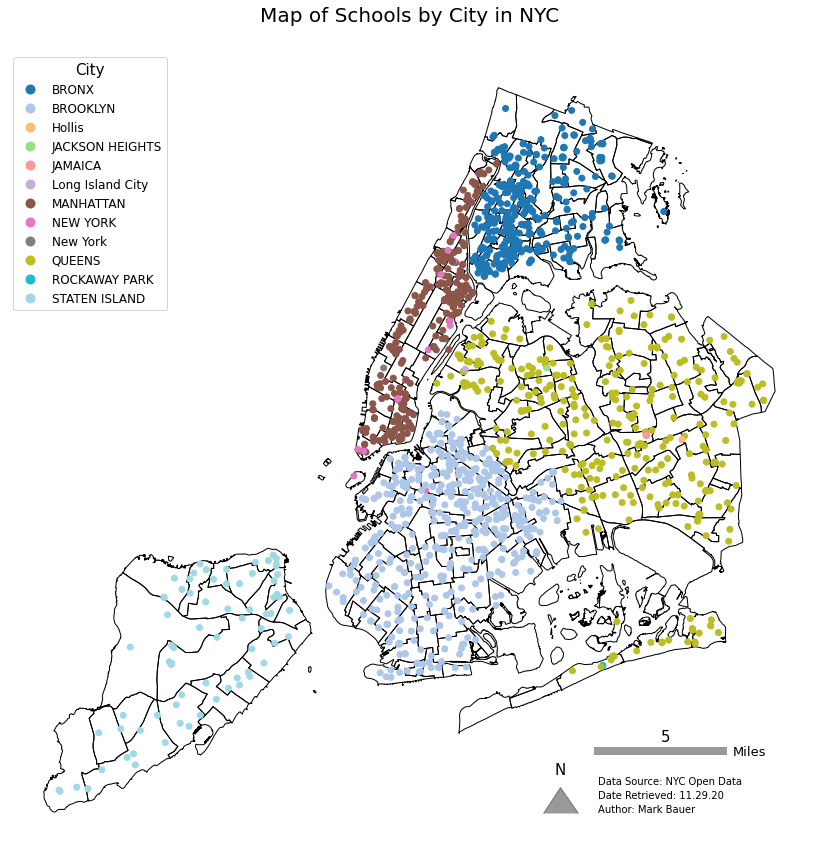

In [492]:
fig, ax = plt.subplots(figsize=(12,12)) # creating figure and axis

# clipping only school points within the five boroughs
school_points_clipped = gpd.clip(school_points, nta_shape.to_crs(epsg=2263))

school_points_clipped.plot(ax=ax, 
                           column='City',
                           cmap='tab20',
                           legend=True,
                           legend_kwds={'loc': "upper left",
                                        'title':'City',
                                        'fontsize': "12",
                                        'title_fontsize':'15'})

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

# drawing the linke coordinates on the axis
x, y = [1030000, 1030000+5280*5], [120000 + 13000, 120000 + 13000]

# plotting the line
plt.plot(x, 
         y, 
         linewidth=8,
         color='black',
         alpha=.4)

# adding the scale bar text to the line
plt.text(1030000 + (5280*5/2), 120000 + 15000, '5', dict(size=15))
plt.text(1030000+5280*5 + 2000, 120000 + 12000, 'Miles', dict(size=13))

# plotting a triangle to serve as our north arrow
plt.plot([1030000 - 8000], [120000], 
         marker=10, 
         markersize=35, 
         mfc='black', 
         mec='black',
         alpha=.4)

# plotting the letter 'N' above our North Arrow
plt.text(1030000 - 9200, 120000 + 8000, 'N', dict(size=15))

# plotting text that describes our map metadata
plt.text(1030000, 120000 + 6000, 'Data Source: NYC Open Data', dict(size=10))
plt.text(1030000, 120000 + 3000, 'Date Retrieved: 11.29.20', dict(size=10))
plt.text(1030000, 120000, 'Author: Mark Bauer', dict(size=10))

ax.set_title('Map of Schools by City in NYC', pad=30, fontsize=20)
ax.set_aspect('equal', 'box')
plt.axis('off')
fig.tight_layout()
plt.savefig('figures/6-11-a.png', facecolor='w')

# 7. Joining Data

## 7.1 Attribute Join

In [493]:
# reading in nta data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [494]:
# reading in population by nta data
url = 'https://data.cityofnewyork.us/api/views/swpk-hqdp/rows.csv?accessType=DOWNLOAD'
nyc_pop = pd.read_csv(url)

nyc_pop.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,Bronx,2000,5,BX01,Claremont-Bathgate,28149
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
2,Bronx,2000,5,BX05,Bedford Park-Fordham North,55329
3,Bronx,2000,5,BX06,Belmont,25967
4,Bronx,2000,5,BX07,Bronxdale,34309


In [495]:
print(nyc_pop['Year'].unique())

# only saving data from year 2010; dropping year 2000 records
nyc_pop = nyc_pop.loc[nyc_pop['Year'] == 2010]

print(nyc_pop['Year'].unique())

[2000 2010]
[2010]


In [496]:
# making sure our join field is the same datatype
print(nta_shape['ntaname'].dtype)
print(nyc_pop['NTA Name'].dtype)

object
object


In [497]:
nta_shape.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ntacode      195 non-null    object  
 1   shape_area   195 non-null    object  
 2   county_fips  195 non-null    object  
 3   ntaname      195 non-null    object  
 4   shape_leng   195 non-null    object  
 5   boro_name    195 non-null    object  
 6   boro_code    195 non-null    object  
 7   geometry     195 non-null    geometry
dtypes: geometry(1), object(7)
memory usage: 12.3+ KB


In [498]:
# merging our nta shape data with the population data
nta_with_pop = nta_shape.merge(nyc_pop, 
                               left_on='ntacode', 
                               right_on='NTA Code')

In [499]:
nta_with_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ...",Brooklyn,2010,47,BK88,Borough Park,106357
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...",Queens,2010,81,QN51,Murray Hill,51739
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...",Queens,2010,81,QN27,East Elmhurst,23150
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ...",Brooklyn,2010,47,BK95,Erasmus,29938
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ...",Queens,2010,81,QN07,Hollis,20269


In [500]:
# now our nta shape has the new columns from our population data
nta_with_pop.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 195 entries, 0 to 194
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   ntacode           195 non-null    object  
 1   shape_area        195 non-null    object  
 2   county_fips       195 non-null    object  
 3   ntaname           195 non-null    object  
 4   shape_leng        195 non-null    object  
 5   boro_name         195 non-null    object  
 6   boro_code         195 non-null    object  
 7   geometry          195 non-null    geometry
 8   Borough           195 non-null    object  
 9   Year              195 non-null    int64   
 10  FIPS County Code  195 non-null    int64   
 11  NTA Code          195 non-null    object  
 12  NTA Name          195 non-null    object  
 13  Population        195 non-null    int64   
dtypes: geometry(1), int64(3), object(10)
memory usage: 22.9+ KB


## 7.2 Spatial Join

In [501]:
# reading in nta shape data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [502]:
# reading in schools points data
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'
school_points = gpd.read_file(zipfile)

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


In [503]:
# identifying the CRS
nta_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [504]:
# identifying the CRS
school_points.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [505]:
# changing CRS so they both match
nta_shape.to_crs(epsg=2263, inplace=True)
nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [506]:
school_points.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1709 entries, 0 to 1708
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ATS_CODE    1707 non-null   object  
 1   BORO        1693 non-null   object  
 2   BORONUM     1709 non-null   float64 
 3   LOC_CODE    1709 non-null   object  
 4   SCHOOLNAME  1709 non-null   object  
 5   SCH_TYPE    1709 non-null   object  
 6   MANAGED_BY  1709 non-null   int64   
 7   GEO_DISTRI  1709 non-null   int64   
 8   ADMIN_DIST  1709 non-null   int64   
 9   ADDRESS     1709 non-null   object  
 10  STATE_CODE  1709 non-null   object  
 11  ZIP         1709 non-null   int64   
 12  PRINCIPAL   1693 non-null   object  
 13  PRIN_PH     1694 non-null   object  
 14  FAX         1657 non-null   object  
 15  GRADES      1708 non-null   object  
 16  City        1709 non-null   object  
 17  geometry    1709 non-null   geometry
dtypes: float64(1), geometry(1), int64(4), ob

In [507]:
# spatial join nta data to the school points data with operation = 'intersects'
school_points_with_nta = gpd.sjoin(school_points, 
                                   nta_shape, 
                                   how="inner", 
                                   op='intersects')

In [508]:
school_points_with_nta.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,...,City,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,...,BROOKLYN,POINT (980985.054 175780.759),119,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
36,b'15K136 \xa0\xa0\xa0\xa0\xa0',K,2.000,K136,I.S. 136 CHARLES O. DEWEY,Junior High-Intermediate-Middle,1,15,15,4004 4 AVENUE,...,BROOKLYN,POINT (982218.628 176813.496),119,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
65,b'15K172 \xa0\xa0\xa0\xa0\xa0',K,2.000,K172,P.S. 172 BEACON SCHOOL OF EXCELLENCE,Elementary,1,15,15,825 4 AVENUE,...,BROOKLYN,POINT (984158.590 178921.890),119,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
168,b'15K295 \xa0\xa0\xa0\xa0\xa0',K,2.000,K295,P.S. 295,Elementary,1,15,15,330 18 STREET,...,BROOKLYN,POINT (987330.493 180120.659),119,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
222,b'75K371 \xa0\xa0\xa0\xa0\xa0',K,2.000,K371,P.S. 371 - LILLIAN L. RASHKIS,High school,1,15,75,355 37 STREET,...,BROOKLYN,POINT (982776.837 177607.547),119,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3


In [509]:
school_points_with_nta.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1707 entries, 0 to 1615
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ATS_CODE     1707 non-null   object  
 1   BORO         1691 non-null   object  
 2   BORONUM      1707 non-null   float64 
 3   LOC_CODE     1707 non-null   object  
 4   SCHOOLNAME   1707 non-null   object  
 5   SCH_TYPE     1707 non-null   object  
 6   MANAGED_BY   1707 non-null   int64   
 7   GEO_DISTRI   1707 non-null   int64   
 8   ADMIN_DIST   1707 non-null   int64   
 9   ADDRESS      1707 non-null   object  
 10  STATE_CODE   1707 non-null   object  
 11  ZIP          1707 non-null   int64   
 12  PRINCIPAL    1693 non-null   object  
 13  PRIN_PH      1693 non-null   object  
 14  FAX          1656 non-null   object  
 15  GRADES       1706 non-null   object  
 16  City         1707 non-null   object  
 17  geometry     1707 non-null   geometry
 18  index_right  1707 no

<AxesSubplot:>

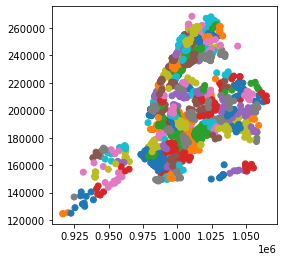

In [510]:
# school points data now has nta information
school_points_with_nta.plot(column='ntaname')

# 8. Indexing and Selecting Data

In [511]:
# reading in nta data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


<AxesSubplot:>

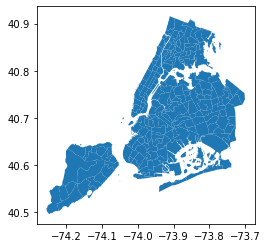

In [512]:
nta_shape.plot()

In [513]:
# slicing the nta data with everything up to lon = -74.1
nta_shape = nta_shape.cx[:-74.1, :]
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
52,SI48,50410816.2219,085,Arden Heights,29689.3955312,Staten Island,5,"MULTIPOLYGON (((-74.17185 40.56152, -74.17223 ..."
56,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((-74.16983 40.56109, -74.16983 ..."
73,SI11,145674612.035,085,Charleston-Richmond Valley-Tottenville,84848.4551217,Staten Island,5,"MULTIPOLYGON (((-74.20700 40.55757, -74.20880 ..."
74,SI32,64963357.8609,085,Rossville-Woodrow,33247.2589139,Staten Island,5,"MULTIPOLYGON (((-74.20315 40.55606, -74.20318 ..."
93,SI08,37752553.5305,085,Grymes Hill-Clifton-Fox Hills,37119.8995823,Staten Island,5,"MULTIPOLYGON (((-74.08155 40.60629, -74.08281 ..."


<AxesSubplot:>

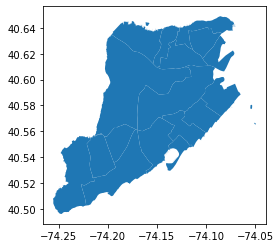

In [514]:
nta_shape.plot()

In [515]:
# slicing the nta data with everything up to lon = -74.1 and everything after lat = 40.56
nta_shape = nta_shape.cx[:-74.1, 40.56:]
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
52,SI48,50410816.2219,085,Arden Heights,29689.3955312,Staten Island,5,"MULTIPOLYGON (((-74.17185 40.56152, -74.17223 ..."
56,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((-74.16983 40.56109, -74.16983 ..."
93,SI08,37752553.5305,085,Grymes Hill-Clifton-Fox Hills,37119.8995823,Staten Island,5,"MULTIPOLYGON (((-74.08155 40.60629, -74.08281 ..."
95,SI45,55429451.2194,085,New Dorp-Midland Beach,34336.5206382,Staten Island,5,"MULTIPOLYGON (((-74.08469 40.57148, -74.08595 ..."
110,SI12,89502323.0269,085,Mariner's Harbor-Arlington-Port Ivory-Granitev...,71306.7527405,Staten Island,5,"MULTIPOLYGON (((-74.15946 40.64145, -74.15975 ..."


<AxesSubplot:>

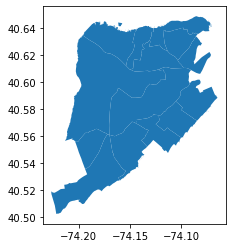

In [516]:
nta_shape.plot()

# 9. Coordinate Reference Systems

In [517]:
# reading in nta data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [518]:
# checking the current CRS
nta_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

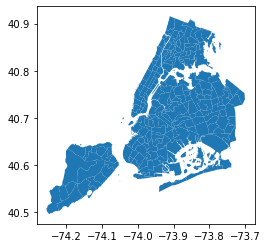

In [519]:
nta_shape.plot()

In [520]:
# switching CRS of nta to epsg = 2263
nta_shape.to_crs(epsg=2263, inplace=True)

nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

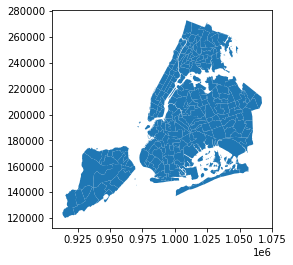

In [521]:
nta_shape.plot()

# 10. Set Operations with Overlay

In [522]:
# reading in nta data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [523]:
# offsetting the nta data 10,000 feet east and north so we can perform overlay operations
# saving as a new column called 'offset'
nta_shape = nta_shape.to_crs(epsg=2263)
nta_shape['offset'] = nta_shape.geometry.translate(10000, 10000)

In [524]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....","MULTIPOLYGON (((1000897.900 179268.121, 100058..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...","MULTIPOLYGON (((1048593.459 231913.355, 104936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...","MULTIPOLYGON (((1032728.275 227530.808, 103305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....","MULTIPOLYGON (((1008608.334 181942.436, 100833..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...","MULTIPOLYGON (((1061539.660 211007.013, 106192..."


Text(0.5, 1.0, 'Offset = 10,000 ft in both x and y directions')

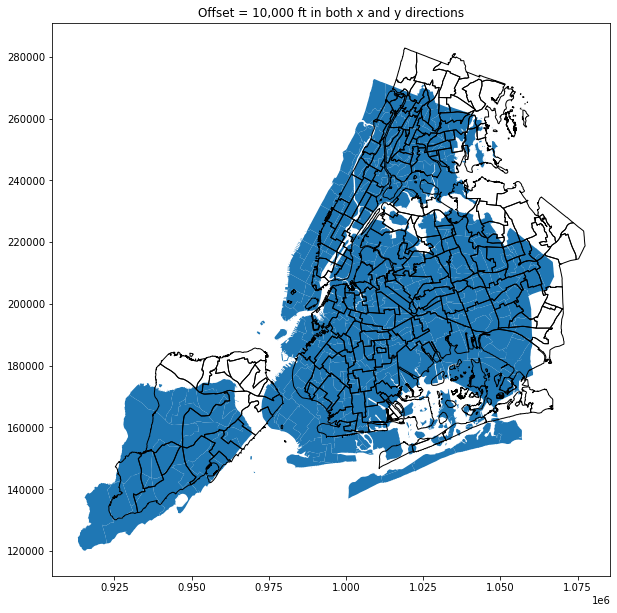

In [525]:
# previewing the new offset shape
fig, ax = plt.subplots(figsize=(10,15))

nta_shape.plot(ax=ax)

nta_shape.set_geometry('offset').plot(ax=ax,
                                      color='none',
                                      edgecolor='black')

ax.set_title('Offset = 10,000 ft in both x and y directions')

<AxesSubplot:>

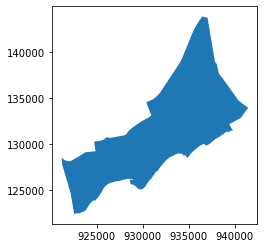

In [526]:
# we will use this nta shape to analyze overlay methods
nta_shape[nta_shape['ntacode'] == 'SI01'].plot()

In [527]:
nta_shape = nta_shape[nta_shape['ntacode'] == 'SI01']
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset
56,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059...."


In [528]:
offset = nta_shape.set_geometry('offset')
offset.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset
56,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059...."


Text(0.5, 1.0, 'Overlay = None (Original Shapes)')

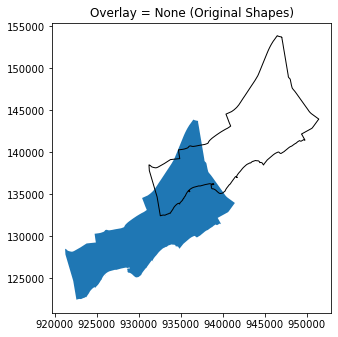

In [529]:
fig, ax = plt.subplots(figsize=(5,15))

nta_shape.plot(ax=ax)

offset.plot(ax=ax, color='None', edgecolor='black')
ax.set_title('Overlay = None (Original Shapes)')

## 10.1 Union

Text(0.5, 1.0, 'Overlay = Union')

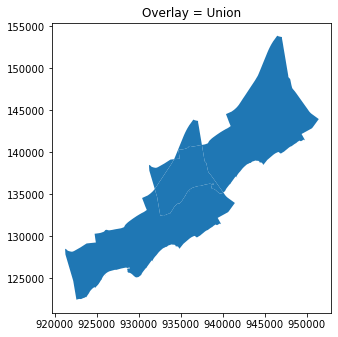

In [530]:
fig, ax = plt.subplots(figsize=(5,15))

# analyzing union overlay method
union = gpd.overlay(nta_shape, offset, how='union')
union.plot(ax=ax)
ax.set_title('Overlay = Union')

## 10.2 Intersection

Text(0.5, 1.0, 'Overlay = Intersection')

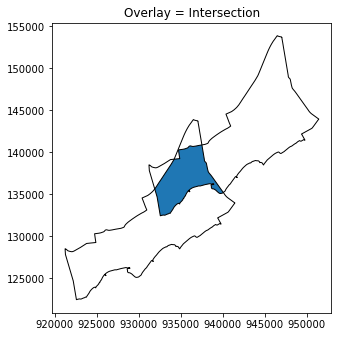

In [531]:
fig, ax = plt.subplots(figsize=(5,15))

# analyzing the intersection overlay method
intersection = gpd.overlay(nta_shape, offset, how='intersection')
intersection.plot(ax=ax)
offset.plot(ax=ax, color='None', edgecolor='black')
nta_shape.plot(ax=ax, color='None',  edgecolor='black')
ax.set_title('Overlay = Intersection')

## 10.3 Symmetric Difference

Text(0.5, 1.0, 'Overlay = Symmetric Difference')

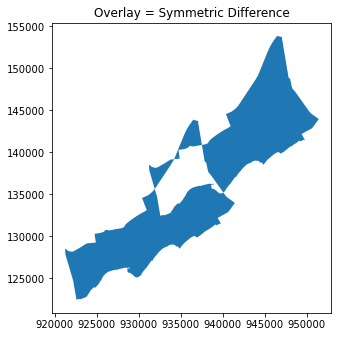

In [532]:
fig, ax = plt.subplots(figsize=(5,15))

# analyzing the symmetric_difference overlay method
symmetric_difference = gpd.overlay(nta_shape, offset, how='symmetric_difference')
symmetric_difference.plot(ax=ax)
ax.set_title('Overlay = Symmetric Difference')

## 10.4 Difference

Text(0.5, 1.0, 'Overlay = Difference')

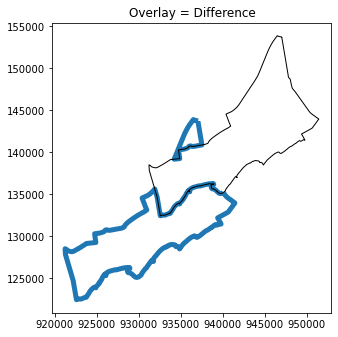

In [533]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

# analyzing the difference overlay method
difference = gpd.overlay(nta_shape, offset, how='difference')
difference.plot(ax=ax, color='None', edgecolor='#1f77b4', linewidth=5)
offset.plot(ax=ax, color='None', edgecolor='black', zorder=1)
ax.set_title('Overlay = Difference')

## 10.5 Identity

Text(0.5, 1.0, 'Overlay = Identity')

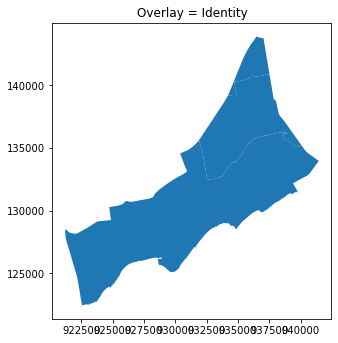

In [534]:
fig, ax = plt.subplots(figsize=(5,15))

# analyzing the identity overlay method
identity = gpd.overlay(nta_shape, offset, how='identity')
identity.plot(ax=ax)
ax.set_title('Overlay = Identity')

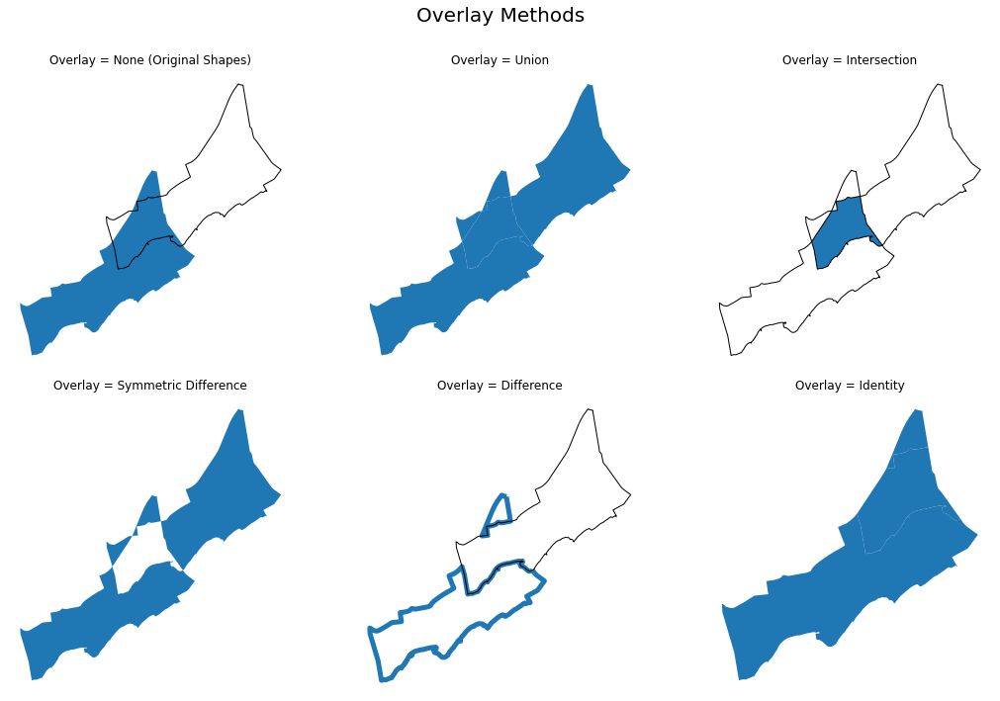

In [535]:
# plotting overlay methods
fig, axs = plt.subplots(2, 3, sharey=False, figsize=(15,10))

nta_shape.plot(ax=axs[0, 0])
offset.plot(ax=axs[0, 0], color='None', edgecolor='black')
axs[0, 0].set_title('Overlay = None (Original Shapes)')
axs[0, 0].axis('off')

union = gpd.overlay(nta_shape, offset, how='union')
union.plot(ax=axs[0, 1])
axs[0, 1].set_title('Overlay = Union')
axs[0, 1].axis('off')

intersection = gpd.overlay(nta_shape, offset, how='intersection')
intersection.plot(ax=axs[0, 2])
offset.plot(ax=axs[0, 2], color='None', edgecolor='black')
nta_shape.plot(ax=axs[0, 2], color='None',  edgecolor='black')
axs[0, 2].set_title('Overlay = Intersection')
axs[0, 2].axis('off')

symmetric_difference = gpd.overlay(nta_shape, offset, how='symmetric_difference')
symmetric_difference.plot(ax=axs[1, 0])
axs[1, 0].set_title('Overlay = Symmetric Difference')
axs[1, 0].axis('off')

difference = gpd.overlay(nta_shape, offset, how='difference')
difference.plot(ax=axs[1, 1], color='None', edgecolor='#1f77b4', linewidth=5)
offset.plot(ax=axs[1, 1], color='None', edgecolor='black', zorder=1)
axs[1, 1].set_title('Overlay = Difference')
axs[1, 1].axis('off')

identity = gpd.overlay(nta_shape, offset, how='identity')
identity.plot(ax=axs[1, 2])
axs[1, 2].set_title('Overlay = Identity')
axs[1, 2].axis('off')

fig.suptitle("Overlay Methods\n", fontsize=20)
fig.tight_layout()
plt.savefig('figures/10-a.png', facecolor='w')

# 11. Aggregation with Dissolve

In [536]:
# reading in nta data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


<AxesSubplot:>

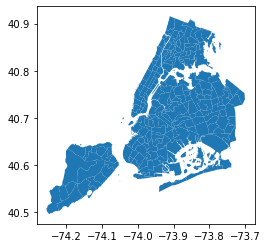

In [537]:
nta_shape.plot()

In [538]:
# dissolving nta shapes by borough
boro = nta_shape.dissolve(by='boro_name')
boro.head()

,geometry,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_code
boro_name,,,,,,,
Bronx,"MULTIPOLYGON (((-73.87287 40.78598, -73.87288 ...",BX33,10732452.0604,005,Longwood,18982.1300681,2
Brooklyn,"MULTIPOLYGON (((-73.95939 40.57391, -73.95983 ...",BK88,54005019.048,047,Borough Park,39247.2278309,3
Manhattan,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",MN21,7526913.95137,061,Gramercy,12096.8911742,1
Queens,"MULTIPOLYGON (((-73.88347 40.56848, -73.88337 ...",QN51,52488277.5915,081,Murray Hill,33266.9048721,4
Staten Island,"MULTIPOLYGON (((-74.09993 40.55907, -74.10021 ...",SI48,50410816.2219,085,Arden Heights,29689.3955312,5


<AxesSubplot:>

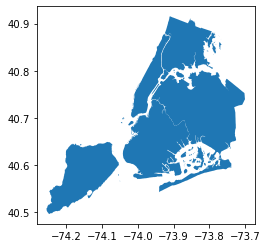

In [539]:
boro.plot()

# 12. Additional Attributes and Methods

## 12.1 Unary Predicates

In [540]:
nta_shape.geometry.is_empty.value_counts()

False    195
dtype: int64

In [541]:
nta_shape.geometry.isna().value_counts()

False    195
Name: geometry, dtype: int64

In [542]:
nta_shape['geometry'].is_simple.value_counts()

True    195
dtype: int64

## 12.2 Binary Predicates

In [543]:
# reading in nta data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.to_crs(epsg=2263, inplace=True)
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


### 12.2.1 Centroids vs. Representative Points

In [544]:
nta_shape.centroid.geom_almost_equals(nta_shape.centroid).value_counts()

True    195
dtype: int64

In [545]:
# an nta's shape centroid does not equal their representative point
nta_shape.centroid.geom_almost_equals(nta_shape.representative_point()).value_counts()

False    195
dtype: int64

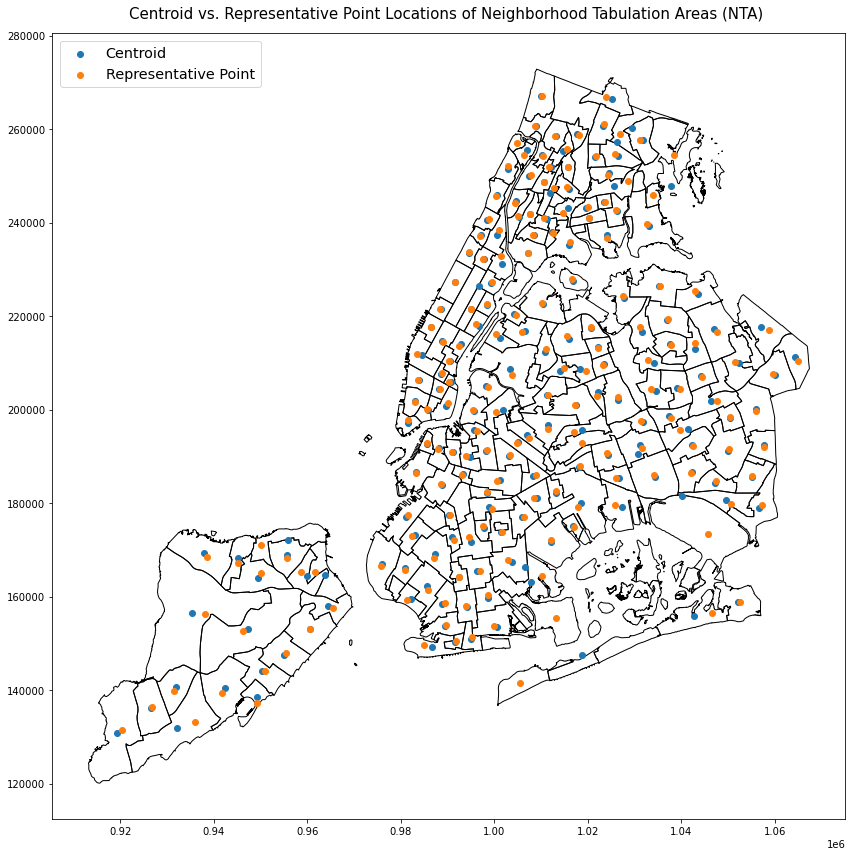

In [546]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.plot(ax=ax, 
               color='none', 
               edgecolor='black')

nta_shape.centroid.plot(ax=ax, 
                        label='Centroid')

nta_shape.representative_point().plot(ax=ax, 
                                      label='Representative Point')

ax.legend(loc=2, fontsize='x-large')
ax.set_title('Centroid vs. Representative Point Locations of Neighborhood Tabulation Areas (NTA) ', 
             fontsize=15,
             pad=15)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-2-b.png', facecolor='w')

In [547]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


In [548]:
# offsetting the nta shapes by 10,000 feet in north and east directions
nta_shape['offset'] = nta_shape.geometry.translate(10000, 10000)
nta_shape['centroid_column'] = nta_shape.centroid

In [549]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....","MULTIPOLYGON (((1000897.900 179268.121, 100058...",POINT (987397.463 169148.408)
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...","MULTIPOLYGON (((1048593.459 231913.355, 104936...",POINT (1037005.224 219265.318)
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...","MULTIPOLYGON (((1032728.275 227530.808, 103305...",POINT (1020706.745 217413.871)
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....","MULTIPOLYGON (((1008608.334 181942.436, 100833...",POINT (997674.726 174677.650)
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...","MULTIPOLYGON (((1061539.660 211007.013, 106192...",POINT (1050471.492 198271.804)


Text(0.5, 1.0, 'Offset of 10,000 ft in both x and y directions')

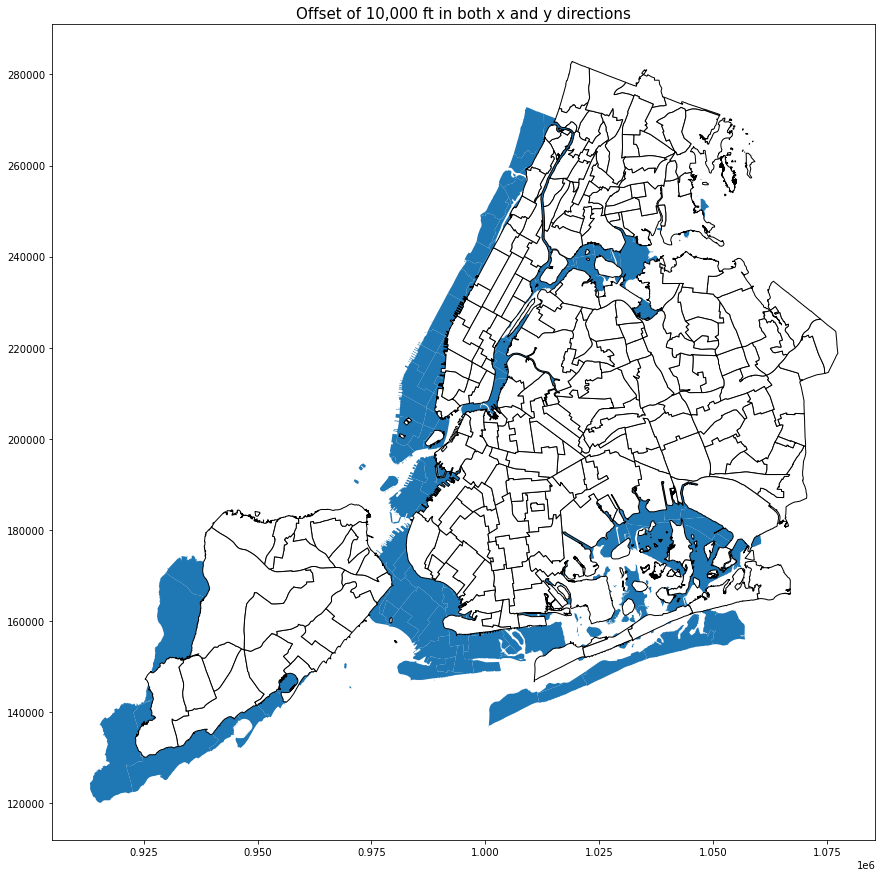

In [550]:
fig, ax = plt.subplots(figsize=(20,15)) 

nta_shape.plot(ax=ax, 
               label='original')

nta_shape.set_geometry('offset').plot(ax=ax,
                                      color='white',
                                      edgecolor='black', 
                                      label='offset')

ax.set_title('Offset of 10,000 ft in both x and y directions', fontsize=15)

### 12.2.2 Intersects

In [551]:
# An object is said to intersect `other` if its `boundary` and `interior`
# intersects in any way with those of the other.
nta_shape['geometry'].intersects(nta_shape.set_geometry('offset')).value_counts()

False    185
True      10
dtype: int64

In [552]:
nta_shape.loc[nta_shape['geometry'].intersects(nta_shape.set_geometry('offset')) == True].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
56,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059....",POINT (932069.309 131939.902)
73,SI11,145674612.035,085,Charleston-Richmond Valley-Tottenville,84848.4551217,Staten Island,5,"MULTIPOLYGON (((926730.616 142481.322, 926228....","MULTIPOLYGON (((936730.616 152481.322, 936228....",POINT (919322.784 130818.739)
94,QN05,61569261.2362,081,Rosedale,64163.7256455,Queens,4,"MULTIPOLYGON (((1060282.018 188318.545, 106027...","MULTIPOLYGON (((1070282.018 198318.545, 107027...",POINT (1056539.403 179052.939)
159,SI05,327290184.621,085,New Springville-Bloomfield-Travis,109065.873429,Staten Island,5,"MULTIPOLYGON (((941550.555 162375.099, 941570....","MULTIPOLYGON (((951550.555 172375.099, 951570....",POINT (935269.175 156417.849)
162,BK99,225339443.183,047,park-cemetery-etc-Brooklyn,385534.318657,Brooklyn,3,"MULTIPOLYGON (((1007822.043 152881.588, 100783...","MULTIPOLYGON (((1017822.043 162881.588, 101783...",POINT (1006576.015 166297.653)


Text(0.5, 1.0, 'Intersects = True')

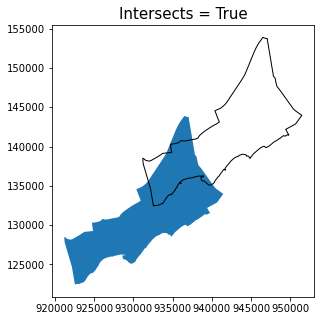

In [553]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('geometry').plot(ax=ax)                                            

nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('offset').plot(ax=ax, 
                                                                     color='none', 
                                                                     edgecolor='black')

ax.set_title('Intersects = True', fontsize=15)

Text(0.5, 1.0, 'Intersects = False')

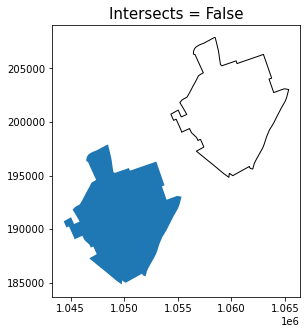

In [554]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[9]].set_geometry('geometry').plot(ax=ax)

nta_shape.iloc[[9]].set_geometry('offset').plot(ax=ax, 
                                                color='none', 
                                                edgecolor='black')

ax.set_title('Intersects = False', fontsize=15)

### 12.2.3 Contains

In [555]:
# An object is said to contain `other` if its `interior` contains the
# `boundary` and `interior` of the other object and their boundaries do
# not touch at all.
nta_shape['geometry'].contains(nta_shape['centroid_column']).value_counts()

True     186
False      9
dtype: int64

In [556]:
nta_shape.loc[nta_shape['geometry'].contains(nta_shape['centroid_column']) == False].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
89,BX03,40256794.3486,005,Eastchester-Edenwald-Baychester,59164.9994492,Bronx,2,"MULTIPOLYGON (((1033004.041 263542.959, 103327...","MULTIPOLYGON (((1043004.041 273542.959, 104327...",POINT (1029422.433 260268.325)
107,MN99,91544507.0006,061,park-cemetery-etc-Manhattan,155527.024058,Manhattan,1,"MULTIPOLYGON (((981219.056 188655.316, 980940....","MULTIPOLYGON (((991219.056 198655.316, 990940....",POINT (996760.023 226349.690)
123,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 963907....","MULTIPOLYGON (((974105.855 181704.149, 973907....",POINT (955854.706 172087.534)
162,BK99,225339443.183,047,park-cemetery-etc-Brooklyn,385534.318657,Brooklyn,3,"MULTIPOLYGON (((1007822.043 152881.588, 100783...","MULTIPOLYGON (((1017822.043 162881.588, 101783...",POINT (1006576.015 166297.653)
168,SI37,46426791.1615,085,Stapleton-Rosebank,55229.6364233,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 964108....","MULTIPOLYGON (((974105.855 181704.149, 974108....",POINT (963788.240 164704.409)


Text(0.5, 1.0, 'Contains = True\n(shape contains point)')

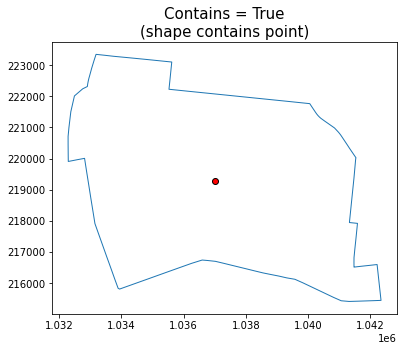

In [557]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=ax, 
                                                  color='none', 
                                                  edgecolor='#1f77b4')

nta_shape.iloc[[1]].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Contains = True\n(shape contains point)', fontsize=15)

Text(0.5, 1.0, "Contains = False\n(shape doesn't contain point)")

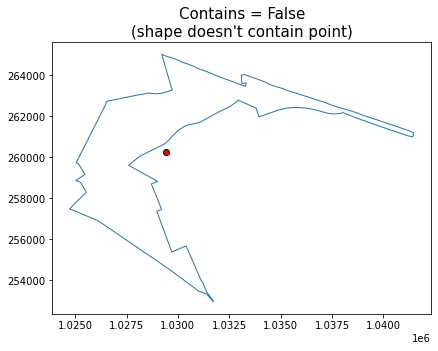

In [558]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape[nta_shape['ntacode'] == 'BX03'].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape[nta_shape['ntacode'] == 'BX03'].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title("Contains = False\n(shape doesn't contain point)", fontsize=15)

### 12.2.4 Within

In [559]:
# An object is said to be within `other` if its `boundary` and `interior`
# intersects only with the `interior` of the other (not its `boundary` or
# `exterior`).
nta_shape['centroid_column'].within(nta_shape['geometry']).value_counts()

True     186
False      9
dtype: int64

In [560]:
nta_shape.loc[nta_shape['centroid_column'].within(nta_shape['geometry']) == False].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
89,BX03,40256794.3486,005,Eastchester-Edenwald-Baychester,59164.9994492,Bronx,2,"MULTIPOLYGON (((1033004.041 263542.959, 103327...","MULTIPOLYGON (((1043004.041 273542.959, 104327...",POINT (1029422.433 260268.325)
107,MN99,91544507.0006,061,park-cemetery-etc-Manhattan,155527.024058,Manhattan,1,"MULTIPOLYGON (((981219.056 188655.316, 980940....","MULTIPOLYGON (((991219.056 198655.316, 990940....",POINT (996760.023 226349.690)
123,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 963907....","MULTIPOLYGON (((974105.855 181704.149, 973907....",POINT (955854.706 172087.534)
162,BK99,225339443.183,047,park-cemetery-etc-Brooklyn,385534.318657,Brooklyn,3,"MULTIPOLYGON (((1007822.043 152881.588, 100783...","MULTIPOLYGON (((1017822.043 162881.588, 101783...",POINT (1006576.015 166297.653)
168,SI37,46426791.1615,085,Stapleton-Rosebank,55229.6364233,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 964108....","MULTIPOLYGON (((974105.855 181704.149, 974108....",POINT (963788.240 164704.409)


Text(0.5, 1.0, 'Within = True\n(point within shape)')

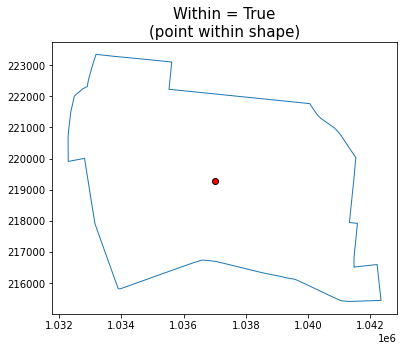

In [561]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape.iloc[[1]].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Within = True\n(point within shape)', fontsize=15)

Text(0.5, 1.0, 'Within = False\n(point not within shape)')

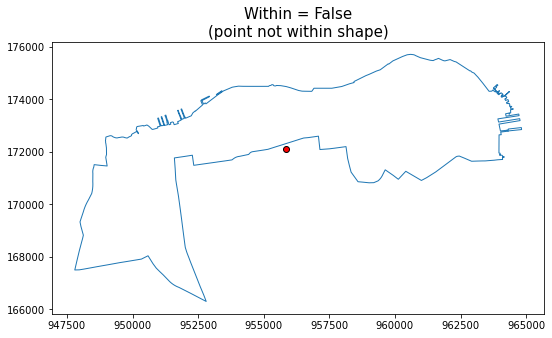

In [562]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape[nta_shape['ntacode'] == 'SI22'].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape[nta_shape['ntacode'] == 'SI22'].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Within = False\n(point not within shape)', fontsize=15)

In [563]:
# reading in streets data
url = 'https://data.cityofnewyork.us/api/geospatial/exjm-f27b?method=export&format=GeoJSON'
streets = gpd.read_file(url)
streets.to_crs(2263, inplace=True)

print(streets.shape)
streets.head()

(119977, 32)


,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,snow_pri,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry
0,6,None,None,0,10458,None,None,TRL,0,None,...,None,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((1017825.856 253319.853, 1017..."
1,1,215-001,None,35,11360,215-000,None,AVE,112262650,None,...,S,4,TW,None,28 AVE,6110,28,2007-11-29T00:00:00,215-027,"MULTILINESTRING ((1047146.080 222733.432, 1047..."
2,1,5631,None,42,10471,5602,None,AVE,1522601877,None,...,H,2,TW,None,ARLINGTON AVE,61140,ARLINGTON,2007-11-29T00:00:00,5699,"MULTILINESTRING ((1009926.638 269075.549, 1010..."
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,C,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((989292.818 189689.736, 98964..."
4,1,120-011,None,40,11415,0,None,BLVD,92269521,None,...,C,4,TF,None,QUEENS BLVD,12438,QUEENS,2007-11-29T00:00:00,120-011,"MULTILINESTRING ((1031371.427 199453.863, 1031..."


<AxesSubplot:>

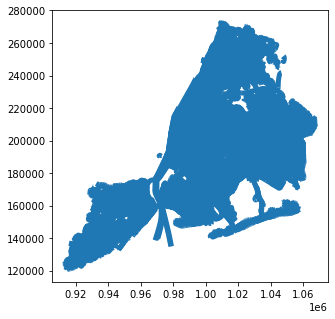

In [564]:
streets.plot(figsize=(20,5), linewidth=5)

<AxesSubplot:>

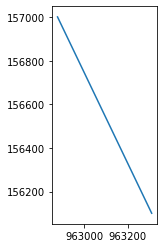

In [565]:
# I already know which street segment crosses with nta, so I'm cheating a bit here.
# so we're only saving this particular street to analyze the 'crosses' method
streets_crosses = streets[streets['physicalid'] == '86662'].reset_index()
streets_crosses.plot()

<AxesSubplot:>

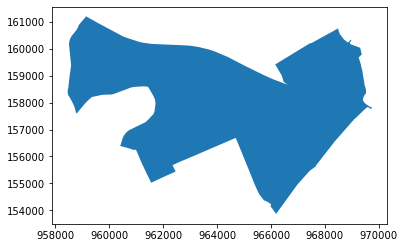

In [566]:
nta_shape_crosses = nta_shape[nta_shape['ntacode'] == 'SI14'].reset_index()
nta_shape_crosses.plot()

### 12.2.5 Crosses

In [567]:
# An object is said to cross `other` if its `interior` intersects the
# `interior` of the other but does not contain it, and the dimension of
# the intersection is less than the dimension of the one or the other.
streets_crosses.crosses(nta_shape_crosses).value_counts()

True    1
dtype: int64

In [568]:
streets_crosses[streets_crosses.crosses(nta_shape_crosses) == True]

,index,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,...,snow_pri,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry
0,174,1,31,None,34,10305,30,None,AVE,1622606701,...,C,5,TW,None,JEROME AVE,86662,JEROME,2007-11-29T00:00:00,139,"MULTILINESTRING ((962875.706 157004.294, 96331..."


In [569]:
nta_shape.iloc[[0]]

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....","MULTIPOLYGON (((1000897.900 179268.121, 100058...",POINT (987397.463 169148.408)


Text(0.5, 1.0, 'Crosses = True')

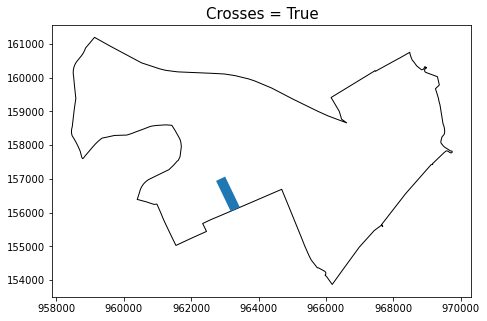

In [570]:
fig, ax = plt.subplots(figsize=(20,5))

streets_crosses.plot(ax=ax, 
                     linewidth=10)

nta_shape_crosses.plot(ax=ax, 
                       color='none',
                       edgecolor='black')

ax.set_title('Crosses = True', fontsize=15)

Text(0.5, 1.0, 'Crosses = False')

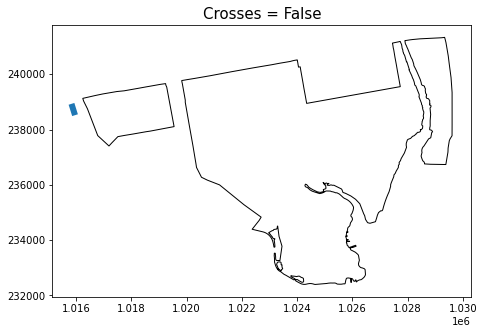

In [571]:
fig, ax = plt.subplots(figsize=(20,5))

streets.iloc[[70]].plot(ax=ax, 
                        linewidth=6)

nta_shape.iloc[[70]].plot(ax=ax, 
                          color='none',
                          edgecolor='black')

ax.set_title('Crosses = False', fontsize=15)

In [572]:
# An object is said to be disjoint to `other` if its `boundary` and
# `interior` does not intersect at all with those of the other.
nta_shape['geometry'].disjoint(nta_shape.set_geometry('offset')).value_counts()

True     185
False     10
dtype: int64

### 12.2.6 Overlaps

In [573]:
nta_shape['geometry'].overlaps(nta_shape.set_geometry('offset')).value_counts()

False    185
True      10
dtype: int64

In [574]:
nta_shape.loc[nta_shape['geometry'].overlaps(nta_shape.set_geometry('offset')) == True].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
56,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059....",POINT (932069.309 131939.902)
73,SI11,145674612.035,085,Charleston-Richmond Valley-Tottenville,84848.4551217,Staten Island,5,"MULTIPOLYGON (((926730.616 142481.322, 926228....","MULTIPOLYGON (((936730.616 152481.322, 936228....",POINT (919322.784 130818.739)
94,QN05,61569261.2362,081,Rosedale,64163.7256455,Queens,4,"MULTIPOLYGON (((1060282.018 188318.545, 106027...","MULTIPOLYGON (((1070282.018 198318.545, 107027...",POINT (1056539.403 179052.939)
159,SI05,327290184.621,085,New Springville-Bloomfield-Travis,109065.873429,Staten Island,5,"MULTIPOLYGON (((941550.555 162375.099, 941570....","MULTIPOLYGON (((951550.555 172375.099, 951570....",POINT (935269.175 156417.849)
162,BK99,225339443.183,047,park-cemetery-etc-Brooklyn,385534.318657,Brooklyn,3,"MULTIPOLYGON (((1007822.043 152881.588, 100783...","MULTIPOLYGON (((1017822.043 162881.588, 101783...",POINT (1006576.015 166297.653)


Text(0.5, 1.0, 'Overlaps = True')

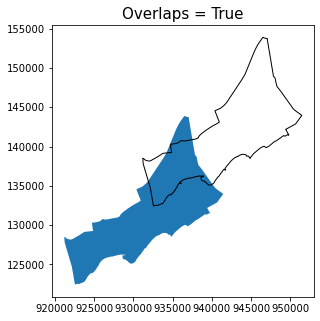

In [575]:
fig, ax = plt.subplots(figsize=(20,5)) 

nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('geometry').plot(ax=ax)

nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('offset').plot(ax=ax, 
                                                                      color='none', 
                                                                      edgecolor='black')

ax.set_title('Overlaps = True', fontsize=15)

Text(0.5, 1.0, 'Overlaps = False')

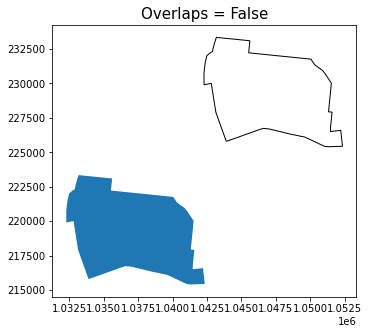

In [576]:
fig, ax = plt.subplots(figsize=(20,5)) 

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=ax)

nta_shape.iloc[[1]].set_geometry('offset').plot(ax=ax, 
                                                color='none', 
                                                edgecolor='black')


ax.set_title('Overlaps = False', fontsize=15)

In [577]:
streets['representative_point'] = streets.representative_point()

streets.head()

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry,representative_point
0,6,None,None,0,10458,None,None,TRL,0,None,...,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((1017825.856 253319.853, 1017...",POINT (1017949.534 252821.992)
1,1,215-001,None,35,11360,215-000,None,AVE,112262650,None,...,4,TW,None,28 AVE,6110,28,2007-11-29T00:00:00,215-027,"MULTILINESTRING ((1047146.080 222733.432, 1047...",POINT (1047146.080 222733.432)
2,1,5631,None,42,10471,5602,None,AVE,1522601877,None,...,2,TW,None,ARLINGTON AVE,61140,ARLINGTON,2007-11-29T00:00:00,5699,"MULTILINESTRING ((1009926.638 269075.549, 1010...",POINT (1009926.638 269075.549)
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((989292.818 189689.736, 98964...",POINT (989648.842 189530.271)
4,1,120-011,None,40,11415,0,None,BLVD,92269521,None,...,4,TF,None,QUEENS BLVD,12438,QUEENS,2007-11-29T00:00:00,120-011,"MULTILINESTRING ((1031371.427 199453.863, 1031...",POINT (1031412.588 199430.359)


### 12.2.7 Touches

In [578]:
streets['geometry'].touches(streets['representative_point']).value_counts()

True     85221
False    34756
dtype: int64

In [579]:
streets.loc[streets['geometry'].touches(streets['representative_point']) == False].head()

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry,representative_point
0,6,None,None,0,10458,None,None,TRL,0,None,...,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((1017825.856 253319.853, 1017...",POINT (1017949.534 252821.992)
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((989292.818 189689.736, 98964...",POINT (989648.842 189530.271)
10,14,None,None,0,None,None,None,RTE,0,None,...,2,NV,None,HIGHLANDS-MARTHAS VYD FERRY RTE,178314,MARTHA'S VYD-HIGHLANDS FERRY,2017-01-09T00:00:00,None,"MULTILINESTRING ((1044414.405 232775.423, 1044...",POINT (1044679.995 237583.134)
16,8,None,None,28,10040,None,None,None,1322600323,None,...,1,TW,None,DRIVEWAY,170875,DRIVEWAY,2015-12-15T00:00:00,None,"MULTILINESTRING ((1005681.023 252432.821, 1005...",POINT (1005892.564 252107.486)
20,1,2,None,30,10033,1,None,AVE,1322603144,None,...,1,TF,None,BENNETT AVE,183608,BENNETT,2007-11-29T00:00:00,64,"MULTILINESTRING ((1001772.937 249124.701, 1001...",POINT (1001899.326 249458.522)


Text(0.5, 1.0, 'Touches = True')

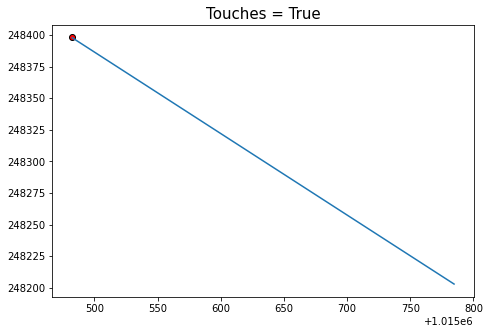

In [580]:
fig, ax = plt.subplots(figsize=(20,5)) 

streets.iloc[[6]].set_geometry('representative_point').plot(ax=ax, 
                                                            color='red', 
                                                            edgecolor='black')

streets.iloc[[6]].plot(ax=ax)

ax.set_title('Touches = True', fontsize=15)

Text(0.5, 1.0, 'Touches = False')

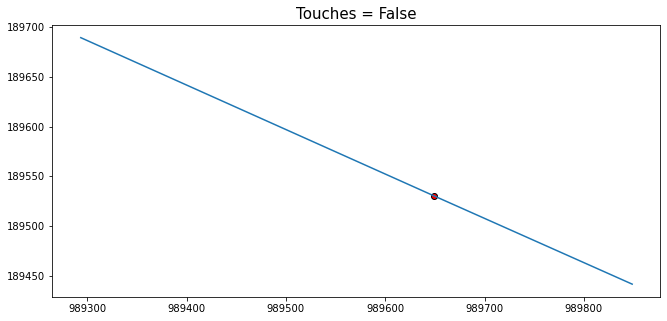

In [581]:
fig, ax = plt.subplots(figsize=(20,5)) 

streets.iloc[[3]].set_geometry('representative_point').plot(ax=ax, 
                                                            color='red', 
                                                            edgecolor='black')

streets.iloc[[3]].plot(ax=ax)

ax.set_title('Touches = False', fontsize=15)

### 12.2.8 Covers

In [582]:
nta_shape['centroid_column']  = nta_shape.centroid

# An object A is said to cover another object B if no points of B lie
# in the exterior of A.
nta_shape['geometry'].covers(nta_shape.set_geometry('centroid_column')).value_counts()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/base.py:61: FutureWarning:     You are passing non-geometry data to the GeoSeries constructor. Currently,
    it falls back to returning a pandas Series. But in the future, we will start
    to raise a TypeError instead.
  return GeoSeries(geoms.data, index=index, crs=this.crs)


True     186
False      9
dtype: int64

In [583]:
nta_shape.loc[nta_shape['geometry'].covers(nta_shape.set_geometry('centroid_column')) == False].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
89,BX03,40256794.3486,005,Eastchester-Edenwald-Baychester,59164.9994492,Bronx,2,"MULTIPOLYGON (((1033004.041 263542.959, 103327...","MULTIPOLYGON (((1043004.041 273542.959, 104327...",POINT (1029422.433 260268.325)
107,MN99,91544507.0006,061,park-cemetery-etc-Manhattan,155527.024058,Manhattan,1,"MULTIPOLYGON (((981219.056 188655.316, 980940....","MULTIPOLYGON (((991219.056 198655.316, 990940....",POINT (996760.023 226349.690)
123,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 963907....","MULTIPOLYGON (((974105.855 181704.149, 973907....",POINT (955854.706 172087.534)
162,BK99,225339443.183,047,park-cemetery-etc-Brooklyn,385534.318657,Brooklyn,3,"MULTIPOLYGON (((1007822.043 152881.588, 100783...","MULTIPOLYGON (((1017822.043 162881.588, 101783...",POINT (1006576.015 166297.653)
168,SI37,46426791.1615,085,Stapleton-Rosebank,55229.6364233,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 964108....","MULTIPOLYGON (((974105.855 181704.149, 974108....",POINT (963788.240 164704.409)


Text(0.5, 1.0, 'Covers = True')

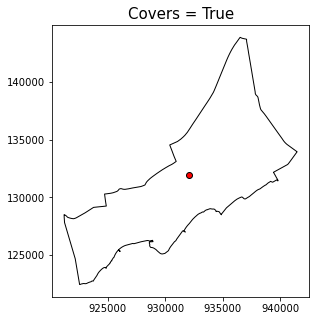

In [584]:
fig, ax = plt.subplots(figsize=(20,5))

nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('centroid_column').plot(ax=ax, 
                                                                               color='red', 
                                                                               edgecolor='black')

nta_shape[nta_shape['ntacode'] == 'SI01'].plot(ax=ax, 
                                               color='none', 
                                               edgecolor='black')

ax.set_title('Covers = True', fontsize=15)

Text(0.5, 1.0, 'Covers = False')

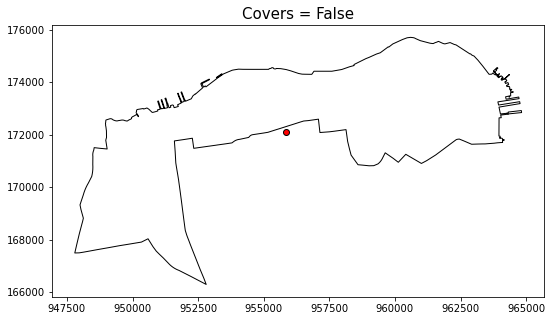

In [585]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[123]].set_geometry('centroid_column').plot(ax=ax, 
                                                           color='red', 
                                                           edgecolor='black')

nta_shape.iloc[[123]].plot(ax=ax, 
                           color='none', 
                           edgecolor='black')

ax.set_title('Covers = False', fontsize=15)

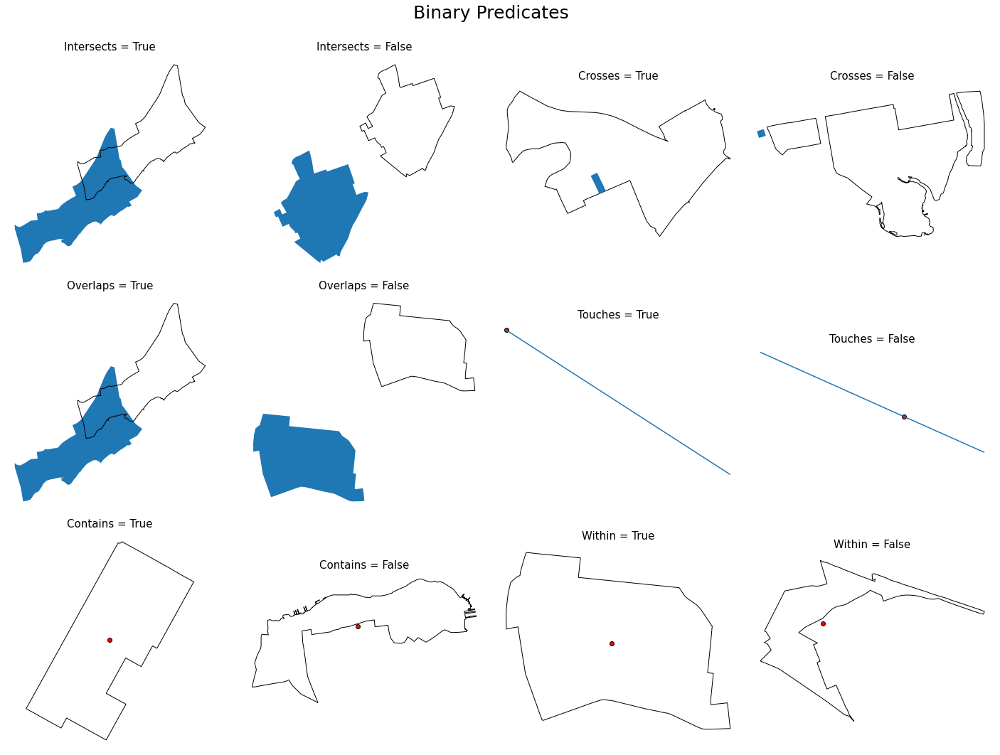

In [586]:
# plotting examples of binary predicates
fig, axs = plt.subplots(3, 4, sharey=False, figsize=(20,15))

# first plot
nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('geometry').plot(ax=axs[0, 0])                                            
nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('offset').plot(ax=axs[0, 0], 
                                                                      color='none', 
                                                                      edgecolor='black')
axs[0, 0].set_title('Intersects = True', fontsize=15)
axs[0, 0].set_title('Intersects = True', fontsize=15)
axs[0, 0].axis('off')

nta_shape.iloc[[9]].set_geometry('geometry').plot(ax=axs[0, 1])
nta_shape.iloc[[9]].set_geometry('offset').plot(ax=axs[0, 1], 
                                                color='none', 
                                                edgecolor='black')
nta_shape.iloc[[9]].plot(ax=axs[0, 1], alpha=.5)
axs[0, 1].set_title('Intersects = False', fontsize=15)
axs[0, 1].axis('off')


# second plot
streets_crosses.plot(ax=axs[0, 2], 
                    linewidth=10)
nta_shape_crosses.plot(ax=axs[0, 2], 
                       color='none',
                       edgecolor='black')
axs[0, 2].set_title('Crosses = True', fontsize=15)
axs[0, 2].axis('off')

streets.iloc[[70]].plot(ax=axs[0, 3], 
                        linewidth=10)
nta_shape.iloc[[70]].plot(ax=axs[0, 3], 
                          color='none',
                          edgecolor='black')
axs[0, 3].set_title('Crosses = False', fontsize=15)
axs[0, 3].axis('off')


# third plot
nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('geometry').plot(ax=axs[1, 0])
nta_shape[nta_shape['ntacode'] == 'SI01'].set_geometry('offset').plot(ax=axs[1, 0], 
                                                                      color='none', 
                                                                      edgecolor='black')
axs[1, 0].set_title('Overlaps = True', fontsize=15)
axs[1, 0].axis('off')

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=axs[1, 1])
nta_shape.iloc[[1]].set_geometry('offset').plot(ax=axs[1, 1], 
                                                color='none', 
                                                edgecolor='black')
axs[1, 1].set_title('Overlaps = False', fontsize=15)
axs[1, 1].axis('off')


# fourth plot
streets.iloc[[6]].set_geometry('representative_point').plot(ax=axs[1, 2], 
                                                            color='red', 
                                                            edgecolor='black')
streets.iloc[[6]].plot(ax=axs[1, 2])
axs[1, 2].set_title('Touches = True', fontsize=15)
axs[1, 2].axis('off')

streets.iloc[[3]].set_geometry('representative_point').plot(ax=axs[1, 3], 
                                                            color='red', 
                                                            edgecolor='black')
streets.iloc[[3]].plot(ax=axs[1, 3])
axs[1, 3].set_title('Touches = False', fontsize=15)
axs[1, 3].axis('off')


# fifth plot
nta_shape.iloc[[59]].set_geometry('centroid_column').plot(ax=axs[2, 0], 
                                                          color='red', 
                                                          edgecolor='black')
nta_shape.iloc[[59]].plot(ax=axs[2, 0], 
                          color='none', 
                          edgecolor='black')
axs[2, 0].set_title('Contains = True', fontsize=15)
axs[2, 0].axis('off')

nta_shape.iloc[[123]].set_geometry('centroid_column').plot(ax=axs[2, 1], 
                                                          color='red', 
                                                          edgecolor='black')
nta_shape.iloc[[123]].plot(ax=axs[2, 1], 
                           color='none', 
                           edgecolor='black')
axs[2, 1].set_title('Contains = False', fontsize=15)
axs[2, 1].axis('off')

# sixth plot
nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=axs[2, 2], 
                                                  color='none', 
                                                  edgecolor='black')
nta_shape.iloc[[1]].set_geometry('centroid_column').plot(ax=axs[2, 2], 
                                                         color='red', 
                                                         edgecolor='black')
axs[2, 2].set_title('Within = True', fontsize=15)
axs[2, 2].axis('off')

nta_shape[nta_shape['ntacode'] == 'BX03'].set_geometry('geometry').plot(ax=axs[2, 3], 
                                                                        color='none', 
                                                                        edgecolor='black')
nta_shape[nta_shape['ntacode'] == 'BX03'].set_geometry('centroid_column').plot(ax=axs[2, 3], 
                                                                               color='red', 
                                                                               edgecolor='black')
axs[2, 3].set_title('Within = False', fontsize=15)
axs[2, 3].axis('off')


fig.suptitle("Binary Predicates\n", fontsize=25)
fig.subplots_adjust(top=0.90)
fig.tight_layout()
plt.savefig('figures/12-2-a.png', facecolor='w')

## 12.3 Set-Theoretic Methods

<AxesSubplot:>

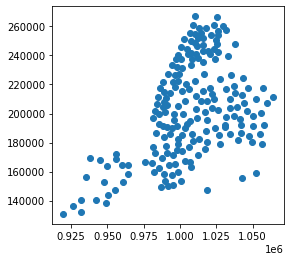

In [587]:
# returning the centroid of our shape and saving as a new column called 'centroid_column'
nta_shape['centroid_column'] = nta_shape.centroid

# setting our geometry as the new centroid column and then plotting 
nta_shape.set_geometry('centroid_column').plot()

<AxesSubplot:>

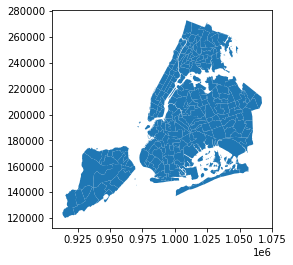

In [588]:
nta_shape.set_geometry('geometry').plot()

In [589]:
# Returns a ``GeoSeries`` of the points in each geometry that
# are not in `other`.
nta_shape['centroid_column'].difference(nta_shape['geometry']).tail(10)

185    POINT (1026287.839 257176.077)
186                       POINT EMPTY
187                       POINT EMPTY
188                       POINT EMPTY
189                       POINT EMPTY
190                       POINT EMPTY
191                       POINT EMPTY
192                       POINT EMPTY
193                       POINT EMPTY
194                       POINT EMPTY
dtype: geometry

In [590]:
# Returns a ``GeoSeries`` of the intersection of points in each
# geometry with `other`.
nta_shape.centroid_column.intersection(nta_shape['geometry']).tail(10)

185                       POINT EMPTY
186    POINT (1015935.795 235159.733)
187    POINT (1018420.220 180100.811)
188    POINT (1007276.809 233426.298)
189    POINT (1005170.348 241310.582)
190    POINT (1018302.506 208718.263)
191    POINT (1014131.108 208283.618)
192     POINT (947314.395 153003.988)
193     POINT (960498.576 153072.058)
194     POINT (949131.449 138438.057)
dtype: geometry

In [591]:
# Returns a ``GeoSeries`` of the symmetric difference of points in
# each geometry with `other`.

# For each geometry, the symmetric difference consists of points in the
# geometry not in `other`, and points in `other` not in the geometry.

nta_shape.centroid.symmetric_difference(nta_shape['geometry']).tail(10)

185    GEOMETRYCOLLECTION (POINT (1026287.839 257176....
186    POLYGON ((1016247.313 239127.521, 1016255.291 ...
187    POLYGON ((1022766.926 184983.591, 1022787.087 ...
188    MULTIPOLYGON (((1012821.806 229228.265, 101278...
189    POLYGON ((1008620.929 246511.234, 1008613.113 ...
190    POLYGON ((1020851.425 210703.673, 1020860.825 ...
191    POLYGON ((1014244.431 211378.830, 1014343.991 ...
192    POLYGON ((957104.002 161758.179, 957233.148 16...
193    POLYGON ((966187.482 153868.426, 966187.523 15...
194    MULTIPOLYGON (((951420.092 139894.411, 951856....
dtype: geometry

Text(0.5, 1.0, 'symmetric difference')

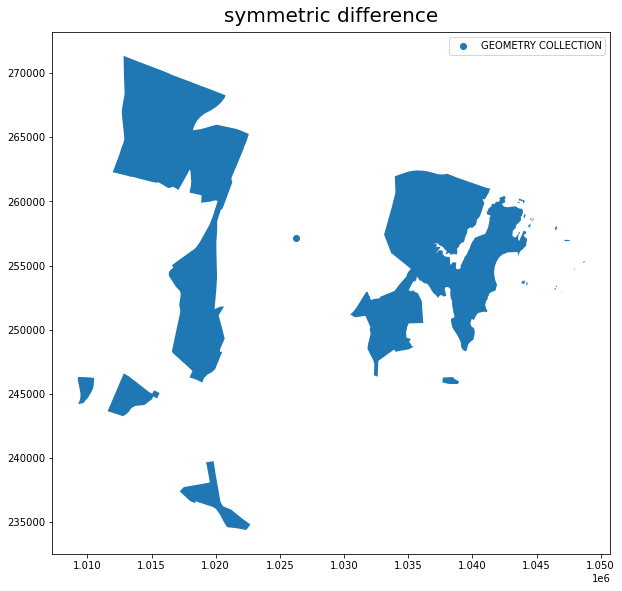

In [592]:
fig, ax = plt.subplots(figsize=(10,15)) 

nta_shape.centroid.symmetric_difference(nta_shape['geometry']).iloc[[185]].plot(ax=ax, 
                                                                                label='GEOMETRY COLLECTION')
plt.legend(loc=1)
plt.title('symmetric difference', fontsize=20, pad=10)

In [593]:
# Returns a ``GeoSeries`` of the union of points in each geometry with
# `other`.
nta_shape.centroid.union(nta_shape['geometry']).tail(10)

185    GEOMETRYCOLLECTION (POINT (1026287.839 257176....
186    POLYGON ((1016247.313 239127.521, 1016255.291 ...
187    POLYGON ((1022766.926 184983.591, 1022787.087 ...
188    MULTIPOLYGON (((1012821.806 229228.265, 101278...
189    POLYGON ((1008620.929 246511.234, 1008613.113 ...
190    POLYGON ((1020851.425 210703.673, 1020860.825 ...
191    POLYGON ((1014244.431 211378.830, 1014343.991 ...
192    POLYGON ((957104.002 161758.179, 957233.148 16...
193    POLYGON ((966187.482 153868.426, 966187.523 15...
194    MULTIPOLYGON (((951420.092 139894.411, 951856....
dtype: geometry

Text(0.5, 1.0, 'union')

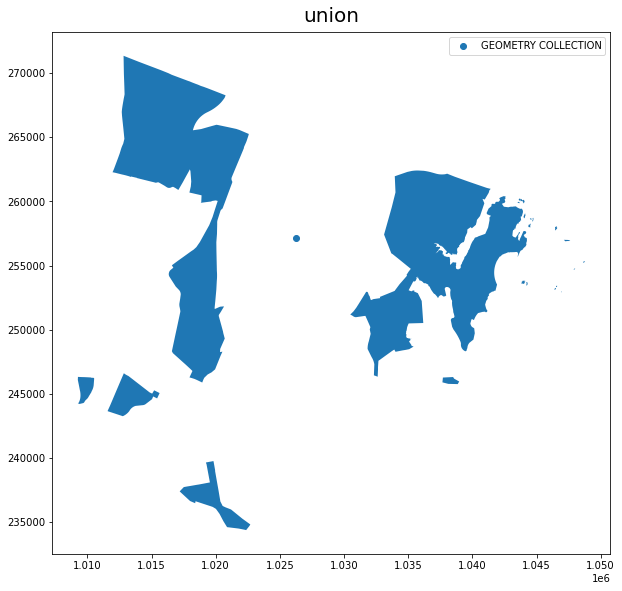

In [594]:
fig, ax = plt.subplots(figsize=(10,15)) 

nta_shape.centroid.union(nta_shape['geometry']).iloc[[185]].plot(ax=ax, 
                                                                 label='GEOMETRY COLLECTION')
plt.legend(loc=1)
plt.title('union', fontsize=20, pad=10)

## 12.4 Constructive Methods

In [595]:
# reading in nta shape data
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.to_crs(epsg=2263, inplace=True)
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


### 12.4.1 Buffer

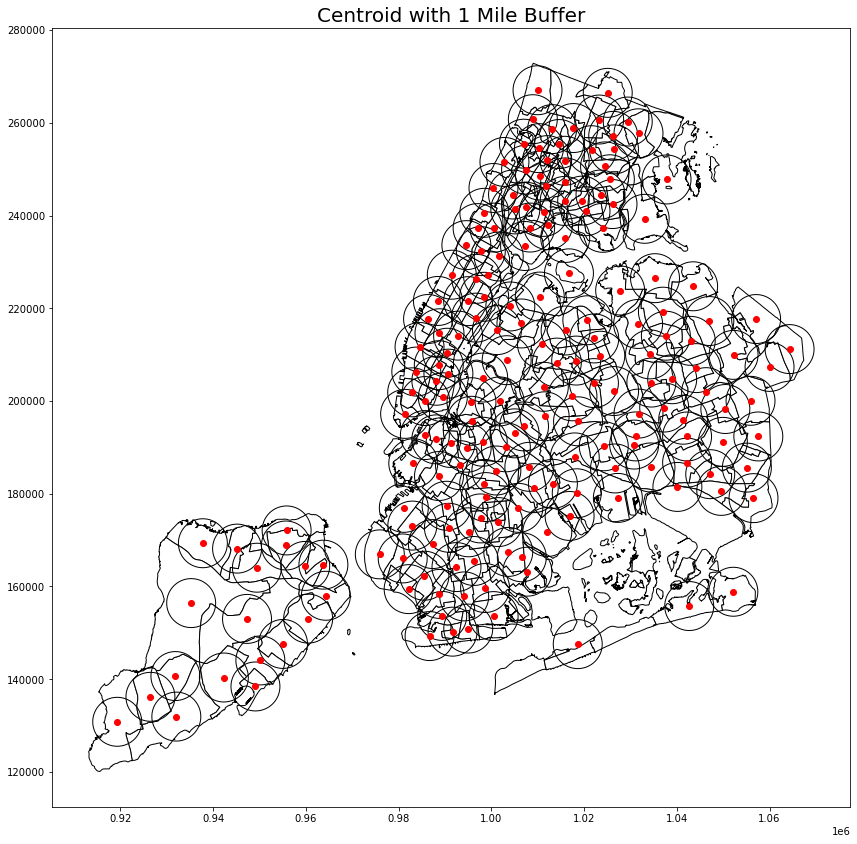

In [596]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

# plotting a one mile radius buffer of the nta centroid
nta_shape.centroid.buffer(5280).plot(ax=ax, 
                                     color='none', 
                                     edgecolor='black')

nta_shape.centroid.plot(ax=ax, 
                        color='red', 
                        edgecolor='red')

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=0)

ax.set_title('Centroid with 1 Mile Buffer', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-a.png', facecolor='w')

### 12.4.2 Convex Hull

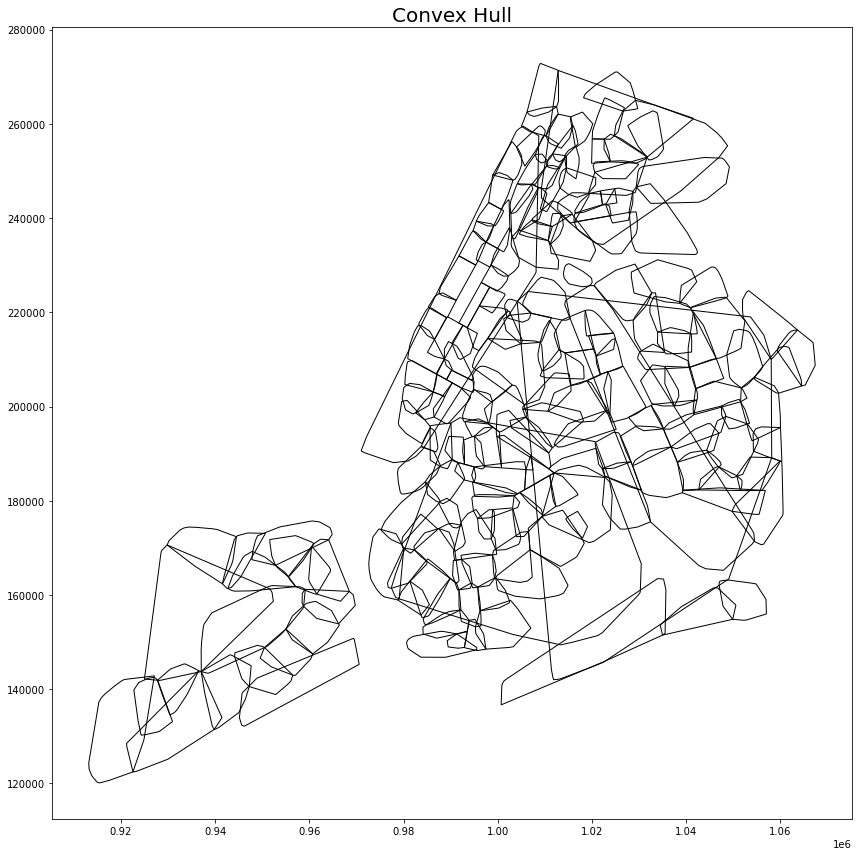

In [597]:
fig, ax = plt.subplots(figsize=(12,12)) 

# Returns a ``GeoSeries`` of geometries representing the convex hull
# of each geometry.

# The convex hull of a geometry is the smallest convex `Polygon`
# containing all the points in each geometry, unless the number of points
# in the geometric object is less than three. For two points, the convex
# hull collapses to a `LineString`; for 1, a `Point`.

nta_shape['geometry'].convex_hull.plot(ax=ax, 
                                       color='none', 
                                       edgecolor='black')

ax.set_title('Convex Hull', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-b.png', facecolor='w')

### 12.4.3 Envelope

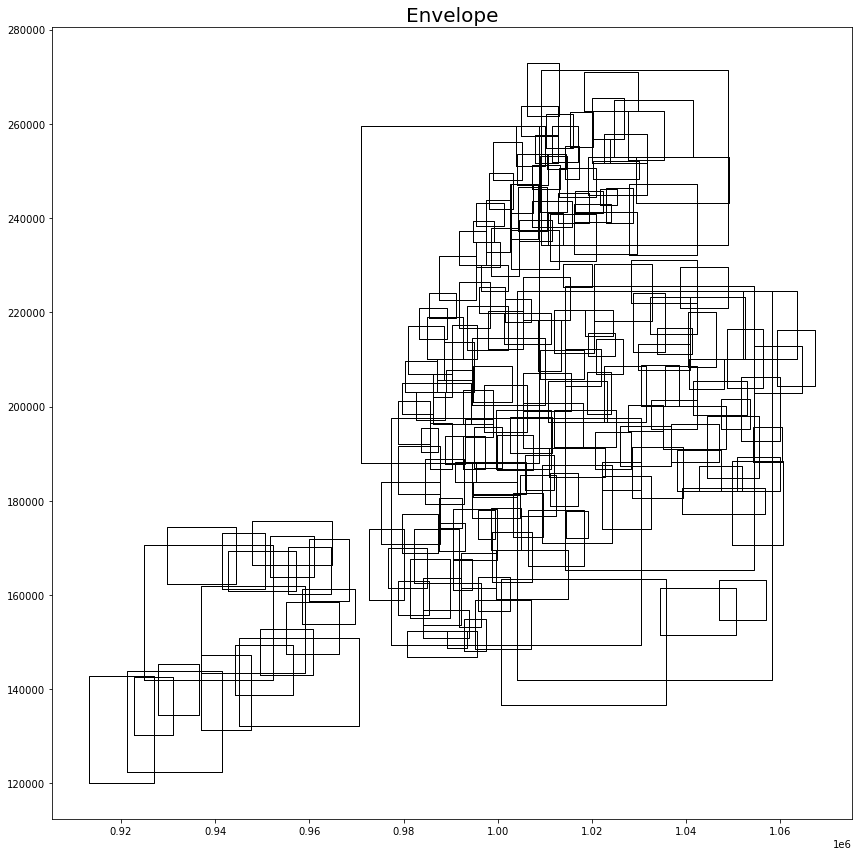

In [598]:
fig, ax = plt.subplots(figsize=(12,12)) 

# Returns a ``GeoSeries`` of geometries representing the envelope of
# each geometry.

# The envelope of a geometry is the bounding rectangle. That is, the
# point or smallest rectangular polygon (with sides parallel to the
# coordinate axes) that contains the geometry.

nta_shape['geometry'].envelope.plot(ax=ax, 
                                    color='none', 
                                    edgecolor='black')

ax.set_title('Envelope', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-c.png', facecolor='w')

### 12.4.4 Simplify

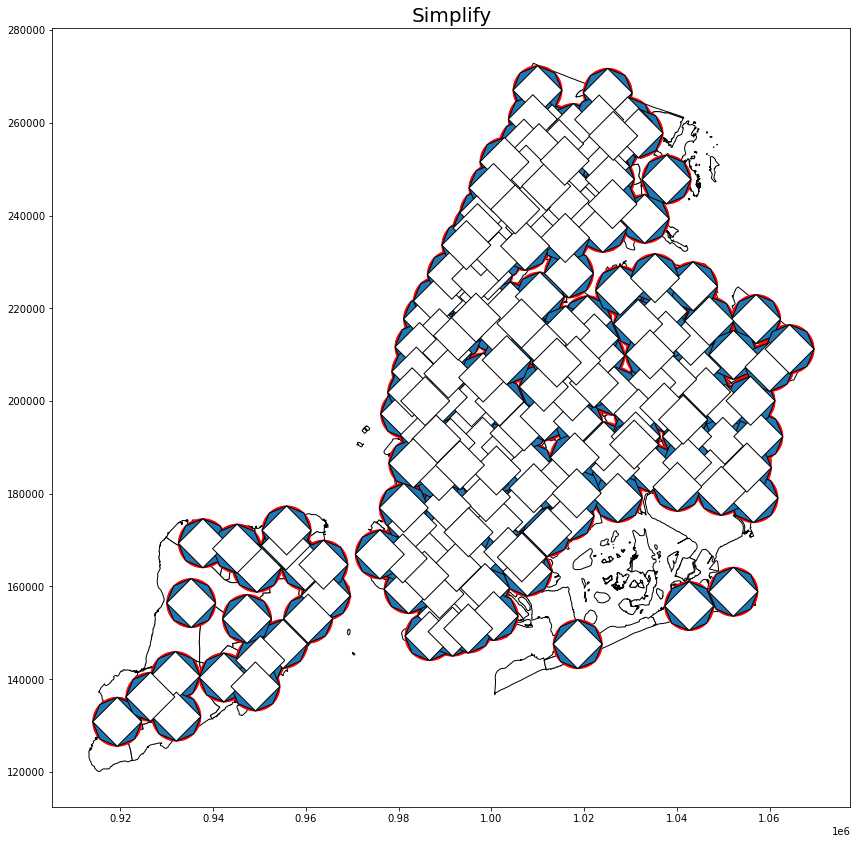

In [599]:
fig, ax = plt.subplots(figsize=(12,12))

nta_shape.centroid.buffer(5280).plot(ax=ax, 
                                     color='red', 
                                     edgecolor='red')

nta_shape.centroid.buffer(5280).simplify(1000).plot(ax=ax, 
                                                    edgecolor='black')

nta_shape.centroid.buffer(5280).simplify(10000).plot(ax=ax, 
                                                     color='white', 
                                                     edgecolor='black')

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black',
               zorder=0)

ax.set_title('Simplify', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-d.png', facecolor='w')

## 12.5 Affine Transformations

### 12.5.1 Rotate

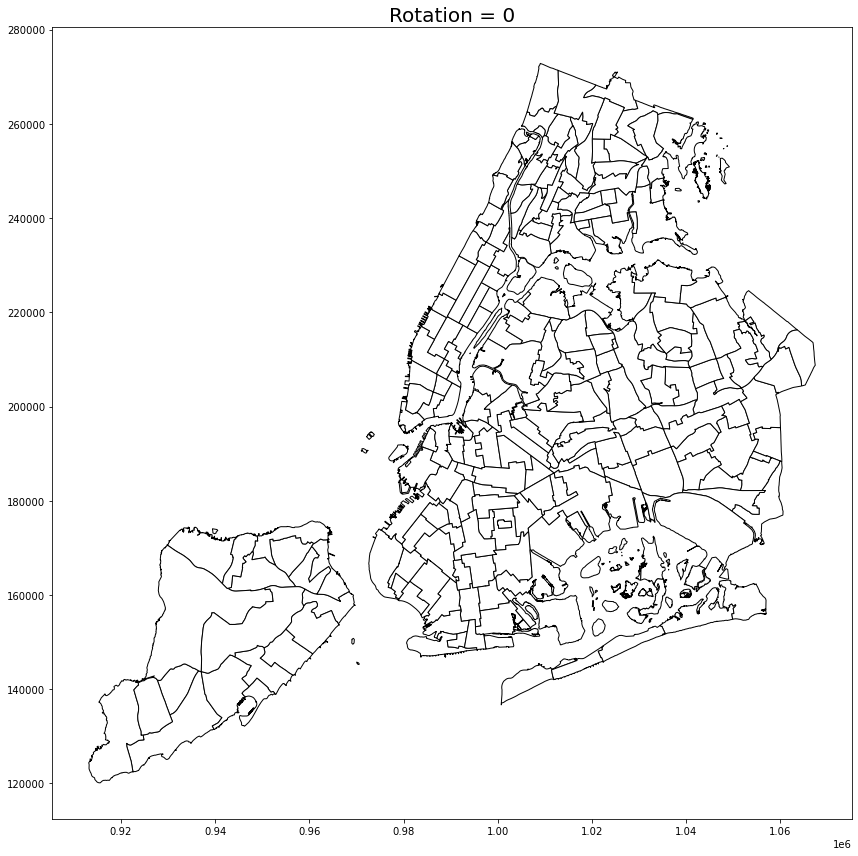

In [600]:
fig, ax = plt.subplots(figsize=(12,12))

# rotate the nta shapes 0 degrees.
nta_shape.rotate(0).plot(ax=ax, 
                         color='white', 
                         edgecolor='black')

ax.set_title('Rotation = 0', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-a.png', facecolor='w')

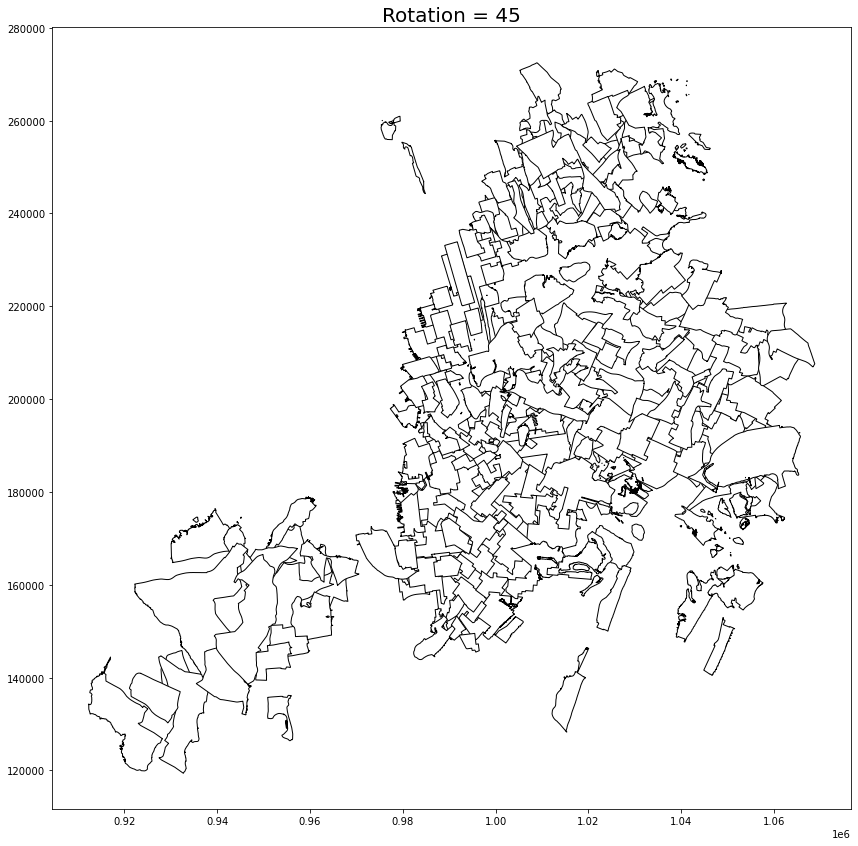

In [601]:
fig, ax = plt.subplots(figsize=(12,12))

# rotate the nta shapes 45 degrees.
nta_shape.rotate(45).plot(ax=ax, 
                          color='white', 
                          edgecolor='black')

ax.set_title('Rotation = 45', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-b.png', facecolor='w')

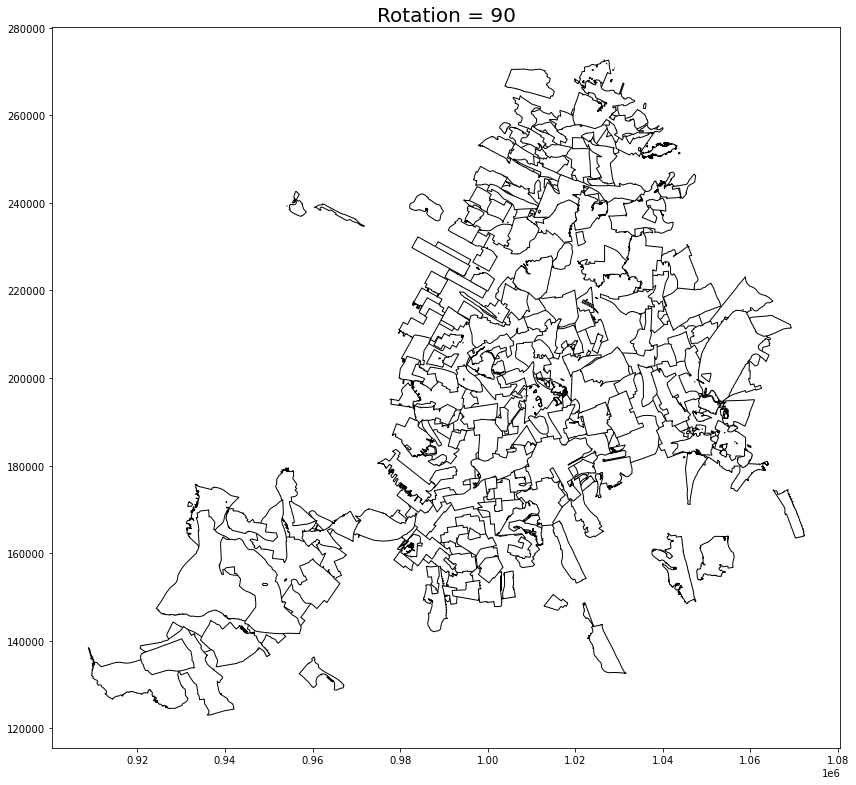

In [602]:
fig, ax = plt.subplots(figsize=(12,12))


# rotate the nta shapes 90 degrees.
nta_shape.rotate(90).plot(ax=ax, 
                          color='white', 
                          edgecolor='black')

ax.set_title('Rotation = 90', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-c.png', facecolor='w')

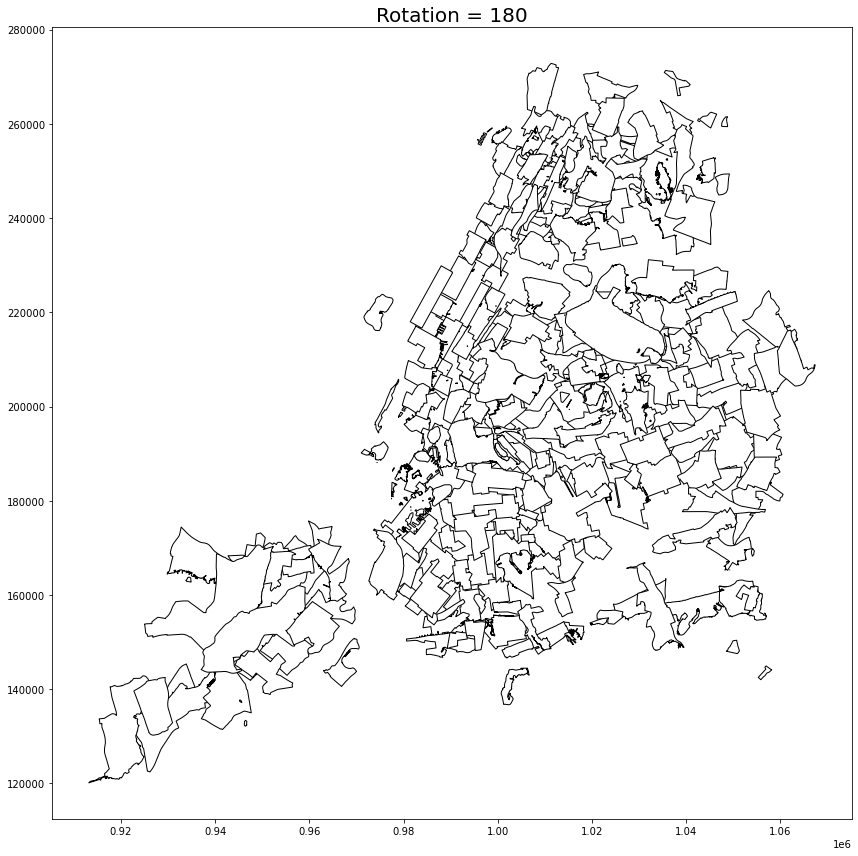

In [603]:
fig, ax = plt.subplots(figsize=(12,12))

# rotate the nta shapes 180 degrees.
nta_shape.rotate(180).plot(ax=ax, 
                           color='white', 
                           edgecolor='black')

ax.set_title('Rotation = 180', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-d.png', facecolor='w')

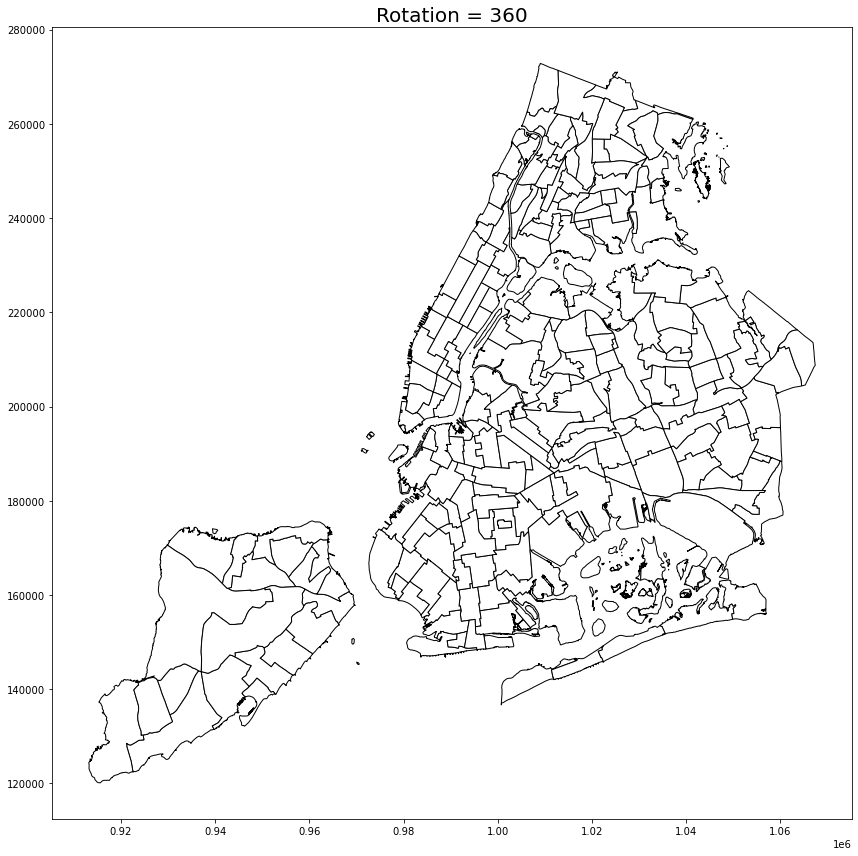

In [604]:
fig, ax = plt.subplots(figsize=(12,12))

# rotate the nta shapes 360 degrees
nta_shape.rotate(360).plot(ax=ax, 
                           color='white', 
                           edgecolor='black')

ax.set_title('Rotation = 360', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-e.png', facecolor='w')

### 12.5.2 Scale

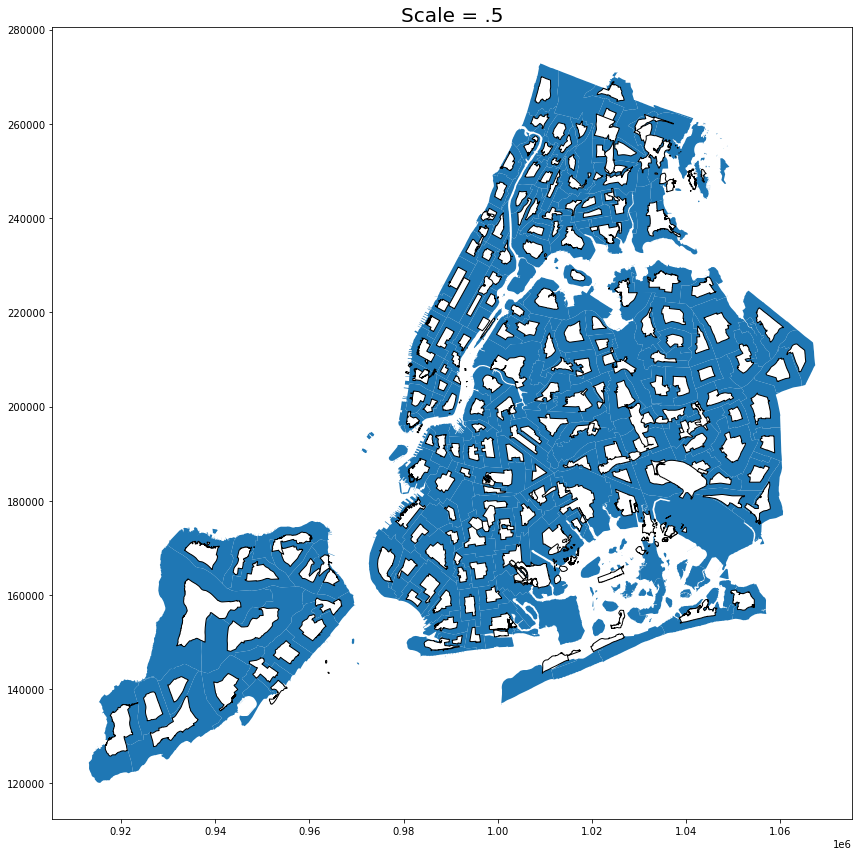

In [605]:
fig, ax = plt.subplots(figsize=(12,12))

# Returns a ``GeoSeries`` with scaled geometries.

# The geometries can be scaled by different factors along each
# dimension. Negative scale factors will mirror or reflect coordinates.

nta_shape.scale(xfact=.5, yfact=.5).plot(ax=ax, 
                                         color='white', 
                                         edgecolor='black')

nta_shape.plot(ax=ax, 
               zorder=0)

ax.set_title('Scale = .5', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-f.png', facecolor='w')

### 12.5.3 Skew

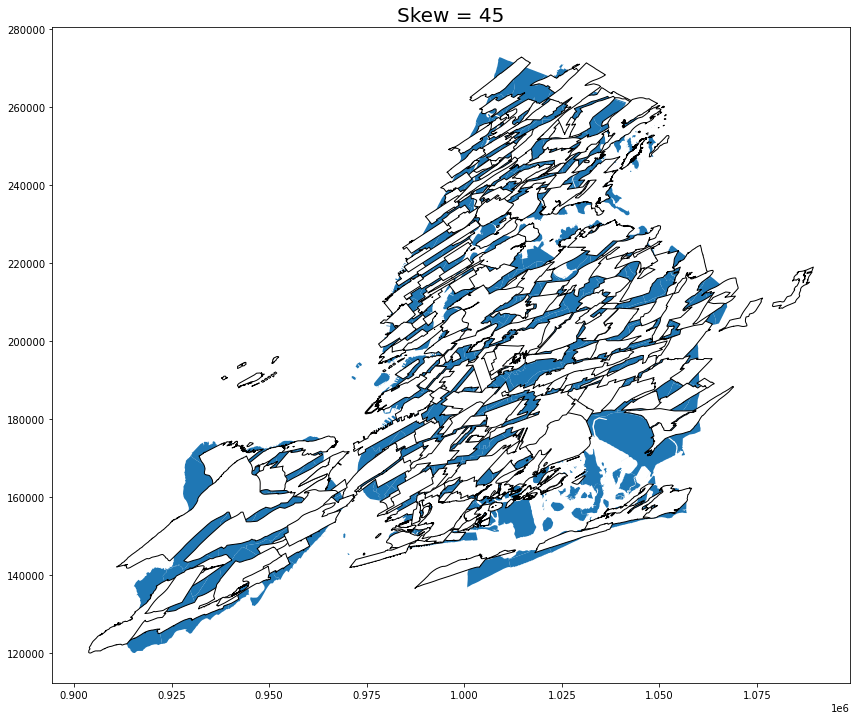

In [606]:
fig, ax = plt.subplots(figsize=(12,12))

# The geometries are sheared by angles along the x and y dimensions.

nta_shape.skew(45).plot(ax=ax, 
                        color='white', 
                        edgecolor='black')

nta_shape.plot(ax=ax, 
               zorder=0)

ax.set_title('Skew = 45', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-g.png', facecolor='w')

### 12.5.4 Translate/Offset

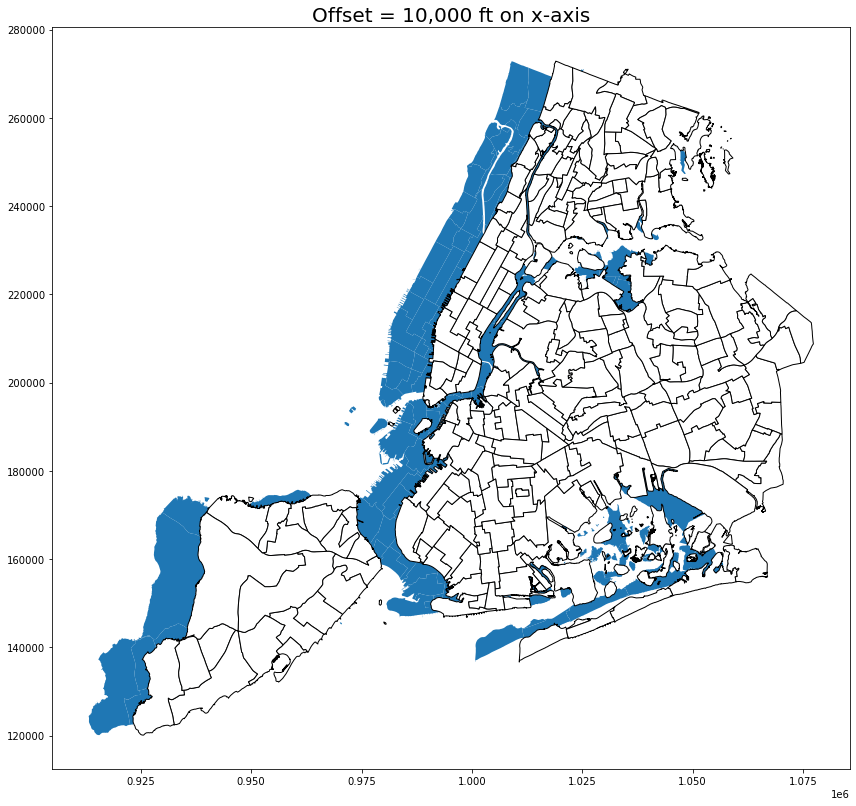

In [607]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

# offset the nta shapes 10,000 feet to the right along the x-axis.
nta_shape.translate(10000).plot(ax=ax, 
                                color='white', 
                                edgecolor='black')

nta_shape.plot(ax=ax, 
               zorder=0)

ax.set_title('Offset = 10,000 ft on x-axis', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-h.png', facecolor='w')